In [1]:
import sys 
sys.path.append('..')
from Data import gener_dt
from Tools import MI, Imputers, Metrics, HG_tools

import numpy as np
import pandas as pd
import statsmodels.api as sm
import math

import pyampute
from pyampute.ampute import MultivariateAmputation

from tqdm import tqdm
from importlib import reload

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("ticks")
%matplotlib inline

In [7]:
reload(Imputers)
reload(MI)
reload(gener_dt)
reload(Metrics)
reload(HG_tools)

<module 'Tools.HG_tools' from '/Users/ash/Desktop/MICE/PY/Tools/HG_tools.py'>

In [171]:
#distrs = ['norm', 'unif', 'lognorm1', 'lognorm2', 'gamma1', 'gamma2', 'norm_mix1', 'norm_mix2']

In [172]:
# def imp(n_cycle, scenar, metrica): 
    
#     if scenar in ['lr_quadr', 'logr_quadr']:
#         col2 = "X^2"
#     else:
#         col2 = "XZ"
    
#     df_fin = pd.DataFrame(columns = ['dist', 'estimator', 'col', metrica])

#     for dist in tqdm(distrs):
#         print(dist)
#         for n_c in tqdm(np.arange(n_cycle)):

#             df = gener_dt.gener(X_distr = dist, scenar = scenar)
#             X_miss = amp(df)
            
            
#             #iceRF
#             #-------------------
#             #---------------------------
#             ICE_RF_imp = Imputers.impute(X_miss, imputer_name = 'ice_rf')   
#             ICE_RF_res_X, ICE_RF_res_col2 = Metrics.metr(df, X_miss, 'ice_rf', ICE_RF_imp, metrica, col2)

#             if ICE_RF_res_col2 is None:
#                 df_fin = pd.concat([df_fin, 
#                               pd.DataFrame.from_records([{'dist':dist, 'estimator':'ice_rf', 'col':'X', metrica: ICE_RF_res_X}])])
#             else:
#                 df_fin = pd.concat([df_fin, 
#                               pd.DataFrame.from_records([{'dist':dist, 'estimator':'ice_rf', 'col':'X', metrica: ICE_RF_res_X}]),
#                               pd.DataFrame.from_records([{'dist':dist, 'estimator':'ice_rf', 'col':col2, metrica: ICE_RF_res_col2}])
#                                         ])
                               
#             #miceRF
#             #-------------------
#             #---------------------------
#             MICE_RF_imp = Imputers.impute(X_miss, imputer_name = 'mice_rf')
#             MICE_RF_res_X, MICE_RF_res_col2 = Metrics.metr(df, X_miss, 'mice_rf', MICE_RF_imp, metrica, col2)
            
#             if MICE_RF_res_col2 is None:
#                 df_fin = pd.concat([df_fin, 
#                               pd.DataFrame.from_records([{'dist':dist, 'estimator':'mice_rf', 'col':'X', metrica: MICE_RF_res_X}])])
#             else:
#                 df_fin = pd.concat([df_fin, 
#                               pd.DataFrame.from_records([{'dist':dist, 'estimator':'mice_rf', 'col':'X', metrica: MICE_RF_res_X}]),
#                               pd.DataFrame.from_records([{'dist':dist, 'estimator':'mice_rf', 'col':col2, metrica: MICE_RF_res_col2}])
#                                         ])
            
#             #miceBR
#             #-------------------
#             #---------------------------
# #             MICE_BR_imp = Imputers.impute(X_miss, imputer_name = 'mice_br')
# #             MICE_BR_res = metr(df, X_miss, MICE_BR_imp, metrica, col2)
            
            
#             #knn
#             #-------------------
#             #---------------------------
#             knn_imp = Imputers.impute(X_miss, imputer_name = 'knn')
#             knn_res_X, knn_res_col2 = Metrics.metr(df, X_miss, 'knn', knn_imp, metrica, col2)
            
#             if knn_res_col2 is None:
#                 df_fin = pd.concat([df_fin, 
#                               pd.DataFrame.from_records([{'dist':dist, 'estimator':'knn', 'col':'X', metrica: knn_res_X}])])
#             else:
#                 df_fin = pd.concat([df_fin, 
#                               pd.DataFrame.from_records([{'dist':dist, 'estimator':'knn', 'col':'X', metrica: knn_res_X}]),
#                               pd.DataFrame.from_records([{'dist':dist, 'estimator':'knn', 'col':col2, metrica: knn_res_col2}])
#                                         ])



#     return df_fin

In [3]:
def metr_func(X_miss, imp_name, df, metrica, col2, df_fin, dist, scenar):
    meth_imp = Imputers.impute(X_miss, imp_name)   
    res_X, res_col2 = Metrics.metr(df, X_miss, imp_name, meth_imp, metrica, col2, scenar)

    if res_col2 is None:
        df_fin = pd.concat([df_fin, 
                      pd.DataFrame.from_records([{'dist':dist, 'estimator':imp_name, 'col':'X', metrica: res_X}])])
    else:
        df_fin = pd.concat([df_fin, 
                      pd.DataFrame.from_records([{'dist':dist, 'estimator':imp_name, 'col':'X', metrica: res_X}]),
                      pd.DataFrame.from_records([{'dist':dist, 'estimator':imp_name, 'col':col2, metrica: res_col2}])
                            ])
    
    return df_fin

In [8]:
distrs = ['norm', 'unif', 'lognorm1', 'lognorm2', 'gamma1', 'gamma2', 'norm_mix1', 'norm_mix2']

def imp(n_cycle, scenar, metrica): 
    
    if scenar in ['lr_quadr', 'logr_quadr']:
        col2 = "X^2"
    else:
        col2 = "XZ"
    
    df_fin = pd.DataFrame(columns = ['dist', 'estimator', 'col', metrica])

    for dist in tqdm(distrs):
        print(dist)
        for n_c in np.arange(n_cycle):

            df = gener_dt.gener(X_distr = dist, scenar = scenar)
            #X_miss = HG_tools.amp(df)
            #X_miss = HG_tools.amp_MNAR(df)
            X_miss = HG_tools.amp_45(df)
            
            
            
            #iceRF
            #---------------------------
            # df_fin = metr_func(X_miss, 'ice_rf', df, metrica, col2, df_fin, dist, scenar)
            
                               
            #miceRF
            #---------------------------
            df_fin = metr_func(X_miss, 'mice_rf', df, metrica, col2, df_fin, dist, scenar)
            
            
            #miceBR
            #---------------------------
            df_fin = metr_func(X_miss, 'mice_br', df, metrica, col2, df_fin, dist, scenar)
            
            #knn
            #---------------------------
            df_fin = metr_func(X_miss, 'knn', df, metrica, col2, df_fin, dist, scenar)



    return df_fin

In [5]:
def plott(res, sc_num, metrica, col, xlim_from, xlim_to):
    plt.figure(figsize =  (6, 7))

    sns.boxplot(x = metrica, y = 'dist', 
                data = res[res['col'] == col], 
                palette = "colorblind",
                hue = 'estimator')

    plt.grid(alpha = 0.5, linestyle = '--', linewidth = 0.6)
    plt.title("Scen." + str(sc_num) + ", " + str(metrica) + " by " + str(col) + ", 100cy.")
    plt.tight_layout()
    plt.xlim(xlim_from, xlim_to)
    plt.show()
    
def plott_nrmse(res, sc_num, metrica, xlim_from, xlim_to):
    plt.figure(figsize =  (6, 7))

    sns.boxplot(x = metrica, y = 'dist', 
                data = res, 
                palette = "colorblind",
                hue = 'estimator')

    plt.grid(alpha = 0.5, linestyle = '--', linewidth = 0.6)
    plt.title("Scen." + str(sc_num) + ", " + str(metrica) + " by " + ", 100cy.")
    plt.tight_layout()
    plt.xlim(xlim_from, xlim_to)
    plt.show()

In [ ]:
# ['lr_quadr', 'logr_quadr', 'lr_inter', 'logr_inter']

# MAR 0.45

In [14]:
%%time 

i = 3
for sc in tqdm(['lr_inter', 'logr_inter']):
    print(sc)
#for sc in tqdm(['lr_quadr']):
    for metric in tqdm(['rel_bias', 'nrmse', 'relb_coef']):
        print(metric)
        tmp = imp(n_cycle = 50, scenar = sc, metrica = metric)  
        tmp.to_csv(f"/Users/ash/Desktop/MICE/PY/fin_res_csv/0.45_miss/{metric}_sc{i}.csv", index=False)
    i += 1

  0%|          | 0/2 [00:00<?, ?it/s]

lr_inter



  0%|          | 0/3 [00:00<?, ?it/s]

rel_bias




  0%|          | 0/8 [00:00<?, ?it/s]2023-04-12 17:22:35,092 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


norm


2023-04-12 17:22:37,958 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:22:40,657 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:22:43,342 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:22:45,992 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:22:48,646 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:22:51,395 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:22:54,087 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:22:56,814 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:22:59,462 [WARNING] Indicated weig

unif


2023-04-12 17:24:51,860 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:24:54,544 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:24:57,233 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:24:59,901 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:25:02,574 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:25:05,287 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:25:07,954 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:25:10,627 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:25:13,307 [WARNING] Indicated weig

lognorm1


2023-04-12 17:27:06,779 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:27:09,465 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:27:12,195 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:27:14,893 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:27:17,584 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:27:20,263 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:27:22,971 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:27:25,636 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:27:28,339 [WARNING] Indicated weig

lognorm2


2023-04-12 17:29:21,797 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:29:24,523 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:29:27,234 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:29:29,935 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:29:32,639 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:29:35,367 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:29:38,106 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:29:40,824 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:29:43,532 [WARNING] Indicated weig

gamma1


2023-04-12 17:31:37,712 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:31:40,407 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:31:43,123 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:31:45,863 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:31:48,581 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:31:51,287 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:31:53,971 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:31:56,689 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:31:59,401 [WARNING] Indicated weig

gamma2


2023-04-12 17:33:53,619 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:33:56,342 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:33:59,049 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:34:01,728 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:34:04,441 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:34:07,136 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:34:09,861 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:34:12,559 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:34:15,273 [WARNING] Indicated weig

norm_mix1


2023-04-12 17:36:08,769 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:36:11,474 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:36:14,187 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:36:16,938 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:36:19,606 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:36:22,281 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:36:24,978 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:36:27,693 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:36:30,387 [WARNING] Indicated weig

norm_mix2


2023-04-12 17:38:24,360 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:38:27,058 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:38:29,771 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:38:32,488 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:38:35,191 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:38:37,939 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:38:40,673 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:38:43,390 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:38:46,153 [WARNING] Indicated weig

nrmse




  0%|          | 0/8 [00:00<?, ?it/s]2023-04-12 17:40:37,887 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


norm


2023-04-12 17:40:40,554 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:40:43,225 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:40:45,876 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:40:48,591 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:40:51,253 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:40:53,905 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:40:56,576 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:40:59,232 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:41:01,935 [WARNING] Indicated weig

unif


2023-04-12 17:42:54,144 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:42:56,872 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:42:59,597 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:43:02,288 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:43:05,109 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:43:07,831 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:43:10,506 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:43:13,282 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:43:15,973 [WARNING] Indicated weig

lognorm1


2023-04-12 17:45:08,646 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:45:11,333 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:45:14,021 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:45:16,716 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:45:19,541 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:45:22,222 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:45:24,921 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:45:27,626 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:45:30,333 [WARNING] Indicated weig

lognorm2


2023-04-12 17:47:23,641 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:47:26,353 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:47:29,106 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:47:31,825 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:47:34,531 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:47:37,263 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:47:39,973 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:47:42,700 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:47:45,428 [WARNING] Indicated weig

gamma1


2023-04-12 17:49:39,658 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:49:42,363 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:49:45,056 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:49:47,770 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:49:50,491 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:49:53,230 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:49:55,949 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:49:58,670 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:50:01,408 [WARNING] Indicated weig

gamma2


2023-04-12 17:51:55,622 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:51:58,316 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:52:01,070 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:52:03,765 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:52:06,453 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:52:09,142 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:52:11,819 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:52:14,548 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:52:17,282 [WARNING] Indicated weig

norm_mix1


2023-04-12 17:54:11,010 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:54:13,703 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:54:16,423 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:54:19,123 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:54:21,842 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:54:24,603 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:54:27,299 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:54:29,993 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:54:32,709 [WARNING] Indicated weig

norm_mix2


2023-04-12 17:56:26,863 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:56:29,603 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:56:32,361 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:56:35,083 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:56:37,809 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:56:40,525 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:56:43,254 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:56:45,971 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:56:48,729 [WARNING] Indicated weig

relb_coef




  0%|          | 0/8 [00:00<?, ?it/s]2023-04-12 17:58:40,812 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


norm


2023-04-12 17:58:43,530 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:58:46,236 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:58:48,923 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:58:51,622 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:58:54,308 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:58:57,023 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:58:59,711 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:59:02,386 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 17:59:05,052 [WARNING] Indicated weig

unif


2023-04-12 18:00:58,053 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:01:00,762 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:01:03,482 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:01:06,184 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:01:08,877 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:01:11,572 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:01:14,257 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:01:16,963 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:01:19,662 [WARNING] Indicated weig

lognorm1


2023-04-12 18:03:13,386 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:03:16,079 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:03:18,791 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:03:21,499 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:03:24,198 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:03:26,914 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:03:29,668 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:03:32,367 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:03:35,069 [WARNING] Indicated weig

lognorm2


2023-04-12 18:05:29,096 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:05:31,841 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:05:34,565 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:05:37,343 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:05:40,097 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:05:42,823 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:05:45,567 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:05:48,319 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:05:51,073 [WARNING] Indicated weig

gamma1


2023-04-12 18:07:46,054 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:07:48,758 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:07:51,491 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:07:54,220 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:07:56,950 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:07:59,805 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:08:02,571 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:08:05,303 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:08:08,025 [WARNING] Indicated weig

gamma2


2023-04-12 18:10:03,220 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:10:05,957 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:10:08,722 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:10:11,422 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:10:14,131 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:10:16,834 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:10:19,573 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:10:22,283 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:10:25,007 [WARNING] Indicated weig

norm_mix1


2023-04-12 18:12:19,512 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:12:22,266 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:12:24,996 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:12:27,718 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:12:30,447 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:12:33,261 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:12:36,004 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:12:38,737 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:12:41,463 [WARNING] Indicated weig

norm_mix2


2023-04-12 18:14:36,479 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:14:39,234 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:14:42,001 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:14:44,746 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:14:47,487 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:14:50,257 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:14:53,011 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:14:55,778 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:14:58,514 [WARNING] Indicated weig

logr_inter



  0%|          | 0/3 [00:00<?, ?it/s]

rel_bias




  0%|          | 0/8 [00:00<?, ?it/s]2023-04-12 18:16:51,725 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:16:51,726 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:16:51,730 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-04-12 18:16:55,417 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:16:55,418 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:16:55,421 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:16:59,130 [WARNING] Indicated weights for incomp

unif


2023-04-12 18:19:59,220 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:19:59,221 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:19:59,225 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:20:02,823 [WARNING] Indicated weights for incomp

lognorm1


2023-04-12 18:22:58,981 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:22:58,982 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:22:58,985 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:23:02,722 [WARNING] Indicated weights for incomp

lognorm2


2023-04-12 18:26:01,315 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:26:01,317 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:26:01,320 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:26:04,928 [WARNING] Indicated weights for incomp

gamma1


2023-04-12 18:29:04,115 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:29:04,116 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:29:04,119 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:29:07,802 [WARNING] Indicated weights for incomp

gamma2


2023-04-12 18:32:05,691 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:32:05,692 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:32:05,695 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:32:09,314 [WARNING] Indicated weights for incomp

norm_mix1


2023-04-12 18:35:06,572 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:35:06,573 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:35:06,576 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:35:10,139 [WARNING] Indicated weights for incomp

norm_mix2


2023-04-12 18:38:07,203 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:38:07,205 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:38:07,208 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:38:10,893 [WARNING] Indicated weights for incomp

nrmse




  0%|          | 0/8 [00:00<?, ?it/s]2023-04-12 18:41:04,019 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:41:04,020 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:41:04,024 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-04-12 18:41:07,685 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:41:07,686 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:41:07,689 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:41:11,457 [WARNING] Indicated weights for incomp

unif


2023-04-12 18:44:11,118 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:44:11,119 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:44:11,122 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:44:14,673 [WARNING] Indicated weights for incomp

lognorm1


2023-04-12 18:47:10,880 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:47:10,881 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:47:10,884 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:47:14,553 [WARNING] Indicated weights for incomp

lognorm2


2023-04-12 18:50:13,230 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:50:13,231 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:50:13,234 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:50:16,919 [WARNING] Indicated weights for incomp

gamma1


2023-04-12 18:53:16,100 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:53:16,101 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:53:16,104 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:53:19,832 [WARNING] Indicated weights for incomp

gamma2


2023-04-12 18:56:17,739 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:56:17,740 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:56:17,743 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:56:21,333 [WARNING] Indicated weights for incomp

norm_mix1


2023-04-12 18:59:19,125 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 18:59:19,126 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 18:59:19,129 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 18:59:22,728 [WARNING] Indicated weights for incomp

norm_mix2


2023-04-12 19:02:19,958 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 19:02:19,959 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 19:02:19,963 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 19:02:23,619 [WARNING] Indicated weights for incomp

relb_coef




  0%|          | 0/8 [00:00<?, ?it/s]2023-04-12 19:05:17,082 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 19:05:17,083 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 19:05:17,086 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-04-12 19:05:20,890 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 19:05:20,892 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 19:05:20,895 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 19:05:24,578 [WARNING] Indicated weights for incomp

unif


2023-04-12 19:08:28,264 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 19:08:28,265 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 19:08:28,268 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 19:08:31,944 [WARNING] Indicated weights for incomp

lognorm1


2023-04-12 19:11:31,842 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 19:11:31,843 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 19:11:31,846 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 19:11:35,520 [WARNING] Indicated weights for incomp

lognorm2


2023-04-12 19:14:36,749 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 19:14:36,750 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 19:14:36,753 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 19:14:40,581 [WARNING] Indicated weights for incomp

gamma1


2023-04-12 19:17:42,863 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 19:17:42,864 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 19:17:42,867 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 19:17:46,591 [WARNING] Indicated weights for incomp

gamma2


2023-04-12 19:20:48,454 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 19:20:48,455 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 19:20:48,458 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 19:20:52,153 [WARNING] Indicated weights for incomp

norm_mix1


2023-04-12 19:23:53,310 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 19:23:53,311 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 19:23:53,314 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 19:23:56,993 [WARNING] Indicated weights for incomp

norm_mix2


2023-04-12 19:26:57,173 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-04-12 19:26:57,174 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-04-12 19:26:57,177 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-04-12 19:27:00,896 [WARNING] Indicated weights for incomp

CPU times: user 2h 14min 49s, sys: 40min 2s, total: 2h 54min 52s
Wall time: 2h 7min 22s


In [ ]:
# i = 2
# for sc in tqdm(['logr_quadr', 'logr_inter']):
#     for metric in tqdm(['rel_bias', 'nrmse']):
#         print(sc)
#         globals()[f"{metric}_scen{i}"] = imp(n_cycle = 100, scenar = sc, metrica = metric)
#     i = 4

# Relb MNAR

In [165]:
%%time 

i = 1
for sc in tqdm(['lr_quadr', 'logr_quadr', 'lr_inter', 'logr_inter']):
    print(sc)
    globals()[f"MNAR_relb_scen{i}_100cy"] = imp(n_cycle = 100, scenar = sc, metrica = 'rel_bias')
    i += 1

  0%|          | 0/4 [00:00<?, ?it/s]

lr_quadr



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [03:05<21:38, 185.49s/it]

unif



 25%|██▌       | 2/8 [06:10<18:32, 185.33s/it]

lognorm1



 38%|███▊      | 3/8 [09:17<15:28, 185.79s/it]

lognorm2



 50%|█████     | 4/8 [12:28<12:31, 187.89s/it]

gamma1



 62%|██████▎   | 5/8 [15:42<09:30, 190.19s/it]

gamma2



 75%|███████▌  | 6/8 [18:52<06:20, 190.06s/it]

norm_mix1



 88%|████████▊ | 7/8 [22:04<03:10, 190.69s/it]

norm_mix2



 25%|██▌       | 1/4 [25:17<1:15:52, 1517.54s/it]

logr_quadr



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [03:56<27:32, 236.13s/it]

unif



 25%|██▌       | 2/8 [07:46<23:16, 232.78s/it]

lognorm1



 38%|███▊      | 3/8 [11:47<19:41, 236.32s/it]

lognorm2



 50%|█████     | 4/8 [15:47<15:51, 237.87s/it]

gamma1



 62%|██████▎   | 5/8 [19:44<11:52, 237.56s/it]

gamma2



 75%|███████▌  | 6/8 [23:37<07:52, 236.03s/it]

norm_mix1



 88%|████████▊ | 7/8 [27:36<03:57, 237.00s/it]

norm_mix2



 50%|█████     | 2/4 [57:10<58:20, 1750.43s/it]  

lr_inter



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [04:52<34:09, 292.85s/it]

unif



 25%|██▌       | 2/8 [09:47<29:22, 293.71s/it]

lognorm1



 38%|███▊      | 3/8 [14:42<24:31, 294.24s/it]

lognorm2



 50%|█████     | 4/8 [19:33<19:32, 293.20s/it]

gamma1



 62%|██████▎   | 5/8 [24:19<14:31, 290.46s/it]

gamma2



 75%|███████▌  | 6/8 [29:04<09:37, 288.64s/it]

norm_mix1



 88%|████████▊ | 7/8 [33:58<04:50, 290.56s/it]

norm_mix2



 75%|███████▌  | 3/4 [1:36:00<33:34, 2015.00s/it]

logr_inter



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [06:41<46:52, 401.74s/it]

unif



 25%|██▌       | 2/8 [13:12<39:32, 395.46s/it]

lognorm1



 38%|███▊      | 3/8 [19:51<33:04, 396.88s/it]

lognorm2



 50%|█████     | 4/8 [26:30<26:30, 397.69s/it]

gamma1



 62%|██████▎   | 5/8 [33:15<20:00, 400.23s/it]

gamma2



 75%|███████▌  | 6/8 [39:48<13:15, 397.95s/it]

norm_mix1



 88%|████████▊ | 7/8 [46:20<06:36, 396.09s/it]

norm_mix2



100%|██████████| 4/4 [2:28:54<00:00, 2233.54s/it]

CPU times: user 2h 32min 25s, sys: 29min 2s, total: 3h 1min 27s
Wall time: 2h 28min 54s


In [166]:
MNAR_relb_scen1_100cy

,dist,estimator,col,rel_bias
0,norm,mice_rf,X,-0.000825
0,norm,mice_rf,X^2,-0.002733
0,norm,mice_br,X,0.200098
0,norm,mice_br,X^2,-0.095542
0,norm,knn,X,-0.001453
...,...,...,...,...
0,norm_mix2,mice_rf,X^2,-0.043480
0,norm_mix2,mice_br,X,1.493797
0,norm_mix2,mice_br,X^2,-0.448254
0,norm_mix2,knn,X,-0.018384


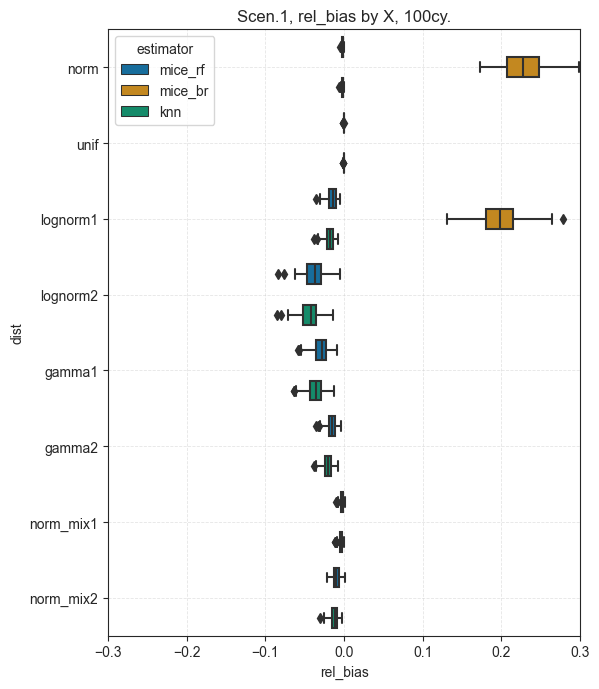

In [167]:
plott(MNAR_relb_scen1_100cy, 1, 'rel_bias', 'X', -0.3, 0.3)

In [168]:
MNAR_relb_scen1_100cy.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_relb_sc1.csv', index=False)
MNAR_relb_scen2_100cy.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_relb_sc2.csv', index=False)
MNAR_relb_scen3_100cy.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_relb_sc3.csv', index=False)
MNAR_relb_scen4_100cy.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_relb_sc4.csv', index=False)

# NRMSE REL_COEF MNAR

In [178]:
%%time 

i = 1
for sc in tqdm(['lr_quadr', 'logr_quadr', 'lr_inter', 'logr_inter']):
    print(sc)
    globals()[f"MNAR_nrmse_sc{i}"] = imp(n_cycle = 100, scenar = sc, metrica = 'nrmse')
    i += 1

  0%|          | 0/4 [00:00<?, ?it/s]

lr_quadr



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [03:11<22:20, 191.49s/it]

unif



 25%|██▌       | 2/8 [06:22<19:05, 190.95s/it]

lognorm1



 38%|███▊      | 3/8 [09:33<15:55, 191.06s/it]

lognorm2



 50%|█████     | 4/8 [12:42<12:41, 190.36s/it]

gamma1



 62%|██████▎   | 5/8 [15:49<09:27, 189.11s/it]

gamma2



 75%|███████▌  | 6/8 [18:54<06:15, 187.68s/it]

norm_mix1



 88%|████████▊ | 7/8 [22:01<03:07, 187.45s/it]

norm_mix2



 25%|██▌       | 1/4 [25:09<1:15:29, 1509.99s/it]

logr_quadr



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [03:54<27:22, 234.62s/it]

unif



 25%|██▌       | 2/8 [07:54<23:46, 237.70s/it]

lognorm1



 38%|███▊      | 3/8 [11:58<20:02, 240.59s/it]

lognorm2



 50%|█████     | 4/8 [16:13<16:24, 246.13s/it]

gamma1



 62%|██████▎   | 5/8 [20:24<12:23, 247.91s/it]

gamma2



 75%|███████▌  | 6/8 [24:30<08:14, 247.50s/it]

norm_mix1



 88%|████████▊ | 7/8 [28:37<04:07, 247.18s/it]

norm_mix2



 50%|█████     | 2/4 [57:57<59:18, 1779.21s/it]  

lr_inter



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [04:53<34:16, 293.81s/it]

unif



 25%|██▌       | 2/8 [10:01<30:10, 301.73s/it]

lognorm1



 38%|███▊      | 3/8 [14:52<24:45, 297.08s/it]

lognorm2



 50%|█████     | 4/8 [19:46<19:42, 295.68s/it]

gamma1



 62%|██████▎   | 5/8 [24:38<14:43, 294.44s/it]

gamma2



 75%|███████▌  | 6/8 [29:27<09:44, 292.49s/it]

norm_mix1



 88%|████████▊ | 7/8 [34:18<04:52, 292.29s/it]

norm_mix2



 75%|███████▌  | 3/4 [1:37:09<34:00, 2040.82s/it]

logr_inter



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [06:36<46:13, 396.21s/it]

unif



 25%|██▌       | 2/8 [12:54<38:33, 385.54s/it]

lognorm1



 38%|███▊      | 3/8 [19:16<31:59, 383.89s/it]

lognorm2



 50%|█████     | 4/8 [25:41<25:37, 384.36s/it]

gamma1



 62%|██████▎   | 5/8 [32:03<19:10, 383.61s/it]

gamma2



 75%|███████▌  | 6/8 [38:23<12:44, 382.26s/it]

norm_mix1



 88%|████████▊ | 7/8 [44:40<06:20, 380.76s/it]

norm_mix2



100%|██████████| 4/4 [2:28:09<00:00, 2222.38s/it]

CPU times: user 2h 32min 6s, sys: 29min 9s, total: 3h 1min 16s
Wall time: 2h 28min 9s


In [180]:
MNAR_nrmse_sc1.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_nrmse_sc1.csv', index=False)
MNAR_nrmse_sc2.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_nrmse_sc2.csv', index=False)
MNAR_nrmse_sc3.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_nrmse_sc3.csv', index=False)
MNAR_nrmse_sc4.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_nrmse_sc4.csv', index=False)

In [181]:
%%time 

i = 1
for sc in tqdm(['lr_quadr', 'logr_quadr', 'lr_inter', 'logr_inter']):
    print(sc)
    globals()[f"MNAR_relb_coef_sc{i}"] = imp(n_cycle = 100, scenar = sc, metrica = 'relb_coef')
    i += 1

  0%|          | 0/4 [00:00<?, ?it/s]

lr_quadr



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [03:13<22:32, 193.20s/it]

unif



 25%|██▌       | 2/8 [06:23<19:10, 191.76s/it]

lognorm1



 38%|███▊      | 3/8 [09:40<16:09, 193.82s/it]

lognorm2



 50%|█████     | 4/8 [12:56<12:58, 194.64s/it]

gamma1



 62%|██████▎   | 5/8 [16:18<09:51, 197.26s/it]

gamma2



 75%|███████▌  | 6/8 [19:39<06:37, 198.54s/it]

norm_mix1



 88%|████████▊ | 7/8 [23:01<03:19, 199.70s/it]

norm_mix2



 25%|██▌       | 1/4 [26:29<1:19:29, 1589.72s/it]

logr_quadr



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [04:16<29:51, 256.00s/it]

unif



 25%|██▌       | 2/8 [08:18<24:46, 247.81s/it]

lognorm1



 38%|███▊      | 3/8 [12:27<20:43, 248.75s/it]

lognorm2



 50%|█████     | 4/8 [16:51<16:57, 254.44s/it]

gamma1



 62%|██████▎   | 5/8 [21:09<12:48, 256.04s/it]

gamma2



 75%|███████▌  | 6/8 [25:34<08:38, 259.03s/it]

norm_mix1



 88%|████████▊ | 7/8 [29:47<04:16, 256.90s/it]

norm_mix2



 50%|█████     | 2/4 [1:00:28<1:01:47, 1854.00s/it]

lr_inter



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [04:52<34:10, 292.98s/it]

unif



 25%|██▌       | 2/8 [09:44<29:12, 292.02s/it]

lognorm1



 38%|███▊      | 3/8 [14:36<24:20, 292.16s/it]

lognorm2



 50%|█████     | 4/8 [19:25<19:24, 291.03s/it]

gamma1



 62%|██████▎   | 5/8 [24:13<14:28, 289.61s/it]

gamma2



 75%|███████▌  | 6/8 [28:57<09:35, 287.69s/it]

norm_mix1



 88%|████████▊ | 7/8 [33:40<04:46, 286.27s/it]

norm_mix2



 75%|███████▌  | 3/4 [1:38:53<34:20, 2060.04s/it]  

logr_inter



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [06:33<45:54, 393.54s/it]

unif



 25%|██▌       | 2/8 [13:15<39:50, 398.34s/it]

lognorm1



 38%|███▊      | 3/8 [20:01<33:29, 401.93s/it]

lognorm2



 50%|█████     | 4/8 [26:51<27:00, 405.23s/it]

gamma1



 62%|██████▎   | 5/8 [33:38<20:17, 405.77s/it]

gamma2



 75%|███████▌  | 6/8 [40:15<13:25, 402.69s/it]

norm_mix1



 88%|████████▊ | 7/8 [46:56<06:42, 402.15s/it]

norm_mix2



100%|██████████| 4/4 [2:32:43<00:00, 2290.81s/it]

CPU times: user 2h 35min 57s, sys: 28min 36s, total: 3h 4min 34s
Wall time: 2h 32min 43s


In [182]:
MNAR_relb_coef_sc1.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_relb_coef_sc1.csv', index=False)
MNAR_relb_coef_sc2.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_relb_coef_sc2.csv', index=False)
MNAR_relb_coef_sc3.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_relb_coef_sc3.csv', index=False)
MNAR_relb_coef_sc4.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/MNAR_relb_coef_sc4.csv', index=False)

# Nrmse

In [133]:
%%time 

i = 1
for sc in tqdm(['lr_quadr', 'logr_quadr', 'lr_inter', 'logr_inter']):
    print(sc)
    globals()[f"miceBR_nrmse_scen{i}"] = imp(n_cycle = 100, scenar = sc, metrica = 'nrmse')
    i += 1

  0%|          | 0/4 [00:00<?, ?it/s]

lr_quadr



  0%|          | 0/6 [00:00<?, ?it/s]

norm



 17%|█▋        | 1/6 [00:17<01:27, 17.58s/it]

unif



 33%|███▎      | 2/6 [00:35<01:10, 17.54s/it]

lognorm1



 50%|█████     | 3/6 [00:52<00:52, 17.58s/it]

lognorm2



 67%|██████▋   | 4/6 [01:10<00:35, 17.54s/it]

gamma1



 83%|████████▎ | 5/6 [01:27<00:17, 17.54s/it]

gamma2



 25%|██▌       | 1/4 [01:45<05:15, 105.31s/it]

logr_quadr



  0%|          | 0/6 [00:00<?, ?it/s]2023-03-25 00:13:56,895 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:13:56,898 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-03-25 00:13:57,103 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:13:57,106 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:13:57,304 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

unif


2023-03-25 00:14:17,918 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:14:17,921 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:14:18,131 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lognorm1


2023-03-25 00:14:38,879 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:14:38,882 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:14:39,107 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lognorm2


2023-03-25 00:14:59,963 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:14:59,965 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:15:00,175 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

gamma1


2023-03-25 00:15:20,918 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:15:20,921 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:15:21,123 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

gamma2


2023-03-25 00:15:41,586 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:15:41,589 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:15:41,796 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lr_inter



  0%|          | 0/6 [00:00<?, ?it/s]2023-03-25 00:16:02,063 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


norm


2023-03-25 00:16:02,300 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:02,530 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:02,753 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:02,978 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:03,202 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:03,425 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:03,649 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:03,874 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:04,096 [WARNING] Indicated weig

unif


2023-03-25 00:16:24,804 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:25,028 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:25,250 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:25,476 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:25,699 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:25,926 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:26,148 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:26,372 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:26,595 [WARNING] Indicated weig

lognorm1


2023-03-25 00:16:47,336 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:47,580 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:47,805 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:48,028 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:48,252 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:48,475 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:48,700 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:48,924 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:16:49,147 [WARNING] Indicated weig

lognorm2


2023-03-25 00:17:09,845 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:10,071 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:10,292 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:10,514 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:10,738 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:10,961 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:11,183 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:11,405 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:11,630 [WARNING] Indicated weig

gamma1


2023-03-25 00:17:32,332 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:32,553 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:32,772 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:32,990 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:33,209 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:33,427 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:33,645 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:33,864 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:34,082 [WARNING] Indicated weig

gamma2


2023-03-25 00:17:54,394 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:54,616 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:54,836 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:55,057 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:55,279 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:55,500 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:55,720 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:55,940 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:17:56,160 [WARNING] Indicated weig

logr_inter



  0%|          | 0/6 [00:00<?, ?it/s]2023-03-25 00:18:16,315 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:18:16,316 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:18:16,319 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-03-25 00:18:16,583 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:18:16,584 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:18:16,587 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:18:16,849 [WARNING] Indicated weights for incomp

unif


2023-03-25 00:18:43,468 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:18:43,469 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:18:43,473 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:18:43,730 [WARNING] Indicated weights for incomp

lognorm1


2023-03-25 00:19:09,611 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:19:09,612 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:19:09,615 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:19:09,889 [WARNING] Indicated weights for incomp

lognorm2


2023-03-25 00:19:36,389 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:19:36,390 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:19:36,392 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:19:36,650 [WARNING] Indicated weights for incomp

gamma1


2023-03-25 00:20:02,805 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:20:02,806 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:20:02,809 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:20:03,070 [WARNING] Indicated weights for incomp

gamma2


2023-03-25 00:20:29,152 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-25 00:20:29,153 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-25 00:20:29,156 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-25 00:20:29,412 [WARNING] Indicated weights for incomp

CPU times: user 8min 41s, sys: 2.19 s, total: 8min 43s
Wall time: 8min 43s


In [135]:
miceBR_nrmse_scen1.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/miceBR_nrmse_scen1.csv', index=False)
miceBR_nrmse_scen2.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/miceBR_nrmse_scen2.csv', index=False)
miceBR_nrmse_scen3.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/miceBR_nrmse_scen3.csv', index=False)
miceBR_nrmse_scen4.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/miceBR_nrmse_scen4.csv', index=False)

# Relb knn mixnorms (knn is extremely fast)

In [101]:
%%time 

i = 1
for sc in tqdm(['lr_quadr', 'logr_quadr', 'lr_inter', 'logr_inter']):
    print(sc)
    globals()[f"knn_relb_coef_scen{i}"] = imp(n_cycle = 100, scenar = sc, metrica = 'rel_bias')
    i += 1

  0%|          | 0/4 [00:00<?, ?it/s]

lr_quadr



  0%|          | 0/2 [00:00<?, ?it/s]

norm_mix1



 50%|█████     | 1/2 [00:02<00:02,  2.22s/it]

norm_mix2



 25%|██▌       | 1/4 [00:04<00:14,  4.72s/it]

logr_quadr



  0%|          | 0/2 [00:00<?, ?it/s]2023-03-24 18:00:16,773 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 18:00:16,778 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 18:00:16,835 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used 

norm_mix1


2023-03-24 18:00:16,885 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 18:00:16,889 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 18:00:16,945 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

norm_mix2


2023-03-24 18:00:21,986 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 18:00:21,989 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 18:00:22,032 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lr_inter



  0%|          | 0/2 [00:00<?, ?it/s]2023-03-24 18:00:26,518 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,545 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,569 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,597 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,620 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,647 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,672 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


norm_mix1


2023-03-24 18:00:26,701 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,728 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,752 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,777 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,801 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,828 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,854 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,882 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:26,911 [WARNING] Indicated weig

norm_mix2


2023-03-24 18:00:29,448 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:29,476 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:29,505 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:29,532 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:29,559 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:29,587 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:29,614 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:29,641 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:29,668 [WARNING] Indicated weig

logr_inter



  0%|          | 0/2 [00:00<?, ?it/s]2023-03-24 18:00:32,113 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:32,115 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 18:00:32,118 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 18:00:32,166 

norm_mix1


2023-03-24 18:00:32,271 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 18:00:32,275 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 18:00:32,321 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:32,322 [WARNING] Binary variables (at indices

norm_mix2


2023-03-24 18:00:37,367 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 18:00:37,368 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 18:00:37,372 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 18:00:37,417 [WARNING] Indicated weights for incomp

CPU times: user 43.6 s, sys: 1min 22s, total: 2min 6s
Wall time: 30.2 s


In [103]:
knn_relb_coef_scen1.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/knn_relb_scen1.csv', index=False)
knn_relb_coef_scen2.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/knn_relb_scen2.csv', index=False)
knn_relb_coef_scen3.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/knn_relb_scen3.csv', index=False)
knn_relb_coef_scen4.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/knn_relb_scen4.csv', index=False)

# Relb_coef mix_norms

In [129]:
%%time 

i = 1
for sc in tqdm(['lr_quadr', 'logr_quadr', 'lr_inter', 'logr_inter']):
    print(sc)
    globals()[f"miceBR_relb_coef_scen{i}"] = imp(n_cycle = 100, scenar = sc, metrica = 'relb_coef')
    i += 1

  0%|          | 0/4 [00:00<?, ?it/s]

lr_quadr



  0%|          | 0/6 [00:00<?, ?it/s]

norm



 17%|█▋        | 1/6 [00:19<01:38, 19.63s/it]

unif



 33%|███▎      | 2/6 [00:38<01:17, 19.37s/it]

lognorm1



 50%|█████     | 3/6 [00:58<00:58, 19.53s/it]

lognorm2



 67%|██████▋   | 4/6 [01:19<00:39, 19.91s/it]

gamma1



 83%|████████▎ | 5/6 [01:41<00:20, 20.71s/it]

gamma2



 25%|██▌       | 1/4 [02:02<06:08, 122.91s/it]

logr_quadr



  0%|          | 0/6 [00:00<?, ?it/s]2023-03-24 23:30:09,970 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:30:09,974 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-03-24 23:30:10,294 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:30:10,299 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:30:10,564 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

unif


2023-03-24 23:30:34,683 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:30:34,687 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:30:34,925 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lognorm1


2023-03-24 23:31:02,106 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:31:02,109 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:31:02,418 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lognorm2


2023-03-24 23:31:29,483 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:31:29,486 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:31:29,730 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

gamma1


2023-03-24 23:31:56,929 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:31:56,935 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:31:57,210 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

gamma2


2023-03-24 23:32:21,600 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:32:21,603 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:32:21,830 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lr_inter



  0%|          | 0/6 [00:00<?, ?it/s]2023-03-24 23:32:45,190 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


norm


2023-03-24 23:32:45,437 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:32:45,692 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:32:45,925 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:32:46,188 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:32:46,426 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:32:46,666 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:32:46,913 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:32:47,152 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:32:47,432 [WARNING] Indicated weig

unif


2023-03-24 23:33:10,712 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:11,035 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:11,384 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:11,717 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:11,973 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:12,229 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:12,481 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:12,719 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:13,024 [WARNING] Indicated weig

lognorm1


2023-03-24 23:33:35,964 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:36,200 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:36,438 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:36,669 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:36,902 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:37,137 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:37,375 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:37,609 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:37,843 [WARNING] Indicated weig

lognorm2


2023-03-24 23:33:59,476 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:59,707 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:33:59,942 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:00,176 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:00,409 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:00,641 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:00,874 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:01,106 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:01,343 [WARNING] Indicated weig

gamma1


2023-03-24 23:34:22,782 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:23,024 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:23,265 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:23,509 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:23,740 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:23,973 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:24,205 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:24,436 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:24,665 [WARNING] Indicated weig

gamma2


2023-03-24 23:34:46,022 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:46,254 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:46,485 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:46,717 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:46,947 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:47,178 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:47,407 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:47,639 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:34:47,871 [WARNING] Indicated weig

logr_inter



  0%|          | 0/6 [00:00<?, ?it/s]2023-03-24 23:35:09,261 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:35:09,263 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:35:09,268 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-03-24 23:35:09,573 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:35:09,574 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:35:09,577 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:35:09,880 [WARNING] Indicated weights for incomp

unif


2023-03-24 23:35:39,575 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:35:39,576 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:35:39,579 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:35:39,866 [WARNING] Indicated weights for incomp

lognorm1


2023-03-24 23:36:08,982 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:36:08,983 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:36:08,986 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:36:09,285 [WARNING] Indicated weights for incomp

lognorm2


2023-03-24 23:36:38,953 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:36:38,954 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:36:38,957 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:36:39,253 [WARNING] Indicated weights for incomp

gamma1


2023-03-24 23:37:08,765 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:37:08,766 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:37:08,769 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:37:09,060 [WARNING] Indicated weights for incomp

gamma2


2023-03-24 23:37:38,587 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-24 23:37:38,588 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-24 23:37:38,591 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-24 23:37:38,883 [WARNING] Indicated weights for incomp

CPU times: user 9min 52s, sys: 4.18 s, total: 9min 56s
Wall time: 10min


In [132]:
miceBR_relb_coef_scen1.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/miceBR_relb_coef_scen1.csv', index=False)
miceBR_relb_coef_scen2.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/miceBR_relb_coef_scen2.csv', index=False)
miceBR_relb_coef_scen3.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/miceBR_relb_coef_scen3.csv', index=False)
miceBR_relb_coef_scen4.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/miceBR_relb_coef_scen4.csv', index=False)

# Relb all sc_1 just to check

In [144]:
%%time 

i = 1
for sc in tqdm(['lr_quadr']):
    print(sc)
    globals()[f"miceBR_relb_scen{i}"] = imp(n_cycle = 100, scenar = sc, metrica = 'rel_bias')

  0%|          | 0/1 [00:00<?, ?it/s]

lr_quadr



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [03:11<22:19, 191.39s/it]

unif



 25%|██▌       | 2/8 [06:18<18:54, 189.11s/it]

lognorm1



 38%|███▊      | 3/8 [09:21<15:31, 186.25s/it]

lognorm2



 50%|█████     | 4/8 [12:31<12:31, 187.80s/it]

gamma1



 62%|██████▎   | 5/8 [15:38<09:22, 187.34s/it]

gamma2



 75%|███████▌  | 6/8 [18:46<06:14, 187.47s/it]

norm_mix1



 88%|████████▊ | 7/8 [21:56<03:08, 188.43s/it]

norm_mix2



100%|██████████| 1/1 [25:07<00:00, 1507.13s/it]

CPU times: user 24min 48s, sys: 13.2 s, total: 25min 1s
Wall time: 25min 7s


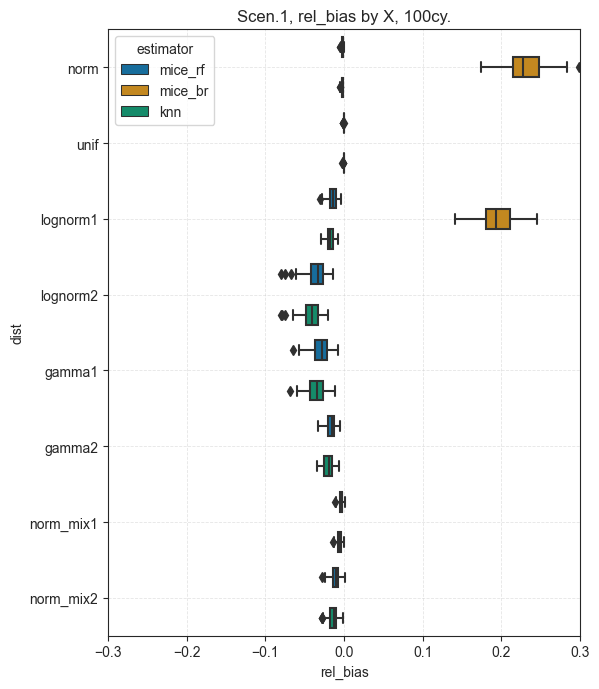

In [147]:
plott(miceBR_relb_scen1, 1, 'rel_bias', 'X', -0.3, 0.3)

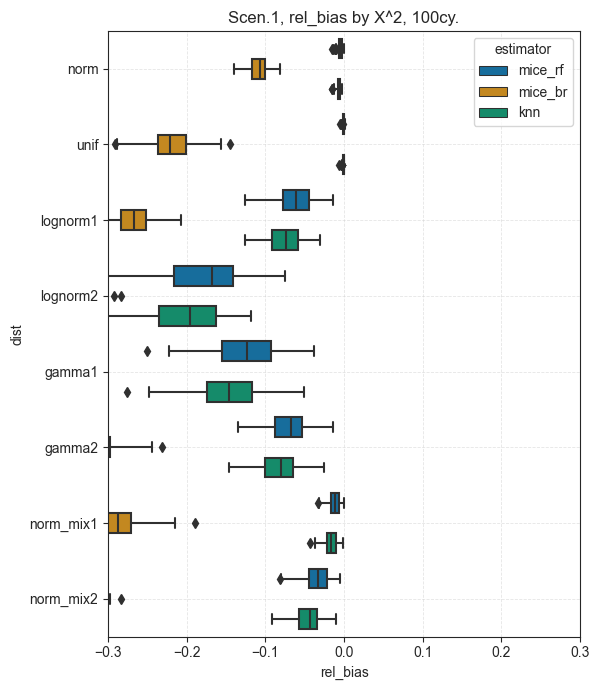

In [148]:
plott(miceBR_relb_scen1, 1, 'rel_bias', 'X^2', -0.3, 0.3)

# Relb_coef all sc_1 just to check

In [137]:
%%time 

i = 1
for sc in tqdm(['lr_quadr']):
    print(sc)
    globals()[f"miceBR_relb_coef_scen{i}"] = imp(n_cycle = 100, scenar = sc, metrica = 'relb_coef')

  0%|          | 0/1 [00:00<?, ?it/s]

lr_quadr



  0%|          | 0/8 [00:00<?, ?it/s]

norm



 12%|█▎        | 1/8 [03:12<22:26, 192.36s/it]

unif



 25%|██▌       | 2/8 [06:23<19:11, 191.85s/it]

lognorm1



 38%|███▊      | 3/8 [09:38<16:05, 193.06s/it]

lognorm2



 50%|█████     | 4/8 [12:49<12:49, 192.36s/it]

gamma1



 62%|██████▎   | 5/8 [15:56<09:30, 190.31s/it]

gamma2



 75%|███████▌  | 6/8 [19:01<06:16, 188.49s/it]

norm_mix1



 88%|████████▊ | 7/8 [22:08<03:08, 188.15s/it]

norm_mix2



100%|██████████| 1/1 [25:20<00:00, 1520.05s/it]

CPU times: user 25min 1s, sys: 11.4 s, total: 25min 12s
Wall time: 25min 20s


In [143]:
miceBR_relb_coef_scen1[miceBR_relb_coef_scen1['estimator'] == 'mice_br']

,dist,estimator,col,relb_coef
0,norm,mice_br,X,-4.356667e-07
0,norm,mice_br,X^2,1.140231e-07
0,norm,mice_br,X,1.413452e-06
0,norm,mice_br,X^2,-3.811881e-07
0,norm,mice_br,X,6.010147e-07
...,...,...,...,...
0,norm_mix2,mice_br,X^2,5.881553e-08
0,norm_mix2,mice_br,X,-2.453536e-08
0,norm_mix2,mice_br,X^2,5.278265e-09
0,norm_mix2,mice_br,X,-3.384719e-07


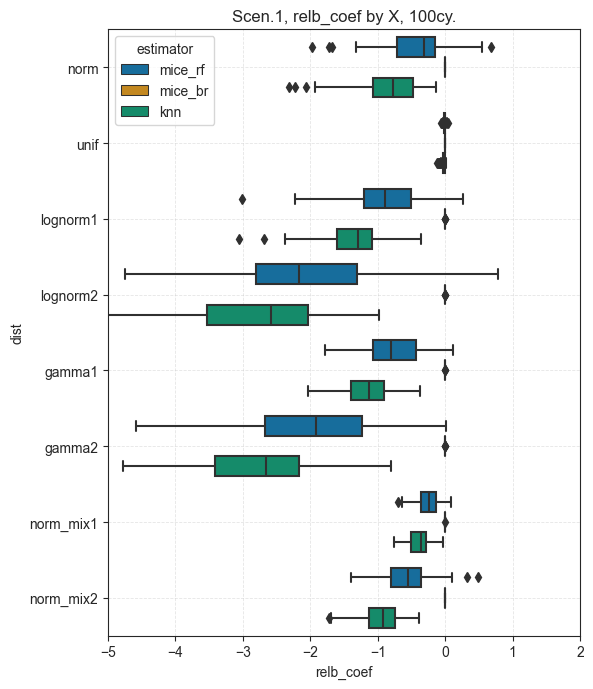

In [149]:
plott(miceBR_relb_coef_scen1, 1, 'relb_coef', 'X', -5, 2)

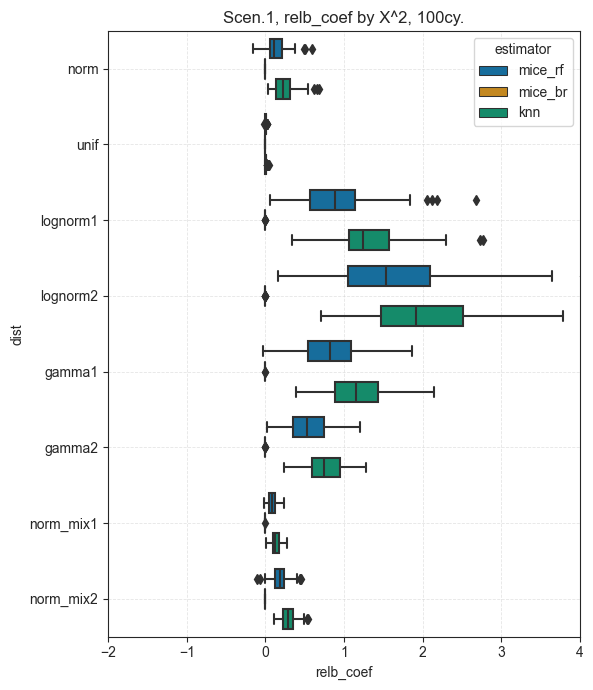

In [150]:
plott(miceBR_relb_coef_scen1, 1, 'relb_coef', 'X^2', -2, 4)

In [63]:
# miceBR_rel_bias_scen4.to_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/miceBR_rel_bias_scen4.csv', index=False)

In [78]:
mixNorms_nrmse_scen1

,dist,estimator,col,nrmse
0,norm_mix1,mice_rf,X,0.022012
0,norm_mix1,mice_rf,X^2,0.053101
0,norm_mix1,mice_br,X,2.938720
0,norm_mix1,mice_br,X^2,0.733376
0,norm_mix1,knn,X,0.027868
0,norm_mix1,knn,X^2,0.064988
0,norm_mix1,mice_rf,X,0.044554
0,norm_mix1,mice_rf,X^2,0.117650
0,norm_mix1,mice_br,X,3.134075
0,norm_mix1,mice_br,X^2,0.764267


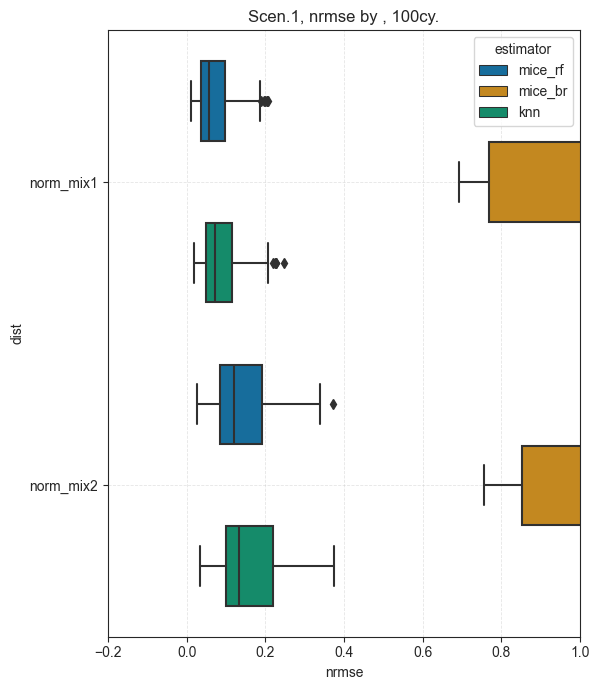

In [89]:
plott_nrmse(mixNorms_nrmse_scen1, 1, 'nrmse', -0.2, 1)

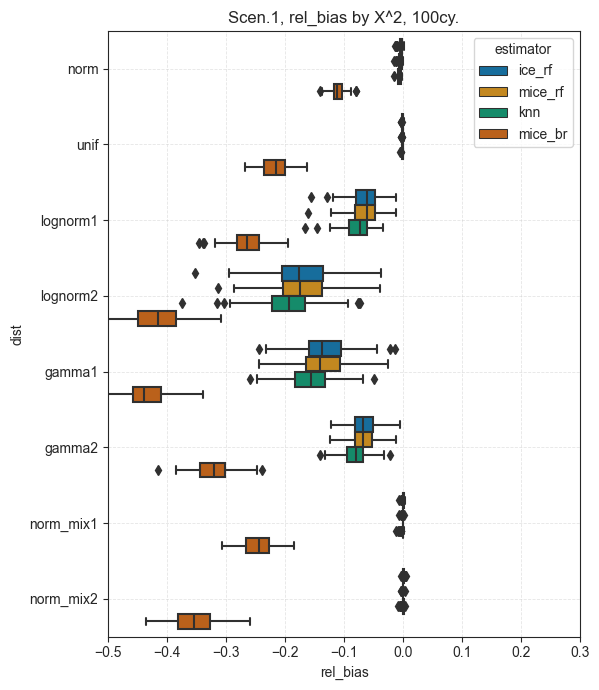

In [39]:
relb_scen1_100cy = pd.read_csv('/Users/ash/Desktop/MICE/PY/fin_res_csv/old_versions/relb_scen1_100cy_23feb.csv')
relb_scen1_100cy
plott(relb_scen1_100cy, 1, 'rel_bias', 'X^2', -0.5, 0.3)

In [21]:
# %%time 

# i = 2
# for sc in tqdm(['logr_quadr', 'logr_inter']):
#     for metric in tqdm(['relb_coef']):
#         print(sc)
#         tmp = imp(n_cycle = 100, scenar = sc, metrica = metric)
#         globals()[f"{metric}_scen{i}_pt2"] = tmp
#         tmp.to_csv(f"{metric}_scen{i}_pt2.csv", index=False)
#     i = 4

  0%|          | 0/1 [00:00<?, ?it/s]

logr_quadr




  0%|          | 0/8 [00:00<?, ?it/s]2023-03-12 13:51:24,876 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:24,879 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm
Optimization terminated successfully.
         Current function value: 0.651049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660632
         Iterations 5


2023-03-12 13:51:27,416 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:27,419 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.651049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660632
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660602
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660522
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660547
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654217
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.663376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670814
  

2023-03-12 13:51:29,970 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:29,973 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.663376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670814
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670832
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670829
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639347
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656530
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669429
  

2023-03-12 13:51:32,485 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:32,488 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.656530
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669429
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669477
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669428
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669577
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669508
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656530
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656833
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.670840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679709
  

2023-03-12 13:51:35,100 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:35,103 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.670840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679762
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679762
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679839
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.669444
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675124
  

2023-03-12 13:51:37,698 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:37,701 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.669444
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675124
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675174
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675159
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675156
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675121
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669444
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656663
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655075
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668287
  

2023-03-12 13:51:40,289 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:40,293 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.655075
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668287
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668339
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668312
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668337
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668303
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655075
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626942
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.666734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677391
  

2023-03-12 13:51:42,806 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:42,809 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.666734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677391
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677325
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677393
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677419
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677361
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681587
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675023
  

2023-03-12 13:51:45,430 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:45,433 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.666679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675023
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675034
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674928
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674880
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684581
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675799
  

2023-03-12 13:51:47,956 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:47,959 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.668755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675864
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675868
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675843
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658352
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667436
  

2023-03-12 13:51:50,446 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:50,449 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.660545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667436
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667276
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667294
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616123
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.664499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671183
  

2023-03-12 13:51:52,951 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:52,954 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.664499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671183
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671207
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671166
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671171
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671204
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669821
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666418
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671482
  

2023-03-12 13:51:55,479 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:55,482 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.666418
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671482
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671426
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671515
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666418
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641590
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644887
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650733
  

2023-03-12 13:51:57,946 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:51:57,949 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.644887
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650733
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650721
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650732
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650730
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650716
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644887
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591959
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655864
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656428
  

2023-03-12 13:52:00,434 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:00,437 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.655864
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656356
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656400
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656375
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656462
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655864
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618120
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.675473
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678020
  

2023-03-12 13:52:02,993 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:02,995 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.675473
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678020
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678115
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678033
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675473
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679228
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664523
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670988
  

2023-03-12 13:52:05,479 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:05,482 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.664523
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670988
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670974
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670988
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664523
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597581
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.673228
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674984
  

2023-03-12 13:52:08,020 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:08,023 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.673228
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674997
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675019
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675005
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675004
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673228
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647305
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668815
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675829
  

2023-03-12 13:52:10,556 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:10,559 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.668815
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675829
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675774
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675875
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675747
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668815
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641218
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664334
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671235
  

2023-03-12 13:52:13,044 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:13,046 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.664334
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671235
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671209
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671229
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664334
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661269
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667806
  

2023-03-12 13:52:15,582 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:15,585 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.663248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667806
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667842
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667802
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667811
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667814
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634266
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663063
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669711
  

2023-03-12 13:52:18,127 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:18,130 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.663063
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669711
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669767
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669718
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669700
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663063
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660338
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655920
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666363
  

2023-03-12 13:52:20,597 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:20,600 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.655920
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666363
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666381
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666404
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655920
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626436
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.663478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666852
  

2023-03-12 13:52:23,155 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:23,158 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.663478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666852
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666852
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666897
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666878
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666939
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643166
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667890
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674668
  

2023-03-12 13:52:25,758 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:25,761 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.667890
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674834
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674733
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667890
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683714
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.647728
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661630
  

2023-03-12 13:52:28,248 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:28,251 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.647728
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661630
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661663
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661811
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661664
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647728
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589271
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.663771
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672377
  

2023-03-12 13:52:30,738 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:30,741 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.663771
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672377
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672388
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672412
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672396
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663771
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.689660
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.658231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663911
  

2023-03-12 13:52:33,227 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:33,230 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.658231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663911
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663878
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663881
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663908
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661344
  

2023-03-12 13:52:35,755 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:35,758 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.653862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661344
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661399
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661408
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661365
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661418
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655052
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669962
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678385
  

2023-03-12 13:52:38,267 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:38,270 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.669962
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678385
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678396
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678335
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678421
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669962
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660972
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674263
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674961
  

2023-03-12 13:52:40,840 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:40,843 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.674263
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674961
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674964
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674263
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598622
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.667497
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669011
  

2023-03-12 13:52:43,429 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:43,432 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.667497
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669011
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669017
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669048
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669016
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667497
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655521
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669713
  

2023-03-12 13:52:45,935 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:45,938 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.665357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669713
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669672
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669649
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669637
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659276
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668179
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677545
  

2023-03-12 13:52:48,491 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:48,494 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.668179
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677534
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677532
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677536
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677533
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668179
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672192
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657956
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666040
  

2023-03-12 13:52:51,035 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:51,039 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.657956
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666040
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666091
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666017
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666134
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657956
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631038
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.667010
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674353
  

2023-03-12 13:52:53,589 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:53,592 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.667010
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674353
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674355
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674354
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674359
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674363
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667010
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611455
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.659346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663717
  

2023-03-12 13:52:56,080 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:56,083 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.659346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663717
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663726
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654219
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670336
  

2023-03-12 13:52:58,670 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:52:58,673 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.663441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670335
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670325
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633471
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660066
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667735
  

2023-03-12 13:53:01,150 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:01,153 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.660066
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667735
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667673
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667617
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667609
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660066
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679460
  

2023-03-12 13:53:03,677 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:03,681 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.669272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679460
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679452
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679471
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664325
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.672316
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677859
  

2023-03-12 13:53:06,366 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:06,369 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.672316
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677859
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677862
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677871
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677803
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677824
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.672316
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666531
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667773
  

2023-03-12 13:53:08,869 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:08,872 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.664100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668194
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667948
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.688805
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.665120
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669614
  

2023-03-12 13:53:11,411 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:11,414 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.665120
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669614
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669570
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665120
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629944
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656351
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668661
  

2023-03-12 13:53:13,953 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:13,957 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.656351
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668661
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668660
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668660
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656351
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657228
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680157
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681179
  

2023-03-12 13:53:16,525 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:16,528 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680157
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681179
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681214
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681233
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681221
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681213
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680157
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653951
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.664907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670765
  

2023-03-12 13:53:19,043 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:19,046 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.664907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670765
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670766
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670769
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680715
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673261
  

2023-03-12 13:53:21,605 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:21,608 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.664805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673115
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673039
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673076
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623889
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.659558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666458
  

2023-03-12 13:53:24,076 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:24,079 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.659558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666442
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666445
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666444
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666426
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672871
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648007
  

2023-03-12 13:53:26,524 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:26,527 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.642627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648007
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647950
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648014
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648000
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648001
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544248
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.668117
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679045
  

2023-03-12 13:53:29,041 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:29,044 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.668117
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679045
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679068
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668117
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681178
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.662067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672108
  

2023-03-12 13:53:31,611 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:31,614 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.662067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672108
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672111
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672148
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672191
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659145
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.665109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673338
  

2023-03-12 13:53:34,169 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:34,172 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.665109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673338
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673333
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673335
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669042
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668854
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672014
  

2023-03-12 13:53:36,741 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:36,744 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.668854
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672014
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671990
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671987
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668854
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670802
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671245
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676282
  

2023-03-12 13:53:39,385 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:39,388 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.671245
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676282
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676283
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676305
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676273
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676291
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671245
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663087
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665281
  

2023-03-12 13:53:41,916 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:41,919 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.659872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665281
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665306
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665492
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665321
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665041
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619515
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.663724
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671439
  

2023-03-12 13:53:44,508 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:44,511 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.663724
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671445
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671438
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671432
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671440
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663724
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672789
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655343
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668912
  

2023-03-12 13:53:47,082 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:47,085 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.655343
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668912
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668989
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668978
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668989
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655343
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624887
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666887
  

2023-03-12 13:53:49,639 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:49,642 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.662058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666887
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666899
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666888
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666890
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666895
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655492
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668816
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674324
  

2023-03-12 13:53:52,152 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:52,155 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.668816
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674302
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674340
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668816
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635284
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662954
  

2023-03-12 13:53:54,662 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:54,665 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.653558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662954
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662911
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662948
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662956
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607112
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.661524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673416
  

2023-03-12 13:53:57,174 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:57,177 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.661524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673416
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673436
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673370
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673417
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673383
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616697
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.666582
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672318
  

2023-03-12 13:53:59,756 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:53:59,759 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.666582
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672318
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672268
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672291
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666582
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672965
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677611
  

2023-03-12 13:54:02,320 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:02,323 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.672965
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677611
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677675
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677658
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672965
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664306
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658648
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671000
  

2023-03-12 13:54:04,930 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:04,933 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.658648
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671000
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670987
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670920
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658648
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675497
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665508
  

2023-03-12 13:54:07,472 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:07,475 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.660613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665508
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665576
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665543
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670194
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674085
  

2023-03-12 13:54:10,046 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:10,049 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.670194
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674085
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674103
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674099
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674180
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670194
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629067
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660611
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669090
  

2023-03-12 13:54:12,549 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:12,552 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.660611
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669111
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669118
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669122
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660611
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634656
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666783
  

2023-03-12 13:54:15,066 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:15,069 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.653483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666786
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631715
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663399
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667565
  

2023-03-12 13:54:17,605 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:17,608 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.663399
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667565
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667723
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667624
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663399
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644049
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.662960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669682
  

2023-03-12 13:54:20,179 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:20,182 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.662960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669682
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669672
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669715
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679793
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673811
  

2023-03-12 13:54:22,712 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:22,715 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.665013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673811
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673766
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673746
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673886
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673876
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669129
  

2023-03-12 13:54:25,238 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:25,241 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.654796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669122
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669125
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669143
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594624
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.652062
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668739
  

2023-03-12 13:54:27,774 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:27,777 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.652062
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668739
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668701
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668722
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652062
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669017
  

2023-03-12 13:54:30,295 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:30,298 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.656298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669017
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669001
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669048
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669002
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680617
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657675
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662728
  

2023-03-12 13:54:32,846 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:32,849 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.657675
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662728
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657675
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629072
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.667379
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671905
  

2023-03-12 13:54:35,351 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:35,354 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.667379
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671905
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671789
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671833
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667379
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681125
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.669224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677395
  

2023-03-12 13:54:37,917 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:37,920 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.669224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677421
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677454
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660059
  

2023-03-12 13:54:40,456 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:40,459 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.653246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660059
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660098
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.659976
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660037
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660114
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641401
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.652288
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660518
  

2023-03-12 13:54:43,050 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:43,053 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.652288
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660526
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660538
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660697
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652288
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650827
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676320
  

2023-03-12 13:54:45,579 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:45,582 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.668015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676320
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676313
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676334
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676344
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622735
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.663028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669316
  

2023-03-12 13:54:48,070 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:48,073 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.663028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669316
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669285
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669396
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669378
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664955
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669674
  

2023-03-12 13:54:50,616 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:50,619 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.654244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669644
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669610
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669667
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669704
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672041
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662587
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663629
  

2023-03-12 13:54:53,137 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:53,140 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.662587
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663685
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663590
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663598
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662587
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630477
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658961
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668914
  

2023-03-12 13:54:55,653 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:55,657 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.658961
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668914
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668928
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668917
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668923
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658961
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678969
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669212
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675320
  

2023-03-12 13:54:58,231 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:54:58,234 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.669212
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675320
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675327
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675302
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669212
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624422
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.667187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673660
  

2023-03-12 13:55:00,791 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:00,794 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.667187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673660
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673640
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673675
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660728
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664814
  

2023-03-12 13:55:03,280 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:03,283 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.660728
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664814
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664769
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664749
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664657
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660728
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.686095
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674293
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677558
  

2023-03-12 13:55:05,888 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:05,891 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.674293
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677447
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677466
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677425
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677496
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674293
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659687
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663415
  

2023-03-12 13:55:08,440 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:08,443 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.651437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663415
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663381
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663641
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663530
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643017
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654191
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662403
  

2023-03-12 13:55:11,014 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:11,017 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.654191
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662403
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662397
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662410
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662414
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654191
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626116
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.668001
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674621
  

2023-03-12 13:55:13,648 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:13,651 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.668001
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674621
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674660
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674576
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668001
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675618
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669361
  

2023-03-12 13:55:16,260 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:16,263 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.656679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669361
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669377
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669319
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625096
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.664080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672420
  

2023-03-12 13:55:18,768 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:18,771 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.664080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672420
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672472
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672527
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672358
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652989
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660306
  

2023-03-12 13:55:21,357 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:21,360 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.649808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660306
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660178
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660163
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660118
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620851
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.667541
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670795
  

2023-03-12 13:55:23,902 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:23,905 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.667541
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670795
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670688
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670706
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670662
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667541
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624004
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.673855
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680909
  

2023-03-12 13:55:26,512 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:26,515 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.673855
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680909
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680914
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680918
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680925
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680918
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.673855
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.665673
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666171
  

2023-03-12 13:55:29,100 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:29,103 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.667943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666171
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666173
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666064
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657488
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654564
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664041
  

2023-03-12 13:55:31,740 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:31,743 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.654564
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664041
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664036
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664048
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664036
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654564
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638443
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.667803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670724
  

2023-03-12 13:55:34,259 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:34,262 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.667803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670724
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670638
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670508
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670699
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646089
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676703
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681517
  

2023-03-12 13:55:36,812 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:36,815 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.676703
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681517
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681548
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681529
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681545
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681525
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.676703
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.667303
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673336
  



 12%|█▎        | 1/8 [04:14<29:41, 254.47s/it]2023-03-12 13:55:39,343 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:39,346 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.667303
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673464
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673347
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667303
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635225
         Iterations 5
unif
Optimization terminated successfully.
         Current function value: 0.568654
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.5916

2023-03-12 13:55:41,841 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:41,844 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568654
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591640
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591392
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591414
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591318
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591167
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568654
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520642
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542344
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578564
  

2023-03-12 13:55:44,311 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:44,314 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.542344
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578564
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578583
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578456
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578487
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578408
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542344
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.477653
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581038
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604310
  

2023-03-12 13:55:46,789 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:46,792 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581038
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604310
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604486
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604395
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604374
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604467
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581038
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.511927
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570564
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595739
  

2023-03-12 13:55:49,234 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:49,237 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570564
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595739
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595708
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595639
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595811
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595711
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570564
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.495636
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598261
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.621095
  

2023-03-12 13:55:51,778 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:51,781 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.598261
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.621095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.621093
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.620938
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.620876
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.621235
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598261
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574796
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548945
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580655
  

2023-03-12 13:55:54,613 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:54,616 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.548945
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580655
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580496
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580784
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579900
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580879
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548945
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563660
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601198
  

2023-03-12 13:55:57,231 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:57,234 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563660
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601198
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601166
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601215
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601280
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601313
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563660
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.523886
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566069
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598448
  

2023-03-12 13:55:59,792 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:55:59,795 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566069
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598448
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598441
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598464
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598457
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598444
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566069
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535097
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579756
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597911
  

2023-03-12 13:56:02,626 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:02,630 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579756
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597911
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597766
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598025
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597963
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597772
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579756
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546027
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578791
  

2023-03-12 13:56:05,361 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:05,364 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.557579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578791
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578838
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578822
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578828
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578819
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.488342
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566107
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604339
  

2023-03-12 13:56:08,026 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:08,030 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566107
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604384
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604843
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604457
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604604
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566107
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588651
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547755
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595790
  

2023-03-12 13:56:10,743 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:10,746 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.547755
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595790
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595668
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595797
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595718
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595618
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547755
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573206
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576830
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601639
  

2023-03-12 13:56:13,361 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:13,364 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576830
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601639
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601796
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601491
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601723
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576830
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516290
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561723
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592912
  

2023-03-12 13:56:15,801 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:15,804 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561723
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592912
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593040
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593047
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593060
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593200
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561723
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.494073
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541793
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572476
  

2023-03-12 13:56:18,279 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:18,282 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.541793
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572476
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572614
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572169
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572324
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571949
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541793
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507272
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.579011
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593443
  

2023-03-12 13:56:20,739 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:20,742 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579011
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593443
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593549
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593421
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593524
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593462
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579011
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546788
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564725
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587905
  

2023-03-12 13:56:23,220 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:23,223 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564725
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587905
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588059
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588182
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588188
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588050
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564725
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518974
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.529826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565794
  

2023-03-12 13:56:25,634 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:25,637 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.529826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565685
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566205
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565966
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.439241
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.544651
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578351
  

2023-03-12 13:56:28,019 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:28,022 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544651
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578351
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578337
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578293
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578348
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544651
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.519394
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613781
  

2023-03-12 13:56:30,516 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:30,519 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613781
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613848
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613785
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613744
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613793
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555912
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568364
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583937
  

2023-03-12 13:56:33,001 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:33,004 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568364
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584192
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584083
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584118
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568364
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513899
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554128
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573992
  

2023-03-12 13:56:35,573 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:35,576 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554128
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573992
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573905
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573921
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573953
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573956
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554128
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561610
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567040
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602293
  

2023-03-12 13:56:38,015 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:38,018 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567040
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602293
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602178
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602278
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602248
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567040
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545004
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545904
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579185
  

2023-03-12 13:56:40,441 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:40,444 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545904
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579185
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579496
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579602
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579958
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579768
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545904
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.456391
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579970
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613000
  

2023-03-12 13:56:42,882 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:42,885 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579970
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613000
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.612754
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.612994
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.612579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.612891
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579970
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572897
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575732
  

2023-03-12 13:56:45,343 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:45,346 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.547446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575732
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575759
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575765
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575772
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.477534
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.550758
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595568
  

2023-03-12 13:56:47,771 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:47,774 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.550758
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595568
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595938
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595452
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595431
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595847
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550758
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.501969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565539
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600181
  

2023-03-12 13:56:50,264 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:50,268 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.565539
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600181
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.599691
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.599992
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600161
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565539
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.509927
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560763
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592572
  

2023-03-12 13:56:52,682 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:52,685 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560763
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592572
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592519
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592520
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592600
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592520
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560763
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558525
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.562523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597224
  

2023-03-12 13:56:55,106 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:55,109 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.562523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597224
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597126
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597224
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596903
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597286
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577153
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571141
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604320
  

2023-03-12 13:56:57,532 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:57,535 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571141
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604219
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604478
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604424
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604521
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571141
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596296
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544891
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584784
  

2023-03-12 13:56:59,943 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:56:59,946 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544891
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584784
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584255
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584360
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584607
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584740
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544891
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512368
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.546581
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573435
  

2023-03-12 13:57:02,392 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:02,395 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546581
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573435
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573310
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573199
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573285
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573415
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546581
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548504
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555292
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585448
  

2023-03-12 13:57:04,835 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:04,838 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555292
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585448
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585596
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585487
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585344
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555292
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534934
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.563606
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601617
  

2023-03-12 13:57:07,301 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:07,304 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563606
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601617
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601416
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601480
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601495
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601447
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563606
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.492984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569648
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.611249
  

2023-03-12 13:57:09,753 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:09,756 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569648
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.611249
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.611256
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.611239
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.611229
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.611245
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569648
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575612
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593711
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613195
  

2023-03-12 13:57:12,185 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:12,188 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.593711
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613195
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613027
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613188
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613370
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613349
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593711
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541509
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571706
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597317
  

2023-03-12 13:57:14,578 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:14,581 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571706
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597317
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597433
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597465
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597413
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597385
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571706
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.478225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622748
  

2023-03-12 13:57:17,034 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:17,037 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622748
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622694
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622800
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622759
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622747
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561899
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529094
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578515
  

2023-03-12 13:57:19,476 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:19,479 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.529094
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578515
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578925
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578731
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578607
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529094
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.501773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537890
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574042
  

2023-03-12 13:57:21,970 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:21,973 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537890
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574042
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573775
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573808
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573885
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573784
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537890
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.506460
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542298
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575152
  

2023-03-12 13:57:24,357 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:24,360 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.542298
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575152
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575066
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575160
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575110
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574967
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542298
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.455791
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556573
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597243
  

2023-03-12 13:57:26,864 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:26,867 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556573
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597243
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597292
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597227
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597244
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597158
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556573
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.495654
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584381
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606011
  

2023-03-12 13:57:29,294 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:29,297 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584381
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606011
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606120
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605996
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605925
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606064
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584381
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.511386
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566916
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598478
  

2023-03-12 13:57:31,765 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:31,768 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566916
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598478
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598479
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598474
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598478
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598483
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566916
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505958
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553792
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591619
  

2023-03-12 13:57:34,170 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:34,173 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.553792
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591619
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591618
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591875
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591556
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591866
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553792
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531516
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549203
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595575
  

2023-03-12 13:57:36,574 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:36,577 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549203
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595575
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595322
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595963
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596175
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596003
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549203
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512978
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587837
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610956
  

2023-03-12 13:57:39,046 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:39,049 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.587837
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610956
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610857
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.611028
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610905
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610803
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587837
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608665
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558009
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590508
  

2023-03-12 13:57:41,494 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:41,497 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558009
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590508
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590283
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590656
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590712
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590916
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558009
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532656
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.580754
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607573
  

2023-03-12 13:57:43,971 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:43,974 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580754
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607573
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607653
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607675
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607076
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580754
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581055
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583076
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609494
  

2023-03-12 13:57:46,446 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:46,449 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.583076
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609494
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609462
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609637
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609337
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583076
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512239
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559083
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581462
  

2023-03-12 13:57:48,923 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:48,926 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559083
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581462
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581479
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581443
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581538
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559083
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554895
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569015
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600898
  

2023-03-12 13:57:51,370 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:51,373 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569015
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600898
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600867
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600442
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600333
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600356
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569015
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522997
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590867
  

2023-03-12 13:57:53,864 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:53,867 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.553343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590867
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591003
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590972
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590931
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590961
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505046
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544674
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574027
  

2023-03-12 13:57:56,286 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:56,289 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544674
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574027
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574170
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574286
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544674
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.506618
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537559
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574646
  

2023-03-12 13:57:58,710 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:57:58,713 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537559
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574646
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574878
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574421
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574498
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574789
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537559
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.483236
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555269
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586039
  

2023-03-12 13:58:01,121 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:01,124 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555269
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586039
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585678
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586054
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585854
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585770
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555269
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.509870
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584350
  

2023-03-12 13:58:03,497 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:03,500 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584350
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584445
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584143
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584269
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584245
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.468680
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.544321
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582520
  

2023-03-12 13:58:05,909 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:05,912 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544321
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582520
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582530
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582871
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582575
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582614
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544321
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561792
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594362
  

2023-03-12 13:58:08,320 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:08,324 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561792
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594362
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594208
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594193
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594503
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594469
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561792
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516960
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560650
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590342
  

2023-03-12 13:58:10,801 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:10,803 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560650
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590342
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590504
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590410
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589482
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589713
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560650
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504282
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561365
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593237
  

2023-03-12 13:58:13,260 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:13,263 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561365
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593237
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594041
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594051
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593701
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593889
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561365
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500285
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569518
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601270
  

2023-03-12 13:58:15,719 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:15,722 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569518
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601270
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601173
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601125
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601297
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601169
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569518
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516748
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569902
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609832
  

2023-03-12 13:58:18,177 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:18,180 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569902
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609832
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610455
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610269
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610278
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610171
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569902
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553578
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590891
  

2023-03-12 13:58:20,649 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:20,652 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.553578
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590891
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590309
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590576
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590086
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590458
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553578
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581612
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564945
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596649
  

2023-03-12 13:58:23,069 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:23,072 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564945
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596649
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596632
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596648
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596672
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596673
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564945
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.472232
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572349
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606821
  

2023-03-12 13:58:25,576 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:25,580 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572349
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606821
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606865
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606886
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606817
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606710
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572349
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558406
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591119
  

2023-03-12 13:58:28,033 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:28,036 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558406
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591119
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591162
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590850
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591075
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591175
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558406
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.488418
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.569486
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605937
  

2023-03-12 13:58:30,486 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:30,489 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569486
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606135
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605986
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606317
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605905
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569486
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520506
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557841
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590804
  

2023-03-12 13:58:32,902 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:32,905 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.557841
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590804
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590748
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590497
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590566
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590931
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557841
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.508739
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.552012
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579497
  

2023-03-12 13:58:35,367 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:35,370 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552012
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579497
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579604
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579624
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579530
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579553
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552012
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528849
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590199
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607733
  

2023-03-12 13:58:37,848 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:37,851 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590199
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607733
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607746
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607373
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607469
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607652
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590199
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540716
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575676
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605062
  

2023-03-12 13:58:40,304 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:40,307 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575676
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605062
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605322
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605257
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605211
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605521
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575676
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542452
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552264
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574494
  

2023-03-12 13:58:42,808 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:42,810 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552264
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574494
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574686
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574397
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574822
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552264
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514843
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575657
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596325
  

2023-03-12 13:58:45,272 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:45,274 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575657
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596325
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596300
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596229
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596184
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596261
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575657
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535834
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577357
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598621
  

2023-03-12 13:58:47,722 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:47,725 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577357
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598621
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598666
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598632
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598655
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598686
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577357
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513843
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563640
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604225
  

2023-03-12 13:58:50,150 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:50,153 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563640
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604248
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604092
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603935
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604050
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563640
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531015
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559859
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586276
  

2023-03-12 13:58:52,618 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:52,621 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559859
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586276
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586362
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586167
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586393
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586399
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559859
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561082
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603275
  

2023-03-12 13:58:55,095 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:55,098 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603275
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602978
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603114
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603108
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603151
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.528799
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564745
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596659
  

2023-03-12 13:58:57,542 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:57,545 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564745
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596659
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596677
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596747
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596721
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596611
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564745
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544176
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603338
  

2023-03-12 13:58:59,986 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:58:59,989 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.562794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603338
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603572
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603285
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603389
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603416
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522572
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597811
  

2023-03-12 13:59:02,431 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:02,434 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597811
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597911
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597779
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597941
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597837
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.491276
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574556
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609080
  

2023-03-12 13:59:04,926 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:04,929 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574556
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609080
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609322
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609154
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608881
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574556
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554324
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551076
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585841
  

2023-03-12 13:59:07,359 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:07,362 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.551076
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585841
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585883
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585950
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585925
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585867
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551076
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.471971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543139
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564156
  

2023-03-12 13:59:09,794 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:09,797 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.543139
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564156
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563851
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563909
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563939
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543139
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.486750
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.559339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591856
  

2023-03-12 13:59:12,287 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:12,290 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591856
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591811
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591978
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591934
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592002
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586451
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564504
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588778
  

2023-03-12 13:59:14,790 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:14,793 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564504
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588778
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588699
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588748
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588686
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588494
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564504
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541707
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566285
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597906
  

2023-03-12 13:59:17,258 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:17,261 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566285
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597906
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597866
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598028
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597968
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597831
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566285
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542147
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561275
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579278
  

2023-03-12 13:59:19,754 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:19,757 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561275
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579278
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579404
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578936
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579369
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561275
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514331
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600644
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615940
  

2023-03-12 13:59:22,195 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:22,198 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.600644
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615940
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615954
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615737
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615639
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615613
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600644
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607575
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531970
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574037
  

2023-03-12 13:59:24,632 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:24,635 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.531970
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574037
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574393
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573874
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573656
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573808
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531970
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.502847
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.556048
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590878
  

2023-03-12 13:59:27,095 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:27,098 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556048
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590878
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590828
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590827
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590867
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556048
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592924
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588363
  

2023-03-12 13:59:29,590 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:29,593 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588359
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588321
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588396
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588376
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561496
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593647
  

2023-03-12 13:59:32,032 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:32,035 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561496
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593647
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593957
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593801
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593382
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592670
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561496
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.482439
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570583
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597758
  

2023-03-12 13:59:34,508 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:34,512 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570583
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597758
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597896
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597795
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597765
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597844
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570583
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530781
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575034
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606594
  

2023-03-12 13:59:36,964 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:36,967 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575034
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606594
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606809
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606678
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606562
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606733
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575034
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544058
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578642
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608451
  

2023-03-12 13:59:39,431 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:39,434 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578642
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608451
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608507
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608472
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608451
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608521
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578642
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530062
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581181
  

2023-03-12 13:59:41,892 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:41,895 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.541969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581181
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581041
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581231
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581503
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581021
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518980
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.558714
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588851
  

2023-03-12 13:59:44,323 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:44,326 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558714
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588851
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588766
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588722
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588726
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588961
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558714
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551151
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585122
  



 25%|██▌       | 2/8 [08:21<25:02, 250.36s/it]2023-03-12 13:59:46,825 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:46,828 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585122
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585228
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585456
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584620
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585123
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.497897
         Iterations 6
lognorm1
Optimization terminated successfully.
         Current function value: 0.574315
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.

2023-03-12 13:59:49,433 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:49,436 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574315
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576029
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574315
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.549068
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582038
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581622
  

2023-03-12 13:59:52,046 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:52,049 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582038
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581621
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582038
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580118
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586368
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587546
  

2023-03-12 13:59:54,590 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:54,593 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586368
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587546
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587551
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587556
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587544
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586368
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587852
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565080
  

2023-03-12 13:59:57,105 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:57,108 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565080
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565083
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565070
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565078
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565071
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559050
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575691
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578524
  

2023-03-12 13:59:59,697 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 13:59:59,700 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575691
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578531
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578519
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575691
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.541205
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544170
  

2023-03-12 14:00:02,160 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:02,164 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.541205
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544136
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544168
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544164
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544172
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.541205
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.526138
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587603
  

2023-03-12 14:00:04,777 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:04,780 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.588459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587603
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587544
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587619
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587555
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587612
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589302
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580597
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581884
  

2023-03-12 14:00:07,309 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:07,312 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580597
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581885
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581885
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580597
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562410
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579050
  

2023-03-12 14:00:09,875 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:09,878 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579050
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579046
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579039
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579065
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579077
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560271
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588278
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587716
  

2023-03-12 14:00:12,428 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:12,431 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.588278
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587716
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587721
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587715
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587700
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588278
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588026
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565526
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563755
  

2023-03-12 14:00:14,941 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:14,944 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.565526
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563729
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563752
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563781
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565526
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559478
  

2023-03-12 14:00:17,486 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:17,489 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559473
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559438
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559476
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.550148
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569152
  

2023-03-12 14:00:20,061 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:20,064 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569152
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569153
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569143
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569138
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569148
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549880
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591096
  

2023-03-12 14:00:22,590 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:22,593 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.592712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591081
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591120
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583098
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583960
  

2023-03-12 14:00:25,230 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:25,233 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.583098
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583958
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583098
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583987
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562383
  

2023-03-12 14:00:27,728 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:27,731 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562383
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562381
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562382
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562386
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562384
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.549959
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587555
  

2023-03-12 14:00:30,162 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:30,166 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587555
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587559
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587565
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587565
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587563
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582052
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578354
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580341
  

2023-03-12 14:00:32,741 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:32,744 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578354
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580342
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580349
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580354
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580347
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578354
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565207
  

2023-03-12 14:00:35,322 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:35,324 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565207
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565207
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565207
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565208
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.541020
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570427
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574209
  

2023-03-12 14:00:37,885 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:37,888 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570427
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574209
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574202
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574202
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574203
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574202
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570427
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574374
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582055
  

2023-03-12 14:00:40,387 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:40,390 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581990
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582050
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582050
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577430
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580055
  

2023-03-12 14:00:42,856 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:42,859 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577430
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580053
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577430
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570724
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601320
  

2023-03-12 14:00:45,353 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:45,356 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.601540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601320
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601287
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601310
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601310
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601304
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590909
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592867
  

2023-03-12 14:00:47,948 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:47,951 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590909
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592821
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592815
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592829
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592814
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590909
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592296
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561059
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562217
  

2023-03-12 14:00:50,570 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:50,573 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561059
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562217
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562237
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562209
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562240
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561059
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569929
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569088
  

2023-03-12 14:00:53,036 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:53,039 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569929
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569088
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569034
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569009
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569043
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569929
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589821
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590272
  

2023-03-12 14:00:55,579 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:55,582 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589821
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590271
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590271
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590270
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589821
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591257
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572151
  

2023-03-12 14:00:58,082 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:00:58,085 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572151
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572151
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572158
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.549569
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580990
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582907
  

2023-03-12 14:01:00,596 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:00,599 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580990
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582908
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582905
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582905
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582904
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580990
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582860
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.539275
  

2023-03-12 14:01:03,080 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:03,083 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.540109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.539275
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.539281
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.539285
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.539275
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.539289
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.539801
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567078
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566833
  

2023-03-12 14:01:05,688 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:05,691 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567078
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566833
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566853
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566850
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566887
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567078
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567266
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583650
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586257
  

2023-03-12 14:01:08,127 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:08,130 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.583650
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586257
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586254
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586220
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583650
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580548
  

2023-03-12 14:01:10,592 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:10,596 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580537
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580550
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564429
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592794
  

2023-03-12 14:01:13,145 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:13,148 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.592615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592794
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592779
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592749
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583399
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598378
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.599698
  

2023-03-12 14:01:16,014 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:16,017 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.598378
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.599698
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599694
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599698
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599693
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598378
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.600321
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592062
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594946
  

2023-03-12 14:01:18,578 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:18,580 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.592062
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594946
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594942
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594942
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592062
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586901
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578545
  

2023-03-12 14:01:21,140 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:21,143 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578545
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578550
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578549
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578549
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578545
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583656
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555562
  

2023-03-12 14:01:23,649 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:23,652 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555562
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555557
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555560
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555378
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585324
  

2023-03-12 14:01:26,255 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:26,258 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585300
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585327
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585310
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585303
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583120
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601169
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600131
  

2023-03-12 14:01:28,797 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:28,800 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.601169
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600131
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600127
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600153
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600146
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601169
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593426
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583422
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583756
  

2023-03-12 14:01:31,318 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:31,321 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.583422
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583756
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583753
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583772
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583724
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583422
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572877
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591978
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592375
  

2023-03-12 14:01:33,869 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:33,871 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.591978
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592374
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592378
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591978
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582252
  

2023-03-12 14:01:36,312 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:36,316 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582252
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582309
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582242
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576791
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583677
  

2023-03-12 14:01:38,898 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:38,901 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583667
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583673
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583680
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544213
  

2023-03-12 14:01:41,412 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:41,415 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544213
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544238
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544205
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544188
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.538614
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588539
  

2023-03-12 14:01:43,870 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:43,873 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.588142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588539
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588536
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588539
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588539
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568161
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574622
  

2023-03-12 14:01:46,408 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:46,411 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574658
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574691
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574707
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564423
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576532
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578294
  

2023-03-12 14:01:48,963 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:48,966 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576532
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578294
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578293
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578292
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578293
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576532
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580859
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579711
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580442
  

2023-03-12 14:01:51,458 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:51,461 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579711
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580442
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580451
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580444
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580448
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579711
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.551333
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592529
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591563
  

2023-03-12 14:01:53,974 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:53,977 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.592529
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591563
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591566
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591588
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591577
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591586
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592529
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572944
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582784
  

2023-03-12 14:01:56,456 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:56,459 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582784
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582835
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582836
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582822
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582855
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574678
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576512
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580541
  

2023-03-12 14:01:59,129 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:01:59,132 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576512
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580542
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580544
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580545
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580543
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576512
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578684
  

2023-03-12 14:02:01,710 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:01,713 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572123
  

2023-03-12 14:02:04,208 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:04,211 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572123
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572085
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572168
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572091
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572089
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553855
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556151
  

2023-03-12 14:02:06,678 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:06,681 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556151
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556126
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556135
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556139
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553831
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575036
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573968
  

2023-03-12 14:02:09,307 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:09,310 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575036
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573956
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573966
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573950
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573965
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575036
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573120
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577245
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577191
  

2023-03-12 14:02:11,812 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:11,816 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577245
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577191
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577175
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577161
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577173
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577245
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576288
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570004
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570107
  

2023-03-12 14:02:14,337 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:14,340 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570004
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570107
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570113
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570112
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570004
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.528292
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602609
  

2023-03-12 14:02:16,957 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:16,960 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.601668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602609
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602608
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601953
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578173
  

2023-03-12 14:02:19,537 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:19,540 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578173
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578175
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578173
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578182
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578177
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575632
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577255
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578500
  

2023-03-12 14:02:22,066 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:22,069 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577255
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578500
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578497
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578500
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578501
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578496
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577255
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571842
  

2023-03-12 14:02:24,548 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:24,551 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571842
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571858
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571850
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571855
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571850
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572530
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576717
  

2023-03-12 14:02:27,190 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:27,193 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576717
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576700
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567371
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584648
  

2023-03-12 14:02:29,776 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:29,779 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.583142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584648
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584636
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584642
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584641
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584626
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584337
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575512
  

2023-03-12 14:02:32,392 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:32,395 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575512
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575488
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553394
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589985
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590286
  

2023-03-12 14:02:34,906 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:34,910 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589985
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590284
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590287
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590290
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590290
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589985
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587791
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587539
  

2023-03-12 14:02:37,490 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:37,493 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.587791
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587539
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587610
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587547
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587598
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587791
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580992
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581580
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581930
  

2023-03-12 14:02:40,092 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:40,095 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581580
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581580
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570667
  

2023-03-12 14:02:42,651 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:42,654 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570667
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570664
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570666
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570669
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584347
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584148
  

2023-03-12 14:02:45,200 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:45,203 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584347
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584148
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584079
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584138
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584116
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584112
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584347
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569053
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613645
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613814
  

2023-03-12 14:02:47,751 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:47,754 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613645
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613814
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613824
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613896
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613645
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598230
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566076
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567779
  

2023-03-12 14:02:50,265 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:50,268 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566076
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567779
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567775
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567788
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566076
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567775
  

2023-03-12 14:02:52,869 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:52,872 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567775
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567752
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567753
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567766
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567770
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572210
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571760
  

2023-03-12 14:02:55,350 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:55,353 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572210
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571760
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571757
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572210
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568509
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576620
  

2023-03-12 14:02:57,907 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:02:57,910 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576620
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576607
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576567
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576646
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576641
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572566
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582054
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583003
  

2023-03-12 14:03:00,463 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:00,465 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582054
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583003
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583000
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582964
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582992
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582950
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582054
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571555
  

2023-03-12 14:03:02,953 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:02,956 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571555
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571557
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571555
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540356
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593757
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593480
  

2023-03-12 14:03:05,499 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:05,502 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.593757
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593501
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593489
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593757
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572600
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574800
  

2023-03-12 14:03:08,005 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:08,008 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574800
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574780
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574765
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574781
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574784
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575590
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594466
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594874
  

2023-03-12 14:03:10,494 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:10,498 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.594466
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594874
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594853
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594842
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594833
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594466
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590297
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.552913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554765
  

2023-03-12 14:03:13,045 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:13,048 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554765
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554760
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554766
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554762
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.552913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.551587
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574787
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575596
  

2023-03-12 14:03:15,576 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:15,579 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574787
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575596
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575594
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575604
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575586
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574787
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575064
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580856
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580122
  

2023-03-12 14:03:18,159 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:18,162 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580856
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580122
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580122
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580118
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580122
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580856
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578739
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577238
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578381
  

2023-03-12 14:03:20,705 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:20,707 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577238
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578381
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578389
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578391
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578388
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578386
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577238
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563433
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589202
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591694
  

2023-03-12 14:03:23,195 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:23,198 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589202
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591694
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591694
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591693
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591693
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591693
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589202
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583685
  

2023-03-12 14:03:25,684 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:25,687 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583685
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583698
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583695
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560178
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582946
  

2023-03-12 14:03:28,237 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:28,240 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582946
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582959
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582947
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582941
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582927
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584265
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570801
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572860
  

2023-03-12 14:03:30,821 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:30,824 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570801
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572860
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572832
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572850
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572863
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570801
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563840
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560269
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561565
  

2023-03-12 14:03:33,309 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:33,312 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560269
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561565
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561559
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561565
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561560
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561557
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560269
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561366
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584103
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584177
  

2023-03-12 14:03:35,855 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:35,858 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584103
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584177
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584188
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584186
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584181
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584171
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584103
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572457
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596796
  

2023-03-12 14:03:38,340 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:38,343 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.598320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596796
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596795
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596793
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546677
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605244
  

2023-03-12 14:03:40,833 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:40,836 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.605809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605246
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605217
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605204
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600409
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539461
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540646
  

2023-03-12 14:03:43,320 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:43,322 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539461
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540646
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540650
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540647
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540647
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540645
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.539461
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.538861
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567779
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566855
  

2023-03-12 14:03:45,758 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:45,761 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567779
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566855
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566852
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566870
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566860
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567779
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.536666
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574730
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576117
  

2023-03-12 14:03:48,312 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:48,315 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574730
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576117
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576113
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576115
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576112
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576119
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574730
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574536
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582504
  

2023-03-12 14:03:50,852 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:50,855 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.583095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582450
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582418
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582420
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585883
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575351
  

2023-03-12 14:03:53,407 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:53,411 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575351
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575343
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575397
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.525171
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580899
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582170
  

2023-03-12 14:03:56,054 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:56,057 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580899
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582161
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582154
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582177
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582164
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580899
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584361
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582445
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582162
  

2023-03-12 14:03:58,588 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:03:58,591 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582445
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582162
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582166
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582115
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582107
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582445
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583669
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563770
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564481
  



 38%|███▊      | 3/8 [12:36<21:01, 252.20s/it]2023-03-12 14:04:01,223 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:01,226 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563770
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564513
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564452
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563770
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563263
         Iterations 5
lognorm2
Optimization terminated successfully.
         Current function value: 0.580705
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.

2023-03-12 14:04:03,871 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:03,874 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580705
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591235
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591361
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591375
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591314
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591364
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580705
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.527160
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580069
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584417
  

2023-03-12 14:04:06,481 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:06,484 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580069
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584417
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584383
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584376
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584398
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584285
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580069
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556781
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605497
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.614995
  

2023-03-12 14:04:09,140 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:09,143 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.605497
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.614995
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.615010
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.615011
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.615001
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.615009
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.605497
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.595486
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531558
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.536135
  

2023-03-12 14:04:11,753 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:11,756 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.531558
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.536135
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.536085
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.536093
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.536214
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.536156
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.531558
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.461785
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.547785
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553228
  

2023-03-12 14:04:14,272 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:14,276 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.547785
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553228
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553227
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553230
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553207
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547785
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.497378
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.565765
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.565788
  

2023-03-12 14:04:16,774 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:16,777 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.565765
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.565788
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.565787
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.565791
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.565797
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.565790
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.565765
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.511850
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592640
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.603090
  

2023-03-12 14:04:19,383 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:19,386 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.592640
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.603090
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.602997
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.603133
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.603017
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.603033
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592640
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.598033
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585741
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591490
  

2023-03-12 14:04:21,936 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:21,939 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.585741
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591490
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591472
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591447
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591437
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591454
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585741
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.590871
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568502
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568280
  

2023-03-12 14:04:24,456 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:24,459 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568502
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568280
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568279
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568280
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568280
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568280
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568502
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564616
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.546400
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557124
  

2023-03-12 14:04:27,070 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:27,073 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546400
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557124
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.557115
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.557122
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.557121
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.557124
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.546400
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.494421
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571605
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576040
  

2023-03-12 14:04:29,677 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:29,680 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571605
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576040
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576078
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576115
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576046
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576046
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.571605
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.573933
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.564737
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570388
  

2023-03-12 14:04:32,242 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:32,245 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564737
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570388
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570305
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570367
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570411
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564737
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563583
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566473
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577973
  

2023-03-12 14:04:34,804 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:34,807 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566473
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577973
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.578027
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577899
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.578008
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577963
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.566473
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.569883
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585932
  

2023-03-12 14:04:37,381 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:37,384 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585932
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585793
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585957
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585821
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589409
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592616
  

2023-03-12 14:04:39,975 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:39,978 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589409
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592616
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592620
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592612
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592589
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592610
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589409
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577923
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.579700
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589438
  

2023-03-12 14:04:42,522 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:42,525 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579700
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589438
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589339
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589521
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589500
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589358
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.579700
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.604885
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569114
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573524
  

2023-03-12 14:04:45,200 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:45,203 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569114
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573524
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573533
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573494
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573479
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573510
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569114
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591900
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594294
  

2023-03-12 14:04:47,795 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:47,798 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.591900
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594294
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594302
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594292
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594319
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594291
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591900
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590515
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.555503
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.559360
  

2023-03-12 14:04:50,320 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:50,323 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555503
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.559360
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.559343
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.559291
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.559351
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.559393
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.555503
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.541094
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571452
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577446
  

2023-03-12 14:04:52,895 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:52,898 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571452
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577439
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577356
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571452
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579180
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575062
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584479
  

2023-03-12 14:04:55,431 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:55,434 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575062
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584479
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584472
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584423
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584469
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584531
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575062
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.573873
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.599363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603757
  

2023-03-12 14:04:58,022 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:04:58,025 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.599363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603757
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603752
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603757
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603760
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605068
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586714
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591608
  

2023-03-12 14:05:00,481 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:00,484 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586714
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591608
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591599
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591602
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586714
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.588230
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584627
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589351
  

2023-03-12 14:05:03,102 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:03,105 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584627
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589351
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589337
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589374
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589358
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589355
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584627
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587610
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.575009
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583693
  

2023-03-12 14:05:05,623 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:05,626 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575009
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583693
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583670
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583731
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583738
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575009
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514089
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580264
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585190
  

2023-03-12 14:05:08,295 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:08,298 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580264
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585190
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585174
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585158
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585171
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580264
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584993
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588977
  

2023-03-12 14:05:10,847 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:10,849 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588977
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.588972
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.588960
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.588935
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.588948
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.578109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536182
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591076
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.604024
  

2023-03-12 14:05:13,441 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:13,444 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.591076
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.604024
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.603969
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.604022
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.604015
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.603990
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591076
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.547951
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587368
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589372
  

2023-03-12 14:05:16,063 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:16,066 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.587368
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589372
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589355
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587368
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570249
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.577318
  

2023-03-12 14:05:18,583 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:18,586 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570249
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.577318
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.577367
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.577281
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.577394
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.577312
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570249
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.542527
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596028
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.599937
  

2023-03-12 14:05:21,111 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:21,114 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.596028
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.599937
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.599895
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.599901
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.599914
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.599871
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.596028
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.597235
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.546080
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.552592
  

2023-03-12 14:05:23,730 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:23,733 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546080
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.552592
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.552603
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.552612
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.552668
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.552621
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.546080
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.513147
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585053
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587129
  

2023-03-12 14:05:26,263 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:26,266 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.585053
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587197
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587178
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587131
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587189
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585053
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583196
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559521
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568347
  

2023-03-12 14:05:28,826 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:28,829 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559521
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568347
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568444
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568442
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568214
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568425
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.559521
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.525054
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.552785
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.556916
  

2023-03-12 14:05:31,422 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:31,425 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552785
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.556916
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.556943
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.556964
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.556932
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.556943
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.552785
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.472273
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584598
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591713
  

2023-03-12 14:05:33,950 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:33,953 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584598
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591713
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591707
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591709
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591714
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591713
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584598
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585162
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581687
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584172
  

2023-03-12 14:05:36,486 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:36,489 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581687
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584172
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584118
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584131
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584174
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584130
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581687
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.516377
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.566024
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571446
  

2023-03-12 14:05:39,159 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:39,162 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566024
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571478
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571426
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571449
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571463
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566024
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.492638
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568917
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578496
  

2023-03-12 14:05:41,770 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:41,773 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568917
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578496
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578465
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578453
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578488
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578488
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568917
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558072
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.582684
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582456
  

2023-03-12 14:05:44,287 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:44,290 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582684
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582456
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582453
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582458
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582474
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582463
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582684
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573547
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581515
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.596767
  

2023-03-12 14:05:46,800 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:46,803 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581515
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.596767
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596762
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596766
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581515
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.590902
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595486
  

2023-03-12 14:05:49,390 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:49,393 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.595742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595486
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595664
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595669
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595544
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595621
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572142
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.554799
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559611
  

2023-03-12 14:05:51,866 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:51,868 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554799
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559611
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559599
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559571
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559584
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554799
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507840
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595407
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.600446
  

2023-03-12 14:05:54,458 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:54,461 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.595407
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.600446
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.600449
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.600244
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.600432
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.600301
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.595407
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.532594
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.613971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.617989
  

2023-03-12 14:05:57,136 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:57,139 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.617989
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618076
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618038
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581198
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585439
  

2023-03-12 14:05:59,726 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:05:59,729 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581198
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585439
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585345
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585471
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585361
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585508
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581198
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587753
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603315
  

2023-03-12 14:06:02,253 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:02,256 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.600027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603315
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603313
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603320
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603299
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596722
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594951
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600223
  

2023-03-12 14:06:04,773 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:04,776 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.594951
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600223
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600207
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600310
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600195
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594951
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592126
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591809
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.597057
  

2023-03-12 14:06:07,454 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:07,457 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.591809
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.597057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597062
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597064
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597065
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597051
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591809
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.598632
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577710
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587809
  

2023-03-12 14:06:10,008 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:10,011 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577710
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587809
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587748
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587767
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587788
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587803
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577710
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.561690
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.567303
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573068
  

2023-03-12 14:06:12,530 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:12,533 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567303
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573068
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573145
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573064
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573044
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567303
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.496432
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.606569
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609710
  

2023-03-12 14:06:15,151 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:15,154 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.606569
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609710
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609699
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609722
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609732
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606569
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.618541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554780
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564775
  

2023-03-12 14:06:17,712 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:17,715 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554780
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564775
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564724
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564722
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564749
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564761
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.554780
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.544442
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564006
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569605
  

2023-03-12 14:06:20,215 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:20,218 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564006
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569605
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569585
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569597
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569610
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569597
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564006
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555300
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.579690
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.586840
  

2023-03-12 14:06:22,831 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:22,834 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579690
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.586840
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586844
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586849
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586845
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586852
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579690
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.588981
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589793
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594989
  

2023-03-12 14:06:25,446 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:25,449 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589793
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594989
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594968
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594995
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594991
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589793
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.547107
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589048
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594754
  

2023-03-12 14:06:28,025 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:28,028 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589048
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594754
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594906
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594759
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594879
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594947
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589048
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.560686
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587296
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591019
  

2023-03-12 14:06:30,586 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:30,589 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.587296
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591019
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591024
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591022
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591020
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.591006
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587296
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597850
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564185
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574429
  

2023-03-12 14:06:33,164 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:33,167 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564185
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574429
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574430
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574436
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574426
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574434
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564185
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.550454
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.571542
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571384
  

2023-03-12 14:06:35,725 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:35,728 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571542
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571384
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571367
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571444
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571391
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571378
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571542
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.461993
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.547792
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.554838
  

2023-03-12 14:06:38,219 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:38,222 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.547792
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.554838
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554803
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554746
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554778
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554864
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547792
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.514440
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574009
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581014
  

2023-03-12 14:06:40,772 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:40,775 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574009
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581014
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581014
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581029
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581049
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581042
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574009
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.497799
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597766
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601872
  

2023-03-12 14:06:43,397 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:43,399 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.597766
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601872
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601875
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601898
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601872
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601878
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.597766
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.567813
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588026
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589780
  

2023-03-12 14:06:45,947 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:45,950 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.588026
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589780
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589912
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589821
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589845
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589880
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.588026
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.560556
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580578
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585684
  

2023-03-12 14:06:48,695 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:48,698 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580578
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585684
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585685
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585691
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585690
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585690
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.580578
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.563029
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581218
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592629
  

2023-03-12 14:06:51,235 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:51,238 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581218
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592680
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592666
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592670
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581218
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.556252
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581530
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585900
  

2023-03-12 14:06:53,793 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:53,795 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581530
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585900
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585959
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585890
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585938
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585893
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581530
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.558035
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568573
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.577145
  

2023-03-12 14:06:56,299 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:56,302 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568573
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.577145
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577178
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577059
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577195
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577288
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568573
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.524863
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.604292
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.605661
  

2023-03-12 14:06:58,830 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:06:58,833 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.604292
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.605661
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.605640
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.605681
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.605627
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.605694
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604292
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.538585
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.548870
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.553515
  

2023-03-12 14:07:01,374 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:01,377 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.548870
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.553515
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.553514
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.553518
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.553517
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.553521
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.548870
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.544552
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567158
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569530
  

2023-03-12 14:07:03,897 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:03,900 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567158
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569530
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.569549
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.569540
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.569551
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.569540
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.567158
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566049
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.569818
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574545
  

2023-03-12 14:07:06,414 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:06,417 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569818
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574545
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574556
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574523
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574588
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574525
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.569818
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.489434
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.580300
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585904
  

2023-03-12 14:07:08,931 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:08,934 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580300
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585904
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585909
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585913
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585908
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585913
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.580300
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.582593
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580117
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.586684
  

2023-03-12 14:07:11,478 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:11,481 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580117
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.586684
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.586716
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.586694
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.586721
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.586736
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.580117
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.544601
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576188
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.581701
  

2023-03-12 14:07:14,076 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:14,080 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576188
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.581701
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581746
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581904
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581795
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581867
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.576188
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588417
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564257
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571550
  

2023-03-12 14:07:16,662 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:16,665 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564257
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571550
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571549
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571549
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571548
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571550
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564257
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569434
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577041
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581544
  

2023-03-12 14:07:19,215 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:19,218 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577041
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581544
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581539
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581557
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581568
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581559
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577041
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.550155
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586328
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592734
  

2023-03-12 14:07:21,886 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:21,889 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586328
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592734
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592777
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592735
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592761
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.592673
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.586328
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.563926
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584240
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584178
  

2023-03-12 14:07:24,478 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:24,481 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584240
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584178
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584205
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584288
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584178
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584240
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573424
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580908
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594595
  

2023-03-12 14:07:27,033 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:27,036 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580908
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594595
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594536
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594567
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594578
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.594619
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.580908
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577998
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.600943
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606965
  

2023-03-12 14:07:29,691 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:29,695 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.600943
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606965
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606833
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606921
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606885
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606990
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600943
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607745
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.567028
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576254
  

2023-03-12 14:07:32,231 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:32,234 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567028
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576254
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576161
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576186
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576219
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576214
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.567028
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.554333
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594890
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.603662
  

2023-03-12 14:07:34,829 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:34,831 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.594890
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.603662
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.603643
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.603640
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.603653
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.603673
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594890
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.560766
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.572866
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577371
  

2023-03-12 14:07:37,362 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:37,365 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572866
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577371
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577381
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577379
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577360
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.577311
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.572866
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.580276
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.566555
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571821
  

2023-03-12 14:07:39,967 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:39,970 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566555
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571821
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571826
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571915
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571779
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571693
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.566555
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.571926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590725
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593572
  

2023-03-12 14:07:42,574 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:42,577 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590725
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593572
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.593499
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.593447
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.593529
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.593469
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.590725
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567561
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601508
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.608194
  

2023-03-12 14:07:45,140 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:45,143 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.601508
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.608194
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.608109
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.608216
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.608155
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.608188
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601508
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.547255
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.581990
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587804
  

2023-03-12 14:07:47,687 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:47,690 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581990
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587804
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587846
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587852
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587760
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587771
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581990
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569452
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.593327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591810
  

2023-03-12 14:07:50,176 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:50,178 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.593327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591810
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591800
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591919
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591939
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591992
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580001
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584509
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.588710
  

2023-03-12 14:07:52,728 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:52,730 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584509
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.588710
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588693
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588664
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588643
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588602
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584509
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.490237
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.555701
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562344
  

2023-03-12 14:07:55,264 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:55,267 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555701
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562344
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.562323
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.562375
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.562391
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.562376
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.555701
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539616
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568297
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568094
  

2023-03-12 14:07:57,818 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:07:57,821 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568297
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568094
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568110
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568138
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568070
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568110
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568297
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542658
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.582952
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587090
  

2023-03-12 14:08:00,338 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:00,341 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582952
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587090
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587054
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587152
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587166
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.587157
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.582952
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.530941
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.573714
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580682
  

2023-03-12 14:08:02,988 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:02,991 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573714
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580682
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580614
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580620
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580651
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580635
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.573714
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.578167
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.595260
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609424
  

2023-03-12 14:08:05,490 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:05,493 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.595260
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609424
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609432
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609429
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609442
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609439
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.595260
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.593844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589549
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.598327
  

2023-03-12 14:08:08,047 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:08,050 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589549
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.598327
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.598462
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.598234
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.598366
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.598366
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589549
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.583358
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578075
  

2023-03-12 14:08:10,577 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:10,580 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578075
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578081
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578073
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578076
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578078
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.493754
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.549286
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.550526
  

2023-03-12 14:08:13,172 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:13,175 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549286
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.550526
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.550524
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.550525
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.550529
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.550519
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.549286
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.545779
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.566400
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572915
  

2023-03-12 14:08:15,687 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:15,690 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566400
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572915
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.573008
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.572891
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.573113
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.572949
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.566400
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498745
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574999
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585861
  



 50%|█████     | 4/8 [16:53<16:56, 254.16s/it]2023-03-12 14:08:18,379 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:18,381 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574999
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.585861
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585740
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585788
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585807
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585762
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.574999
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.521385
         Iterations 8
gamma1
Optimization terminated successfully.
         Current function value: 0.555114
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.55

2023-03-12 14:08:20,930 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:20,933 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555114
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558360
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558137
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558259
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555114
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559353
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564490
  

2023-03-12 14:08:23,546 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:23,549 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559353
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564490
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564491
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564486
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564489
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564487
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559353
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564606
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591912
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590953
  

2023-03-12 14:08:26,030 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:26,033 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.591912
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590953
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590918
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590921
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590955
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590960
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591912
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530107
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.572312
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572880
  

2023-03-12 14:08:28,536 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:28,539 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572312
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572880
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572900
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572892
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572923
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572866
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572312
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561444
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570032
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571359
  

2023-03-12 14:08:31,160 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:31,163 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570032
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571359
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571359
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571359
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571360
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571361
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570032
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558919
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559350
  

2023-03-12 14:08:33,800 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:33,803 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558919
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559350
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559441
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559396
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559379
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559395
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558919
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557576
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603399
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606413
  

2023-03-12 14:08:36,310 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:36,313 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.603399
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606406
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606417
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606412
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603399
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.521836
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.561932
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563252
  

2023-03-12 14:08:38,853 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:38,856 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561932
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563252
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563256
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563242
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563269
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563279
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561932
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.546441
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587585
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591002
  

2023-03-12 14:08:41,400 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:41,403 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.587585
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591002
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590966
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590951
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590985
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590898
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587585
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587295
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597339
  

2023-03-12 14:08:43,912 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:43,916 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.597872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597339
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597337
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597329
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596352
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578436
  

2023-03-12 14:08:46,388 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:46,391 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578436
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578414
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578402
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578393
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570072
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573584
  

2023-03-12 14:08:48,945 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:48,948 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570072
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573586
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573586
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573618
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570072
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.496419
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577327
  

2023-03-12 14:08:51,530 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:51,533 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577327
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577295
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577310
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577303
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577291
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582079
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583528
  

2023-03-12 14:08:54,087 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:54,090 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582079
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583528
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583489
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583500
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583422
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582079
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556902
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556547
  

2023-03-12 14:08:56,625 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:56,628 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.557044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556547
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556426
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556497
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556492
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556541
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548422
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.550794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557795
  

2023-03-12 14:08:59,177 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:08:59,180 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.550794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557795
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557790
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557760
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557753
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557776
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532938
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584843
  

2023-03-12 14:09:01,709 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:01,713 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584843
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584801
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584842
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584767
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584758
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588092
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570845
  

2023-03-12 14:09:04,220 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:04,223 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570845
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570859
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570911
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573104
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576710
  

2023-03-12 14:09:06,862 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:06,865 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573104
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576713
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576706
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576691
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573104
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570787
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580690
  

2023-03-12 14:09:09,530 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:09,533 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580714
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580685
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561216
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568406
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569224
  

2023-03-12 14:09:12,145 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:12,148 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568406
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569224
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569215
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569218
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569216
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568406
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568686
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549833
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557991
  

2023-03-12 14:09:14,674 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:14,677 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549833
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557991
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557915
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557972
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557966
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549833
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540920
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585816
  

2023-03-12 14:09:17,164 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:17,168 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585816
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585839
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585807
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585813
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532293
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587319
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588808
  

2023-03-12 14:09:19,823 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:19,826 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.587319
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588797
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588793
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588800
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587319
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581693
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564079
  

2023-03-12 14:09:22,458 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:22,461 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564079
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564069
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564065
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564078
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564089
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563194
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566451
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564683
  

2023-03-12 14:09:24,968 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:24,971 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566451
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564787
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564807
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566451
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569384
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571793
  

2023-03-12 14:09:27,420 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:27,423 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571793
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571793
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571793
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571793
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571794
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568396
  

2023-03-12 14:09:29,912 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:29,915 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.565013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568396
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568364
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568358
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568453
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568309
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.484351
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566211
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571306
  

2023-03-12 14:09:32,459 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:32,461 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566211
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571306
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571278
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571221
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566211
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536502
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596775
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598637
  

2023-03-12 14:09:34,992 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:34,995 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.596775
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598637
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598700
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598713
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598642
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598721
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596775
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595474
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571538
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571284
  

2023-03-12 14:09:37,598 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:37,601 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571538
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571284
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571299
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571296
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571295
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571538
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591592
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595780
  

2023-03-12 14:09:40,113 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:40,116 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.591592
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595780
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595772
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595787
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591592
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584946
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574508
  

2023-03-12 14:09:42,639 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:42,642 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574508
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574515
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574463
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574535
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574530
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.531620
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574647
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579454
  

2023-03-12 14:09:45,090 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:45,093 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574647
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579454
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579457
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574647
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580218
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583166
  

2023-03-12 14:09:47,709 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:47,712 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583166
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583165
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583166
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583166
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583166
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.511127
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.561808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566648
  

2023-03-12 14:09:50,317 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:50,320 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566648
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566604
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566581
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548644
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600748
  

2023-03-12 14:09:53,023 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:53,026 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563898
         Iterations 6


2023-03-12 14:09:55,641 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:55,644 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563898
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564020
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563977
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563903
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580282
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583222
  

2023-03-12 14:09:58,171 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:09:58,175 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580282
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583222
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583219
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583238
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583254
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580282
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584121
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575832
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580639
  

2023-03-12 14:10:00,686 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:00,689 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575832
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580639
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580634
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580627
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580647
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580621
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575832
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580785
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547160
  

2023-03-12 14:10:03,264 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:03,267 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547160
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547141
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547163
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547162
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547163
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.537038
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587378
  

2023-03-12 14:10:05,885 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:05,887 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587378
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587384
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587404
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587388
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587386
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568425
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.599785
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597805
  

2023-03-12 14:10:08,370 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:08,373 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.599785
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597818
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597863
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597842
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597853
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599785
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560620
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564451
  

2023-03-12 14:10:10,987 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:10,989 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560620
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564451
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564527
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564283
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564302
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564369
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560620
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565705
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589324
  

2023-03-12 14:10:13,523 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:13,526 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589320
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589335
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589353
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560257
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580410
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586257
  

2023-03-12 14:10:16,058 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:16,061 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580410
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586257
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586292
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586164
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580410
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557889
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563891
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565336
  

2023-03-12 14:10:18,560 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:18,563 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563891
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565299
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565302
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565406
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563891
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558100
  

2023-03-12 14:10:21,109 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:21,112 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558106
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558084
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558125
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563604
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551428
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554686
  

2023-03-12 14:10:23,614 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:23,617 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.551428
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554574
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554457
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.551428
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.523162
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585020
  

2023-03-12 14:10:26,193 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:26,196 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585020
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584964
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584994
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.551579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572190
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571709
  

2023-03-12 14:10:28,790 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:28,793 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572190
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571711
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572190
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577392
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581341
  

2023-03-12 14:10:31,389 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:31,392 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577392
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581292
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581294
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581296
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577392
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567322
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574468
  

2023-03-12 14:10:33,901 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:33,903 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567322
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574468
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574497
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574588
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574562
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574482
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567322
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561701
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563181
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564671
  

2023-03-12 14:10:36,509 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:36,513 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563181
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564671
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564657
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564676
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564719
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564766
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563181
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.512329
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562050
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563047
  

2023-03-12 14:10:39,008 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:39,011 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.562050
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563138
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563021
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563079
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563059
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562050
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562010
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564704
  

2023-03-12 14:10:41,604 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:41,607 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564704
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564704
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564771
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564625
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564758
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.501927
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564387
  

2023-03-12 14:10:44,096 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:44,099 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564366
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564417
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564383
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564886
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570977
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573351
  

2023-03-12 14:10:46,635 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:46,637 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570977
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573351
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573393
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573366
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573338
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570977
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560217
  

2023-03-12 14:10:49,136 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:49,139 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560217
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560233
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560226
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560229
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530125
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573722
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576401
  

2023-03-12 14:10:51,695 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:51,698 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573722
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576401
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576383
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576402
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573722
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574851
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584275
  

2023-03-12 14:10:54,158 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:54,161 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584275
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584281
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584268
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584279
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584273
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556532
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570459
  

2023-03-12 14:10:56,674 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:56,677 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.565552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570464
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570462
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570482
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570462
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.487455
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.589120
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590528
  

2023-03-12 14:10:59,263 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:10:59,265 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589120
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590528
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590503
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590487
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590520
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589120
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589133
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582700
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585751
  

2023-03-12 14:11:01,799 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:01,802 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582700
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585739
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585749
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582700
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566077
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567161
  

2023-03-12 14:11:04,351 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:04,354 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566077
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567161
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567192
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567167
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567198
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567177
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566077
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568326
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566669
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567460
  

2023-03-12 14:11:06,924 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:06,927 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566669
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567460
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567523
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567407
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566669
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545365
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572070
  

2023-03-12 14:11:09,534 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:09,537 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572078
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572104
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.565381
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573170
  

2023-03-12 14:11:12,027 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:12,030 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573170
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573197
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573219
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573192
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573229
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575561
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544221
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547990
  

2023-03-12 14:11:14,598 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:14,601 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544221
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547990
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548002
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548030
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544221
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.516320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547093
  

2023-03-12 14:11:17,110 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:17,113 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547078
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547085
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.536121
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577593
  

2023-03-12 14:11:19,544 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:19,547 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577593
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577592
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577594
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577539
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577599
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.526459
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589015
  

2023-03-12 14:11:22,027 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:22,030 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589010
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588991
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588996
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589008
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573048
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583367
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585760
  

2023-03-12 14:11:24,536 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:24,539 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.583367
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585760
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585767
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585761
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583367
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578192
  

2023-03-12 14:11:27,074 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:27,076 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578192
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578202
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578207
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578212
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578207
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583165
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568794
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571643
  

2023-03-12 14:11:29,601 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:29,604 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568794
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571643
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571636
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571632
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571636
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568794
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.489935
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571938
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572233
  

2023-03-12 14:11:32,162 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:32,165 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571938
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572233
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572178
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572168
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571938
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581393
  

2023-03-12 14:11:34,687 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:34,690 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581393
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581428
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581457
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581479
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.549345
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594528
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595083
  

2023-03-12 14:11:37,192 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:37,195 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.594528
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595083
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595081
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595081
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594528
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599749
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567716
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568334
  

2023-03-12 14:11:39,736 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:39,738 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567716
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568334
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568373
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568335
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568364
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568343
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567716
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559503
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559983
  

2023-03-12 14:11:42,256 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:42,259 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559503
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559983
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560007
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559969
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559503
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.495917
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570210
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572812
  

2023-03-12 14:11:44,755 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:44,758 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570210
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572855
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572853
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570210
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579519
  

2023-03-12 14:11:47,312 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:47,315 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579519
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579287
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579345
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579531
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575451
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580085
  

2023-03-12 14:11:49,855 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:49,858 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580085
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580089
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557052
  

2023-03-12 14:11:52,315 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:52,318 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557052
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557050
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557060
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557074
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557065
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559317
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562186
  

2023-03-12 14:11:54,845 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:54,848 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562186
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562182
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562194
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562859
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566700
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576112
  

2023-03-12 14:11:57,287 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:57,290 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566700
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576112
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576114
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576116
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576125
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576120
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566700
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573086
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563488
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566363
  

2023-03-12 14:11:59,784 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:11:59,787 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563488
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566363
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566364
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563488
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553620
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554208
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557886
  

2023-03-12 14:12:02,288 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:02,291 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554208
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557886
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557866
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557872
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557851
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557860
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554208
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.509215
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571969
  

2023-03-12 14:12:04,851 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:04,854 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571969
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571982
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572029
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572053
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572052
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567698
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571610
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573898
  

2023-03-12 14:12:07,360 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:07,363 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571610
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573898
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573898
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573902
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571610
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.543139
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567576
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567773
  

2023-03-12 14:12:10,025 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:10,028 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567576
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567788
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567769
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567576
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569976
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568634
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573778
  

2023-03-12 14:12:12,481 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:12,484 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568634
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568634
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564106
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577033
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581823
  

2023-03-12 14:12:15,004 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:15,007 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577033
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581823
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581797
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581857
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581859
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577033
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.546949
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586508
  

2023-03-12 14:12:17,590 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:17,593 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586508
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586507
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586493
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586522
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590917
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602108
  

2023-03-12 14:12:20,132 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:20,135 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.603431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602108
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602125
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602088
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602033
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602089
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583549
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579981
  

2023-03-12 14:12:22,675 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:22,678 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579981
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579989
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579993
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580001
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564462
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592767
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592498
  

2023-03-12 14:12:25,178 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:25,181 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.592767
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592498
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592435
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592462
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592432
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592462
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592767
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.533260
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575997
  

2023-03-12 14:12:27,734 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:27,737 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575997
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576072
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576091
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582150
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581124
  

2023-03-12 14:12:30,379 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:30,382 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582150
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581124
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581035
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581023
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581132
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582150
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581075
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583710
  



 62%|██████▎   | 5/8 [21:08<12:42, 254.31s/it]2023-03-12 14:12:32,950 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:32,953 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581075
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583729
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583735
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581075
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577928
         Iterations 5
gamma2
Optimization terminated successfully.
         Current function value: 0.580353
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.60

2023-03-12 14:12:35,479 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:35,482 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580353
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607948
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607931
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607834
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607964
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607945
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580353
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.542223
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.570898
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601959
  

2023-03-12 14:12:37,991 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:37,994 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570898
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601959
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602033
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601842
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601346
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602350
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570898
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.545472
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.540141
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583620
  

2023-03-12 14:12:40,392 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:40,395 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.540141
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583620
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583397
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583313
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584042
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583575
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.540141
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.432028
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.539606
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.566510
  

2023-03-12 14:12:42,826 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:42,829 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539606
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.566510
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.566542
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.566686
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.566851
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.567137
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.539606
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.463424
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.533767
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576091
  

2023-03-12 14:12:45,332 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:45,335 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.533767
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576091
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576087
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576074
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576229
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576014
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.533767
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.480179
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.553506
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596725
  

2023-03-12 14:12:47,840 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:47,843 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.553506
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596725
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597052
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596774
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596408
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596692
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.553506
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.493472
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.560432
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597118
  

2023-03-12 14:12:50,373 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:50,376 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560432
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597118
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596901
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597181
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.597148
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.597223
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.560432
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.540089
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.560840
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598958
  

2023-03-12 14:12:52,849 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:52,852 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560840
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598958
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598668
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598667
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598931
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598485
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.560840
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.472214
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.565549
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588036
  

2023-03-12 14:12:55,270 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:55,273 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.565549
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588036
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588026
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587727
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587705
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587871
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.565549
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.493656
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.550389
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597402
  

2023-03-12 14:12:57,736 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:12:57,739 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.550389
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597402
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597189
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596889
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597552
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597537
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.550389
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.456675
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.541103
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582273
  

2023-03-12 14:13:00,209 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:00,212 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.541103
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582273
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582370
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582306
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582349
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582719
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.541103
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.556433
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.559872
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600037
  

2023-03-12 14:13:02,672 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:02,675 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559872
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600037
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600007
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600145
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600151
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599910
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.559872
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.504954
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.564554
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604065
  

2023-03-12 14:13:05,160 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:05,163 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564554
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604065
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604037
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604268
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.603988
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604114
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.564554
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.544527
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.553229
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583231
  

2023-03-12 14:13:07,654 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:07,657 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.553229
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583231
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582265
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582366
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583164
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582962
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.553229
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.455003
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.555196
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597611
  

2023-03-12 14:13:10,156 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:10,159 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555196
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597611
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597835
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598034
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598008
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597896
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.555196
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.485251
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.554200
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588234
  

2023-03-12 14:13:12,615 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:12,618 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554200
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588234
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588459
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588597
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588414
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588335
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.554200
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.483436
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.559893
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600289
  

2023-03-12 14:13:15,143 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:15,146 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559893
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600289
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600261
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600077
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600133
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600459
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.559893
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.516990
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.539240
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585216
  

2023-03-12 14:13:17,626 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:17,629 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539240
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585216
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585224
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585214
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585233
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585230
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.539240
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.462573
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.554204
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599148
  

2023-03-12 14:13:20,078 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:20,082 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554204
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599148
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599348
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599266
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599165
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599057
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.554204
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.532073
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.569891
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604264
  

2023-03-12 14:13:22,570 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:22,573 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569891
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604264
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604276
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604253
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604320
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.604260
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.569891
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.500859
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.565390
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601965
  

2023-03-12 14:13:25,075 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:25,078 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.565390
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601965
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601990
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601849
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602188
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601917
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.565390
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.515490
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.566372
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602450
  

2023-03-12 14:13:27,548 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:27,551 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566372
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602450
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602348
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602604
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602584
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602396
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.566372
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.518496
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584909
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.610583
  

2023-03-12 14:13:30,071 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:30,074 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584909
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.610583
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.610512
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.610712
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.610570
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.610664
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.584909
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.560236
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.539845
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582002
  

2023-03-12 14:13:32,519 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:32,521 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539845
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582002
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582538
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582402
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582442
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582496
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.539845
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570167
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.578629
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607460
  

2023-03-12 14:13:34,969 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:34,972 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578629
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607460
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607343
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607419
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607430
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607421
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.578629
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.519331
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.550136
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583781
  

2023-03-12 14:13:37,485 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:37,488 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.550136
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583781
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583957
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584225
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584247
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584850
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.550136
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.456932
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.549825
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598770
  

2023-03-12 14:13:39,982 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:39,985 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549825
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598770
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598814
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598840
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598929
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598927
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.549825
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600574
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.515012
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.576982
  

2023-03-12 14:13:42,390 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:42,393 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.515012
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.576982
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576955
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576847
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576999
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.576865
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.515012
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.446984
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.569244
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602032
  

2023-03-12 14:13:44,924 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:44,927 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569244
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602032
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602549
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602131
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602395
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601880
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.569244
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.512716
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.549001
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593624
  

2023-03-12 14:13:47,394 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:47,397 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549001
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593624
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593458
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593082
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593299
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593393
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.549001
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.505107
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.561339
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.592707
  

2023-03-12 14:13:49,883 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:49,886 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561339
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.592707
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.592788
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.592725
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.592751
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.592665
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.561339
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.549675
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.538427
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585729
  

2023-03-12 14:13:52,378 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:52,381 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.538427
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585729
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585982
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585033
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585409
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585525
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.538427
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.481181
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.572558
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.609545
  

2023-03-12 14:13:54,928 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:54,931 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572558
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.609545
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.609013
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.609630
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.609378
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.609770
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.572558
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593554
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.551258
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596920
  

2023-03-12 14:13:57,378 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:57,381 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.551258
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596920
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596708
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596843
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596758
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597043
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.551258
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.482628
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.567298
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599766
  

2023-03-12 14:13:59,865 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:13:59,869 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567298
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599766
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599206
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599007
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599103
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599761
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.567298
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.483212
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.572621
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.608736
  

2023-03-12 14:14:02,372 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:02,375 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572621
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.608736
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607857
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.608216
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.608046
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607805
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.572621
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.561739
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558698
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601978
  

2023-03-12 14:14:04,832 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:04,835 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558698
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601978
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602199
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602585
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602278
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.602432
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558698
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.534351
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.559723
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598672
  

2023-03-12 14:14:07,266 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:07,269 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559723
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598672
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598827
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598670
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598788
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598647
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.559723
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570601
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.554919
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591943
  

2023-03-12 14:14:09,779 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:09,782 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554919
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591943
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591937
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591588
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591647
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591951
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.554919
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.468512
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558100
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597831
  

2023-03-12 14:14:12,256 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:12,259 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558100
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597831
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597776
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597471
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597340
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597432
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558100
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.542948
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558778
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590559
  

2023-03-12 14:14:14,715 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:14,718 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558778
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590559
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590374
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590425
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590572
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590376
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558778
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.463927
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.555466
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606684
  

2023-03-12 14:14:17,223 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:17,226 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555466
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606684
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606892
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606542
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606697
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606875
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.555466
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.489218
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.533914
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588784
  

2023-03-12 14:14:19,622 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:19,625 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.533914
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588784
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588788
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588786
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588784
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588791
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.533914
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.518892
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.547932
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598906
  

2023-03-12 14:14:22,105 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:22,108 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.547932
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598906
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598970
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598919
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599003
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598561
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.547932
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.469177
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580105
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.620021
  

2023-03-12 14:14:24,536 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:24,539 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580105
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.620021
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.620301
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.620254
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.620280
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.620153
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.580105
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.564079
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568497
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601099
  

2023-03-12 14:14:27,052 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:27,055 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568497
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601099
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601148
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601149
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601144
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601262
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.568497
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.482229
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558682
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593885
  

2023-03-12 14:14:29,525 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:29,528 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558682
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593885
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593677
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593822
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593872
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593719
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558682
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.525490
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.577046
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600646
  

2023-03-12 14:14:31,987 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:31,990 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577046
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600646
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600977
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600315
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601002
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601100
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.577046
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.613684
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558315
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600325
  

2023-03-12 14:14:34,389 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:34,392 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558315
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600325
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600462
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600168
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600459
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600389
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558315
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.473299
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.549553
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582996
  

2023-03-12 14:14:36,929 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:36,932 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549553
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582996
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583110
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582316
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582943
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582841
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.549553
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.540221
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.575092
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.611076
  

2023-03-12 14:14:39,385 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:39,388 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575092
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.611076
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.610453
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.610588
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.610634
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.610697
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.575092
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.469147
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.544240
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582594
  

2023-03-12 14:14:41,904 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:41,907 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544240
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582594
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582711
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582555
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582652
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.582726
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.544240
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.507359
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.552902
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579277
  

2023-03-12 14:14:44,357 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:44,360 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552902
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579277
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579279
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579281
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579292
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579277
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.552902
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.540906
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570508
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593149
  

2023-03-12 14:14:46,833 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:46,835 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570508
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593149
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593163
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593570
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593467
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593181
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570508
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.468371
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.552792
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587757
  

2023-03-12 14:14:49,300 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:49,303 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552792
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587757
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587722
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587501
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587858
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587556
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.552792
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.488800
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.546443
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593896
  

2023-03-12 14:14:51,734 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:51,737 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546443
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593896
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593888
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593744
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593983
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593745
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.546443
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.483227
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.545915
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590537
  

2023-03-12 14:14:54,191 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:54,194 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545915
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590537
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591145
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590644
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591271
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590918
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.545915
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.557705
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.544286
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587128
  

2023-03-12 14:14:56,652 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:56,655 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544286
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587128
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587126
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587150
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587055
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587136
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.544286
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.525727
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.547789
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.605572
  

2023-03-12 14:14:59,195 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:14:59,198 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.547789
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.605572
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.605380
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.605172
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.605005
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.605760
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.547789
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.498445
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.548962
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598152
  

2023-03-12 14:15:01,701 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:01,704 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.548962
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598152
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598342
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.597971
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598273
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598378
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.548962
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.470619
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.575846
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.613745
  

2023-03-12 14:15:04,173 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:04,176 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575846
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.613745
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.613812
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.613900
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.613914
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.613866
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.575846
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.640930
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.575183
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601121
  

2023-03-12 14:15:06,657 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:06,659 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575183
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601121
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601037
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600859
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600985
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601046
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.575183
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.493556
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.537084
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.569475
  

2023-03-12 14:15:09,115 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:09,118 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537084
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.569475
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.569429
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.569515
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.569347
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.569428
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.537084
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.488248
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.556415
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601917
  

2023-03-12 14:15:11,568 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:11,571 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556415
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601917
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.600841
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601388
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.602047
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.601746
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.556415
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.521075
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.543022
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.593016
  

2023-03-12 14:15:14,079 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:14,082 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.543022
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.593016
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593093
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593295
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.592993
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.592981
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.543022
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.493482
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.561143
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585251
  

2023-03-12 14:15:16,558 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:16,561 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561143
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585251
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585836
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585519
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585350
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585507
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.561143
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.510688
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.546969
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580550
  

2023-03-12 14:15:19,004 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:19,007 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546969
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580550
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580506
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580747
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580176
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580427
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.546969
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.561404
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.548233
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580122
  

2023-03-12 14:15:21,494 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:21,498 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.548233
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580122
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580040
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580140
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580239
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580075
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.548233
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.504217
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.583864
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.609135
  

2023-03-12 14:15:23,994 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:23,997 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.583864
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.609135
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609663
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609298
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609397
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.609289
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.583864
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.578571
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.560255
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591260
  

2023-03-12 14:15:26,445 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:26,448 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560255
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591260
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591560
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591621
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591127
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591290
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.560255
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.473084
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570091
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594303
  

2023-03-12 14:15:28,898 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:28,901 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570091
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594303
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593782
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594109
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594015
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.593921
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570091
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.531733
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.537894
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580855
  

2023-03-12 14:15:31,443 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:31,446 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537894
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580855
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.581172
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580931
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580857
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580870
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.537894
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.470853
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570668
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600930
  

2023-03-12 14:15:33,934 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:33,937 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570668
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600930
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601245
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600874
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601082
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.600975
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570668
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.539035
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.534156
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.590956
  

2023-03-12 14:15:36,406 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:36,409 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.534156
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.590956
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590908
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591456
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.591017
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590612
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.534156
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.438714
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.535022
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568866
  

2023-03-12 14:15:38,817 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:38,820 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.535022
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568866
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568976
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568728
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568710
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.568527
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.535022
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.474326
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570405
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601479
  

2023-03-12 14:15:41,319 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:41,322 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570405
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601479
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601455
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601447
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601430
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601435
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570405
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.496779
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558107
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606403
  

2023-03-12 14:15:43,795 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:43,798 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558107
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606403
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606158
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606126
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606256
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.606339
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.558107
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.466819
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.551036
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.584018
  

2023-03-12 14:15:46,317 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:46,320 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.551036
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.584018
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584042
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584045
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584061
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584051
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.551036
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.453614
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.545411
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587375
  

2023-03-12 14:15:48,775 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:48,778 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545411
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587375
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587446
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587873
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587326
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588171
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.545411
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.459975
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.561161
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607984
  

2023-03-12 14:15:51,265 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:51,268 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561161
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607984
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.608672
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.608391
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.608346
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.607701
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.561161
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.529889
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.547397
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590647
  

2023-03-12 14:15:53,714 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:53,717 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.547397
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590647
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590383
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590668
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590717
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590720
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.547397
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.513373
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.555976
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586983
  

2023-03-12 14:15:56,222 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:56,225 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555976
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586983
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586941
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587012
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587218
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587060
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.555976
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.472433
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.560427
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586349
  

2023-03-12 14:15:58,710 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:15:58,713 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560427
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586349
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586504
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586477
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586431
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586275
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.560427
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.495679
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.552881
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589854
  

2023-03-12 14:16:01,177 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:01,180 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552881
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589854
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589803
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589752
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589819
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589798
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.552881
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.443206
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.561598
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.595206
  

2023-03-12 14:16:03,670 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:03,673 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561598
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.595206
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.595182
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.595213
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594250
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594373
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.561598
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.452612
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570600
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599084
  

2023-03-12 14:16:06,126 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:06,129 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570600
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599084
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598577
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599091
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.599363
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.598847
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.570600
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.555598
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.537250
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585250
  

2023-03-12 14:16:08,555 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:08,558 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537250
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585250
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585216
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585162
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585440
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.585174
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.537250
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.438963
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.539291
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589997
  

2023-03-12 14:16:11,024 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:11,027 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539291
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589997
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590348
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590459
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590121
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.590437
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.539291
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.490596
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.588494
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.616966
  

2023-03-12 14:16:13,528 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:13,531 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.588494
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.616966
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.616514
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.616680
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.617045
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.616852
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.588494
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.531803
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.561063
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596432
  

2023-03-12 14:16:16,034 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:16,037 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561063
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596432
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596272
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596507
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596378
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596715
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.561063
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.508844
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.562183
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596375
  

2023-03-12 14:16:18,573 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:18,576 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.562183
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596375
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596469
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596925
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596865
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.596750
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.562183
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.537996
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.554843
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589424
  

2023-03-12 14:16:21,039 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:21,042 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554843
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589424
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589516
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589583
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589813
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.589787
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.554843
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.503673
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.546626
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580367
  

2023-03-12 14:16:23,457 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:23,460 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546626
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580367
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580364
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580397
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580383
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.580424
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.546626
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.503634
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.564228
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594420
  

2023-03-12 14:16:25,924 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:25,927 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564228
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594420
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594231
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594701
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594218
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594513
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.564228
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.504659
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.564113
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601678
  

2023-03-12 14:16:28,406 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:28,409 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564113
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601678
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601662
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601664
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601678
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.601725
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.564113
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.505473
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.554245
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586829
  

2023-03-12 14:16:30,886 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:30,889 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554245
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586829
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587240
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.586978
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587161
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.587188
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.554245
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.459323
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.574773
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.607311
  

2023-03-12 14:16:33,433 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:33,436 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574773
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.607311
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.607208
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.607242
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.607342
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.607343
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.574773
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.501154
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.553239
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584197
  

2023-03-12 14:16:35,898 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:35,901 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.553239
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584197
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584431
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584442
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584653
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.584309
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.553239
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.490518
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.567187
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.595042
  

2023-03-12 14:16:38,385 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:38,388 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567187
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.595042
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594868
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594592
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.595000
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.594984
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.567187
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.525540
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.542330
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579029
  



 75%|███████▌  | 6/8 [25:15<08:24, 252.11s/it]2023-03-12 14:16:40,800 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:40,803 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.542330
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579029
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579031
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579028
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579015
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.579031
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.542330
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.472409
         Iterations 8
norm_mix1
Optimization terminated successfully.
         Current function value: 0.540030
         Iterations 6
Optimization terminated successfully.
         Current function value: 0

2023-03-12 14:16:43,301 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:43,304 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.540030
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541082
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541078
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541070
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541070
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541070
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540030
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531855
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532869
  

2023-03-12 14:16:45,739 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:45,742 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.531855
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532869
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532874
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532871
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532865
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532866
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531855
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531331
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512970
  

2023-03-12 14:16:48,265 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:48,268 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.514390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512970
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512973
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512981
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512986
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.503422
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538287
  

2023-03-12 14:16:50,726 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:50,729 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.540008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538287
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538290
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538299
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538280
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538279
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534467
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556869
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557277
  

2023-03-12 14:16:53,232 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:53,235 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556869
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557282
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557278
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556869
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556227
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537365
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537975
  

2023-03-12 14:16:55,737 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:55,740 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537365
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.537976
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.537977
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.537976
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.537978
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.537365
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532816
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536627
  

2023-03-12 14:16:58,404 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:16:58,407 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.536814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536625
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536630
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536625
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536630
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567450
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567439
  

2023-03-12 14:17:00,864 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:00,867 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567450
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567439
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567442
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567445
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567441
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567442
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567450
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562060
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513764
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514077
  

2023-03-12 14:17:03,295 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:03,298 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.513764
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514077
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514079
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514081
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514079
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514076
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513764
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505610
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505370
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505016
  

2023-03-12 14:17:05,764 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:05,768 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.505370
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505016
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505001
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504998
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504994
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505370
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498762
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547716
  

2023-03-12 14:17:08,345 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:08,348 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547716
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547705
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547718
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547713
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547724
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530602
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563274
  

2023-03-12 14:17:10,906 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:10,909 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563277
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563269
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563271
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560888
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.533058
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532366
  

2023-03-12 14:17:13,436 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:13,439 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.533058
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532366
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532405
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532355
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532352
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532358
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533058
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521591
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513766
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512840
  

2023-03-12 14:17:15,962 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:15,965 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.513766
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512840
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512836
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512845
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512837
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512827
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513766
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.506817
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557845
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558697
  

2023-03-12 14:17:18,440 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:18,443 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.557845
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558697
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558695
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558694
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558694
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558693
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557845
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541946
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536889
  

2023-03-12 14:17:20,918 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:20,921 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.538390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536889
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536882
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536884
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536887
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536890
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524943
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525002
  

2023-03-12 14:17:23,423 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:23,426 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.524943
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525002
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525007
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525005
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525009
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525003
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524943
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520296
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537888
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537886
  

2023-03-12 14:17:25,829 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:25,832 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537888
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537886
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537886
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537886
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537885
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537886
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537888
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532470
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553236
  

2023-03-12 14:17:28,332 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:28,335 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.553090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553236
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553233
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553238
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553235
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553233
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.553090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.552395
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540215
  

2023-03-12 14:17:30,840 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:30,842 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.540265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540215
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540215
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540216
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540216
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540216
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532212
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551475
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.549754
  

2023-03-12 14:17:33,260 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:33,263 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.551475
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.549754
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549754
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549752
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549744
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549728
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551475
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.551336
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517086
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517127
  

2023-03-12 14:17:35,775 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:35,778 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.517086
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517127
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517121
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517116
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517123
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517086
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.515688
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521622
  

2023-03-12 14:17:38,299 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:38,302 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.521265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521622
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521619
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521622
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521615
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521618
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.499551
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532471
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532571
  

2023-03-12 14:17:40,862 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:40,865 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.532471
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532571
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532575
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532577
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532573
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532574
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532471
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525726
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541473
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541633
  

2023-03-12 14:17:43,408 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:43,411 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.541473
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541633
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541631
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541635
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541630
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541631
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541473
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537294
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525933
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526095
  

2023-03-12 14:17:45,892 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:45,895 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.525933
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526096
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526091
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526099
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526103
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525933
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522532
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.511186
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510978
  

2023-03-12 14:17:48,281 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:48,284 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.511186
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510978
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510978
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510978
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.511186
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505549
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561015
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561200
  

2023-03-12 14:17:50,887 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:50,890 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561015
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561200
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561200
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561200
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561200
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561200
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561015
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559417
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536351
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535124
  

2023-03-12 14:17:53,350 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:53,354 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.536351
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535124
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535125
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535121
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535122
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535104
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536351
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.515431
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535000
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537175
  

2023-03-12 14:17:55,840 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:55,843 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.535000
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537175
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537159
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537173
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537166
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537207
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535000
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504875
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528303
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528926
  

2023-03-12 14:17:58,302 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:17:58,305 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.528303
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528921
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528913
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528303
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514747
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568314
  

2023-03-12 14:18:00,755 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:00,758 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568318
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568312
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568316
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568316
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563206
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536430
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536590
  

2023-03-12 14:18:03,168 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:03,170 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.536430
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536590
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536589
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536587
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536594
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536589
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536430
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533774
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558705
  

2023-03-12 14:18:05,716 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:05,719 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558705
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558712
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558713
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558693
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558680
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550397
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.515131
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516524
  

2023-03-12 14:18:08,215 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:08,219 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.515131
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516524
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516526
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516525
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516525
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516522
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.515131
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505745
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.599511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600466
  

2023-03-12 14:18:10,778 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:10,781 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.599511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600466
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600467
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600468
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600471
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574136
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528628
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526126
  

2023-03-12 14:18:13,210 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:13,213 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.528628
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526126
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526125
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526127
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526133
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528628
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.499154
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535600
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535589
  

2023-03-12 14:18:15,685 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:15,688 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.535600
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.535587
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.535589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.535591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.535589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.535600
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525746
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526215
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526233
  

2023-03-12 14:18:18,212 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:18,215 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.526215
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526233
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526236
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526232
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526215
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.519063
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527198
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.525307
  

2023-03-12 14:18:20,692 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:20,695 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.527198
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.525307
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525318
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525316
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525318
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525299
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527198
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.521402
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540410
  

2023-03-12 14:18:23,156 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:23,159 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.540055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540410
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.536709
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517903
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.517406
  

2023-03-12 14:18:25,733 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:25,736 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.517903
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.517406
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517405
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517408
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517407
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517408
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517903
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.509121
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539539
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540207
  

2023-03-12 14:18:28,184 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:28,187 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539539
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540207
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540205
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540215
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540208
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.539539
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536423
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569889
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569790
  

2023-03-12 14:18:30,794 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:30,797 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569889
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569789
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569789
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569889
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.542083
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532608
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531813
  

2023-03-12 14:18:33,239 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:33,242 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.532608
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531813
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531796
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531803
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531818
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531806
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532608
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521529
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527899
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528074
  

2023-03-12 14:18:35,813 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:35,816 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.527899
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528074
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528074
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528074
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528075
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528073
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527899
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550931
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.550895
  

2023-03-12 14:18:38,274 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:38,277 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.550931
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.550895
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550896
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550894
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550895
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550895
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550931
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.549450
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517864
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518032
  

2023-03-12 14:18:40,722 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:40,726 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.517864
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518032
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518022
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518035
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518026
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518029
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517864
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504857
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526077
  

2023-03-12 14:18:43,307 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:43,310 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.526343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526077
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526087
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526087
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526119
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526112
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.519997
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526666
  

2023-03-12 14:18:45,865 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:45,869 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.526773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526666
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526666
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526672
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526666
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526661
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521170
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560006
  

2023-03-12 14:18:48,340 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:48,343 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560006
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560005
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560007
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560006
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560006
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556543
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510595
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512163
  

2023-03-12 14:18:50,782 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:50,785 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.510595
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512163
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512154
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512153
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512155
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512152
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510595
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510335
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552793
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553142
  

2023-03-12 14:18:53,250 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:53,253 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552793
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553142
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553146
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553147
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553149
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553145
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552793
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526516
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554776
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555057
  

2023-03-12 14:18:55,706 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:55,709 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554776
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555072
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555067
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555069
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555067
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554776
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550063
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540332
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540275
  

2023-03-12 14:18:58,205 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:18:58,207 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.540332
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540275
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540274
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540276
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540272
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540332
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533059
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559678
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559749
  

2023-03-12 14:19:00,684 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:00,687 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559678
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559749
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559747
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559749
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559761
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559761
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.559678
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553359
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554309
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555027
  

2023-03-12 14:19:03,150 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:03,153 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554309
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555026
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555033
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.555027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554309
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545227
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546072
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545787
  

2023-03-12 14:19:05,644 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:05,647 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546072
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545787
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545795
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545786
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545782
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545792
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546072
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534252
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.509777
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512200
  

2023-03-12 14:19:08,214 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:08,217 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.509777
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512200
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512191
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512199
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512196
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.512190
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.509777
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507094
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534228
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533550
  

2023-03-12 14:19:10,644 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:10,647 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.534228
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533550
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533551
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533546
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533552
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533550
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534228
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520928
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529878
  

2023-03-12 14:19:13,189 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:13,192 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.529742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529878
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529878
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529879
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529868
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529881
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527760
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535265
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.535488
  

2023-03-12 14:19:15,654 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:15,657 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.535265
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.535488
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535487
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535489
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535483
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535486
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535265
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.507172
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505755
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505156
  

2023-03-12 14:19:18,110 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:18,113 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.505755
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505156
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505154
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505156
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505158
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505150
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505755
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498587
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529308
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529085
  

2023-03-12 14:19:20,636 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:20,639 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.529308
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529085
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529083
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529077
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529077
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529086
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529308
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517270
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500311
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500211
  

2023-03-12 14:19:23,081 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:23,084 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.500311
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500211
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500220
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500226
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500311
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.478041
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525865
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526150
  

2023-03-12 14:19:25,504 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:25,507 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.525865
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526150
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526162
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526175
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526165
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526170
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525865
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.514024
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527801
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527441
  

2023-03-12 14:19:28,041 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:28,044 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.527801
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527441
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527422
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527422
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527424
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527443
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527801
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.523523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535061
  

2023-03-12 14:19:30,598 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:30,602 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.534541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535061
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535046
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535058
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535049
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535060
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.523516
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537599
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537937
  

2023-03-12 14:19:33,048 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:33,051 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537599
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537938
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537938
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537940
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537599
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535214
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.552698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552129
  

2023-03-12 14:19:35,620 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:35,623 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552148
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552145
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552142
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552137
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542152
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563473
  

2023-03-12 14:19:38,122 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:38,125 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563473
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563487
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563478
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563479
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563502
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.549925
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535762
  

2023-03-12 14:19:40,591 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:40,594 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.535095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535762
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535745
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535776
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535757
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526948
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522713
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522355
  

2023-03-12 14:19:42,980 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:42,983 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.522713
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522355
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522355
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522358
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522348
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522713
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513862
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521809
  

2023-03-12 14:19:45,379 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:45,382 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.520535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521809
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521820
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521804
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521812
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521815
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.523918
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521262
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522634
  

2023-03-12 14:19:47,895 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:47,898 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.521262
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522634
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522655
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522647
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522633
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522635
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521262
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498460
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550950
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.551040
  

2023-03-12 14:19:50,427 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:50,430 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.550950
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.551040
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551041
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551041
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551042
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551041
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550950
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.515333
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556303
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556000
  

2023-03-12 14:19:52,889 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:52,892 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556303
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556000
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555991
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555981
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555991
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555993
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556303
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549285
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545491
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545976
  

2023-03-12 14:19:55,325 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:55,328 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545491
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545976
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545978
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545982
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545981
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545491
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539779
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557848
  

2023-03-12 14:19:57,761 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:19:57,764 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.557894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557847
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557845
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.547273
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565460
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564370
  

2023-03-12 14:20:00,214 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:00,217 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.565460
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564370
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564346
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564353
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564345
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564346
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565460
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513739
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513515
  

2023-03-12 14:20:02,738 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:02,741 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.513739
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513515
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513513
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513511
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513510
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513513
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513739
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.492251
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543948
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543772
  

2023-03-12 14:20:05,231 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:05,234 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.543948
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543772
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543769
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543770
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543778
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543770
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543948
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543181
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549761
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549514
  

2023-03-12 14:20:07,778 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:07,781 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549761
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549514
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549513
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549516
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549512
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549515
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549761
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539104
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538767
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538921
  

2023-03-12 14:20:10,334 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:10,337 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.538767
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538921
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538894
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538906
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538922
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538911
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538767
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538818
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561963
  

2023-03-12 14:20:12,793 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:12,796 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561963
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561964
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561963
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561964
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561965
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560319
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530645
  

2023-03-12 14:20:15,391 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:15,393 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.531225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530645
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530664
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530657
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530681
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530670
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529147
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534253
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535192
  

2023-03-12 14:20:17,976 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:17,979 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.534253
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535192
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535198
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535188
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535193
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535210
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534253
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525315
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530010
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529923
  

2023-03-12 14:20:20,546 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:20,549 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.530010
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529923
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529918
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529920
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529918
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529927
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530010
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528923
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526189
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526262
  

2023-03-12 14:20:23,052 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:23,055 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.526189
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526262
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526258
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526271
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526261
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526189
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.497823
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543963
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544470
  

2023-03-12 14:20:25,526 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:25,529 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.543963
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544470
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544478
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544469
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544480
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544469
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543963
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535100
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538597
  

2023-03-12 14:20:27,986 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:27,989 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538597
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538595
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538598
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538590
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538589
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537926
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534158
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545086
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545242
  

2023-03-12 14:20:30,563 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:30,566 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545086
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545242
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545242
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545243
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545086
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541295
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.526541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526066
  

2023-03-12 14:20:32,956 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:32,960 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.526541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526066
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526055
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526056
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526059
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526070
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.503504
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539021
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538952
  

2023-03-12 14:20:35,543 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:35,546 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539021
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538952
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538954
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538955
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538954
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538953
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539021
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.522210
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557853
  

2023-03-12 14:20:38,086 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:38,089 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.557696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557853
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557850
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557851
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557850
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557855
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.544954
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539474
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539380
  

2023-03-12 14:20:40,544 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:40,547 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539474
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539380
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539376
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539380
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539386
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539377
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539474
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539066
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567612
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567712
  

2023-03-12 14:20:43,170 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:43,173 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567612
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567715
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567714
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567715
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567713
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567612
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546520
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546214
  

2023-03-12 14:20:45,617 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:45,620 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546217
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542727
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535903
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535341
  

2023-03-12 14:20:48,054 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:48,057 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.535903
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535341
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535338
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535337
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535344
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535903
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529706
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543993
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545638
  



 88%|████████▊ | 7/8 [29:25<04:11, 251.39s/it]2023-03-12 14:20:50,704 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:50,707 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.543993
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545638
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545637
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545637
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545634
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545632
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543993
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.523293
         Iterations 6
norm_mix2
Optimization terminated successfully.
         Current function value: 0.557028
         Iterations 6
Optimization terminated successfully.
         Current function value: 0

2023-03-12 14:20:53,219 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:53,222 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.557028
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557245
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557181
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557159
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557165
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557199
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557028
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554496
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545954
  

2023-03-12 14:20:55,757 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:55,760 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545954
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545894
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545911
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545890
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545987
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546080
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537078
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536650
  

2023-03-12 14:20:58,347 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:20:58,350 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537078
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536650
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536474
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536546
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536707
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536679
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537078
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533469
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560736
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563253
  

2023-03-12 14:21:00,853 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:00,856 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560736
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563253
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563137
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563257
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563275
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563301
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560736
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551454
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543784
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543942
  

2023-03-12 14:21:03,375 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:03,378 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.543784
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543942
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543945
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544002
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543925
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543906
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543784
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539464
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540011
  

2023-03-12 14:21:05,942 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:05,945 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.540129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540011
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540052
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540062
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540035
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540022
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540124
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556151
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556209
  

2023-03-12 14:21:08,455 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:08,458 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556151
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556209
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556250
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556267
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556239
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556234
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556151
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537591
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535082
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535573
  

2023-03-12 14:21:10,908 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:10,911 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.535082
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535573
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535580
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535563
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535572
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535565
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535082
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533640
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498973
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498602
  

2023-03-12 14:21:13,348 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:13,351 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.498973
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498602
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498603
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498457
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498606
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498556
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.498973
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.496368
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554341
  

2023-03-12 14:21:15,795 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:15,797 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.553698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554341
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554307
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554323
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554345
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536857
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505224
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507399
  

2023-03-12 14:21:18,322 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:18,324 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.505224
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507399
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507570
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507537
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507488
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507466
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.505224
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507386
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538553
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538882
  

2023-03-12 14:21:20,817 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:20,820 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.538553
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538882
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538727
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538863
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538910
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538855
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538553
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537056
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606384
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605780
  

2023-03-12 14:21:23,384 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:23,387 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.606384
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605780
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605745
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606384
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592998
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552406
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552771
  

2023-03-12 14:21:25,872 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:25,875 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552406
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552771
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552798
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552769
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552776
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552856
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552406
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550753
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550104
  

2023-03-12 14:21:28,360 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:28,363 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.550753
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550104
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550001
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550168
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550058
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550064
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550753
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549819
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532641
  

2023-03-12 14:21:30,953 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:30,956 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.532095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532641
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532675
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532664
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532699
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532705
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533070
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546889
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548753
  

2023-03-12 14:21:33,523 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:33,526 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546889
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548753
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548745
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548758
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548757
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548755
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546889
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557847
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557432
  

2023-03-12 14:21:36,131 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:36,134 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.557847
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.557432
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557531
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557387
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557519
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557507
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557847
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545587
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531088
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531306
  

2023-03-12 14:21:38,649 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:38,652 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.531088
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531306
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531340
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531267
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531298
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531088
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.511169
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.508750
  

2023-03-12 14:21:41,223 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:41,226 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.511169
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.508750
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.508598
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.508668
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.508777
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.508757
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.511169
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507418
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558616
  

2023-03-12 14:21:43,828 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:43,832 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558548
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558549
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558638
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558608
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557006
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.519619
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520319
  

2023-03-12 14:21:46,329 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:46,332 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.519619
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520319
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520279
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520279
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520312
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520289
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.519619
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.519010
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540323
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540396
  

2023-03-12 14:21:48,883 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:48,886 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.540323
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540396
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540384
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540379
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540397
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540323
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534718
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536346
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535686
  

2023-03-12 14:21:51,382 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:51,385 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.536346
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535686
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535844
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535764
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535838
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535652
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536346
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547808
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547569
  

2023-03-12 14:21:53,919 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:53,922 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.547808
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547569
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547438
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547818
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547295
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547299
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547808
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547004
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529140
  

2023-03-12 14:21:56,366 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:56,368 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.527109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529140
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529128
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529081
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529112
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529127
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.511734
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534513
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533446
  

2023-03-12 14:21:58,925 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:21:58,928 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.534513
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533578
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533604
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533558
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533505
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534513
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525253
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543968
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543854
  

2023-03-12 14:22:01,480 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:01,483 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.543968
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543854
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543808
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543852
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543863
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543861
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543968
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530112
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526139
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526623
  

2023-03-12 14:22:04,085 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:04,088 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.526139
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526623
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526661
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526659
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526642
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526139
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526724
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528974
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528924
  

2023-03-12 14:22:06,720 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:06,723 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.528974
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528924
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528917
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528925
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528974
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.496342
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546710
  

2023-03-12 14:22:09,232 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:09,236 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.547372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546710
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546670
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546716
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546667
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546666
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546594
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549700
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550295
  

2023-03-12 14:22:11,709 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:11,712 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549700
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550295
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550375
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550360
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550440
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550385
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549700
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550786
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531573
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531923
  

2023-03-12 14:22:14,222 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:14,225 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.531573
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531923
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.531909
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531906
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.531915
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531908
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531573
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521799
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556133
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555537
  

2023-03-12 14:22:16,804 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:16,806 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556133
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555537
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555537
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555528
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555520
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555532
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556133
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536356
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548165
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548643
  

2023-03-12 14:22:19,367 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:19,370 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.548165
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548643
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548604
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548628
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548604
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548165
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538124
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541671
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541068
  

2023-03-12 14:22:21,883 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:21,886 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.541671
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541068
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541132
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541104
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541122
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541064
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541671
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532957
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.551660
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551150
  

2023-03-12 14:22:24,374 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:24,377 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.551660
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551150
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551073
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551131
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551090
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551167
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551660
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550767
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529406
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529319
  

2023-03-12 14:22:26,955 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:26,958 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.529406
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529319
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529337
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529333
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529406
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.523019
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570678
  

2023-03-12 14:22:29,501 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:29,504 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570678
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570663
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570728
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530738
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531515
  

2023-03-12 14:22:32,092 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:32,094 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.530738
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531515
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531528
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531536
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531525
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531508
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530738
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517319
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544400
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543371
  

2023-03-12 14:22:34,574 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:34,577 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544400
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543371
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543424
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543476
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543409
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543421
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544400
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537966
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.531730
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531745
  

2023-03-12 14:22:37,096 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:37,099 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.531730
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531745
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531734
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531747
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531735
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531767
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531730
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531708
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524262
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524622
  

2023-03-12 14:22:39,696 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:39,699 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.524262
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524622
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524568
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524540
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524602
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524629
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524262
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510398
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536687
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535958
  

2023-03-12 14:22:42,247 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:42,250 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.536687
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535958
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536042
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536023
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536033
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536142
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536687
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525982
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567394
  

2023-03-12 14:22:44,862 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:44,865 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567394
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567432
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567408
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567421
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560804
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547765
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547849
  

2023-03-12 14:22:47,348 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:47,351 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.547765
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547849
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547813
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547847
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547882
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548108
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547765
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548721
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561408
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562135
  

2023-03-12 14:22:49,964 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:49,967 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561408
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562135
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562158
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562119
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562122
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562082
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561408
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557347
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552561
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552931
  

2023-03-12 14:22:52,515 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:52,518 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552561
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552931
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552891
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552898
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552993
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552561
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549896
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545014
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541075
  

2023-03-12 14:22:54,969 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:54,972 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545014
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541075
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541291
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541036
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541085
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541334
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545014
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541243
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535635
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535612
  

2023-03-12 14:22:57,530 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:22:57,533 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.535635
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535612
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535521
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535568
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535546
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535635
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.523395
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539071
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538794
  

2023-03-12 14:23:00,065 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:00,068 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539071
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538727
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538718
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538744
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538745
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539071
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532928
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524984
  

2023-03-12 14:23:02,693 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:02,696 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.524971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524869
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524916
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524958
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524878
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.524971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.511932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575135
  

2023-03-12 14:23:05,213 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:05,216 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575135
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575133
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575135
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575136
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575135
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.558435
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556965
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557575
  

2023-03-12 14:23:07,749 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:07,752 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556965
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557575
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557642
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557642
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557566
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557581
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556965
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551700
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550201
  

2023-03-12 14:23:10,256 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:10,259 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.551700
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550201
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549999
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550044
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550160
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550014
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551700
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544018
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574929
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575030
  

2023-03-12 14:23:12,832 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:12,835 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574929
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575030
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575053
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575054
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575010
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574929
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573885
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517701
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517579
  

2023-03-12 14:23:15,459 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:15,462 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.517701
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517548
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517556
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517590
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517545
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517701
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517877
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518508
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518538
  

2023-03-12 14:23:17,975 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:17,978 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.518508
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518538
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518582
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518534
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518675
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518634
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518508
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.513420
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558487
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558633
  

2023-03-12 14:23:20,441 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:20,444 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558487
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558633
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558636
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558637
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558630
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558622
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558487
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558642
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525368
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526015
  

2023-03-12 14:23:22,985 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:22,988 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.525368
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526015
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526093
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525922
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525940
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525368
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526664
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535959
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533560
  

2023-03-12 14:23:25,517 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:25,520 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.535959
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533560
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533513
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533329
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533486
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533432
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535959
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533419
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549868
  

2023-03-12 14:23:28,041 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:28,044 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549868
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549887
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549881
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549875
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549890
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549814
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545452
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532789
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533140
  

2023-03-12 14:23:30,532 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:30,536 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.532789
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533140
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.533135
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533127
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533131
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533132
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532789
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.523438
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539198
  

2023-03-12 14:23:33,112 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:33,115 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539198
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539191
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539182
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539195
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539203
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536300
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525846
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525142
  

2023-03-12 14:23:35,674 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:35,677 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.525846
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525142
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525180
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525189
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525152
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525111
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525846
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507388
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.511261
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510902
  

2023-03-12 14:23:38,249 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:38,252 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.511261
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510902
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510877
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510841
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510921
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.510907
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.511261
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.508616
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538875
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539172
  

2023-03-12 14:23:40,793 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:40,796 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.538875
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539172
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539201
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539186
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539178
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539189
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.538875
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535884
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567862
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568635
  

2023-03-12 14:23:43,456 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:43,458 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567862
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568632
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568610
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567862
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566183
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531491
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531749
  

2023-03-12 14:23:46,191 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:46,195 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.531491
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531749
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531746
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531761
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531760
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531757
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531491
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530776
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533143
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533149
  

2023-03-12 14:23:48,722 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:48,725 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.533143
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.533130
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533142
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533153
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.533148
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533143
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532762
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535024
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534591
  

2023-03-12 14:23:51,343 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:51,346 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.535024
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534591
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534589
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534608
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534607
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.534602
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535024
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530006
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542366
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540989
  

2023-03-12 14:23:53,868 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:53,871 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.542366
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540989
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540948
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541080
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541101
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540840
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542366
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541867
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536497
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536628
  

2023-03-12 14:23:56,337 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:56,340 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.536497
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.536640
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.536639
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.536646
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536650
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.536497
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532120
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540447
  

2023-03-12 14:23:58,862 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:23:58,865 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540447
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540475
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.540445
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540454
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540465
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.523246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546272
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546108
  

2023-03-12 14:24:01,503 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:01,506 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546272
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546108
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546093
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546110
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546110
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546112
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546272
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546148
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541677
  

2023-03-12 14:24:04,002 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:04,005 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.541428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541677
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541718
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541761
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541719
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541652
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.519200
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557324
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557688
  

2023-03-12 14:24:06,460 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:06,463 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.557324
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557688
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557892
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557780
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557849
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557882
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557324
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552955
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569529
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569509
  

2023-03-12 14:24:09,060 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:09,063 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569529
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569509
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569598
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569603
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569596
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569538
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569529
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531383
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529161
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528099
  

2023-03-12 14:24:11,633 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:11,636 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.529161
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528099
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528106
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528029
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528066
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528207
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529161
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526191
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555358
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554103
  

2023-03-12 14:24:14,249 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:14,252 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555358
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554103
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554082
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554159
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554220
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554098
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555358
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554891
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546327
  

2023-03-12 14:24:16,768 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:16,771 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546327
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.546346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.546340
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.546326
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546334
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.546339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546269
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530828
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526690
  

2023-03-12 14:24:19,278 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:19,281 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.530828
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526690
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526970
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527033
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526759
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526817
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530828
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.525407
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574847
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573275
  

2023-03-12 14:24:21,904 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:21,907 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574847
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573275
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573352
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573196
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573019
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573138
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574847
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567182
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549554
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549772
  

2023-03-12 14:24:24,474 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:24,477 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549554
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549772
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549801
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549728
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549678
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549687
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549554
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517767
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517724
  

2023-03-12 14:24:27,119 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:27,122 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.517767
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517724
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.517691
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.517658
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517745
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.517767
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.507149
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521939
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521413
  

2023-03-12 14:24:29,599 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:29,602 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.521939
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521413
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521561
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521359
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521489
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521939
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.515747
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548881
  

2023-03-12 14:24:32,165 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:32,168 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.546057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548881
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548762
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548952
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548839
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548958
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549457
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573192
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573008
  

2023-03-12 14:24:34,682 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:34,685 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573192
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573053
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573007
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573050
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572867
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573192
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564568
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544769
  

2023-03-12 14:24:37,159 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:37,162 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544769
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544777
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544793
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544756
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544761
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544623
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536116
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535877
  

2023-03-12 14:24:39,761 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:39,764 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.536116
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535877
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535795
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535940
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535758
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.535680
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536116
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.527965
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518523
  

2023-03-12 14:24:42,334 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:42,337 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.518971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518316
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518445
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518501
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518482
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.518971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.519812
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539737
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539957
  

2023-03-12 14:24:44,995 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:44,998 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.539737
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539957
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540007
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540072
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539980
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539973
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539737
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521396
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520148
  

2023-03-12 14:24:47,512 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:47,515 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.521396
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520148
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520183
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520181
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520085
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520061
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.521396
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.520090
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543048
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544847
  

2023-03-12 14:24:50,046 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:50,048 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.543048
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544847
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544842
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544812
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544861
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544808
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543048
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540123
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504797
  

2023-03-12 14:24:52,509 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:52,512 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.504446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504797
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504701
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504779
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504719
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504728
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.504446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500163
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537033
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537107
  

2023-03-12 14:24:55,001 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:55,004 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.537033
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537107
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537084
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537160
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537237
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537120
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.537033
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.536981
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548604
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548755
  

2023-03-12 14:24:57,482 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:57,485 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.548604
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548758
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548754
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.548604
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.546683
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528036
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528222
  

2023-03-12 14:24:59,978 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:24:59,981 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.528036
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528222
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528260
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528259
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528272
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528036
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.526918
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533692
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532659
  

2023-03-12 14:25:02,520 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:02,523 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.533692
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532659
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532688
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532632
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532668
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.532698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.533692
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.528076
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529012
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530634
  



100%|██████████| 8/8 [33:40<00:00, 252.52s/it]

 50%|█████     | 1/2 [33:40<33:40, 2020.19s/it]

Optimization terminated successfully.
         Current function value: 0.529012
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530634
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530605
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530568
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530599
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530651
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529012
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.516103
         Iterations 6



  0%|          | 0/1 [00:00<?, ?it/s]

logr_inter




  0%|          | 0/8 [00:00<?, ?it/s]2023-03-12 14:25:05,060 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:05,061 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:05,065 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm
Optimization terminated successfully.
         Current function value: 0.687082
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687888
         Iterations 4


2023-03-12 14:25:09,418 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:09,419 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:09,422 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.687082
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687888
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688212
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687665
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688063
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688722
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687082
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681453
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683727
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683348
  

2023-03-12 14:25:13,693 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:13,694 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:13,697 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683727
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683348
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682782
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682178
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684396
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684228
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683727
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677299
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678166
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683435
  

2023-03-12 14:25:17,992 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:17,994 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:17,997 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.678166
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683435
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681518
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684603
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684236
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683240
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678166
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.676026
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680223
  

2023-03-12 14:25:22,320 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:22,321 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:22,324 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.676504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680223
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682498
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681515
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684928
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679203
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683442
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685676
  

2023-03-12 14:25:26,645 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:26,646 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:26,649 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683442
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685676
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686809
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685738
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685701
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683107
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683442
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682621
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684233
  

2023-03-12 14:25:30,902 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:30,903 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:30,906 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.682621
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684233
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682738
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683238
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683028
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681684
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682621
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678371
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.675352
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683573
  

2023-03-12 14:25:35,283 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:35,284 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:35,287 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.675352
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683573
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683553
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684236
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684737
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.675352
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675318
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685874
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689078
  

2023-03-12 14:25:39,697 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:39,698 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:39,701 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.685874
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689078
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687167
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689254
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689444
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688970
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685874
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685197
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681138
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682054
  

2023-03-12 14:25:44,012 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:44,014 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:44,017 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.681138
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682054
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682003
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684152
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680767
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684486
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681138
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.674667
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685465
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688426
  

2023-03-12 14:25:48,418 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:48,419 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:48,423 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.685465
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688426
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689036
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689683
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689189
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689450
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685465
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685745
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677766
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680810
  

2023-03-12 14:25:52,816 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:52,817 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:52,821 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.677766
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680810
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680464
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680094
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683251
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677766
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676774
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680369
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685412
  

2023-03-12 14:25:57,115 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:25:57,116 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:25:57,119 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680369
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685412
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682807
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684026
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683452
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684492
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680369
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682197
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686098
  

2023-03-12 14:26:01,364 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:01,365 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:01,368 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.682197
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686098
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687332
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685879
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687015
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685573
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682197
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680647
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682112
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683059
  

2023-03-12 14:26:05,584 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:05,585 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:05,588 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.682112
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683059
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682396
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685355
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683192
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681491
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682112
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.674675
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.686828
  

2023-03-12 14:26:09,955 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:09,956 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:09,959 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.681525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.686828
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686323
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684868
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687438
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686244
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682104
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.688314
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689925
  

2023-03-12 14:26:14,338 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:14,339 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:14,342 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.688314
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689925
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690864
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689540
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690555
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.691735
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688314
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686701
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.686881
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688094
  

2023-03-12 14:26:18,681 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:18,683 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:18,686 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.686881
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688094
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688247
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687692
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687110
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688115
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686881
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687091
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683306
  

2023-03-12 14:26:22,937 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:22,938 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:22,942 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683306
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683566
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681651
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682363
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683175
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682794
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687958
  

2023-03-12 14:26:27,242 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:27,243 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:27,246 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.682794
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687958
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686904
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685583
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687039
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686429
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682794
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680740
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687311
  

2023-03-12 14:26:31,517 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:31,518 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:31,521 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680740
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687311
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688003
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689424
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689324
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688967
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680740
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681239
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684351
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686599
  

2023-03-12 14:26:35,847 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:35,848 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:35,851 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.684351
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686599
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684243
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686881
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684572
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684947
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684351
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680515
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684666
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684448
  

2023-03-12 14:26:40,201 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:40,202 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:40,205 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.684666
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684448
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685088
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684065
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684926
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684919
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684666
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678945
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685951
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686829
  

2023-03-12 14:26:44,542 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:44,543 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:44,546 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.685951
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686829
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684269
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687287
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685915
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684629
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685951
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682934
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687222
  

2023-03-12 14:26:48,881 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:48,882 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:48,885 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687222
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689302
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685373
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.688805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.689746
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676494
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680071
  

2023-03-12 14:26:53,136 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:53,137 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:53,140 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.676494
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680071
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676133
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673352
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676006
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676494
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668941
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676486
  

2023-03-12 14:26:57,439 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:26:57,440 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:26:57,443 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.676803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676486
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678481
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680391
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677560
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674688
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665501
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683511
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678771
  

2023-03-12 14:27:01,759 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:01,760 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:01,763 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683511
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678771
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680808
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682159
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680176
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682412
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683511
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.675992
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678313
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684565
  

2023-03-12 14:27:06,139 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:06,140 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:06,143 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.678313
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684565
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686656
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686707
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684865
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684025
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678313
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682955
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686795
  

2023-03-12 14:27:10,449 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:10,450 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:10,453 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.682955
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686795
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686979
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686765
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686772
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686340
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682955
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685109
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.676028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683434
  

2023-03-12 14:27:14,817 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:14,819 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:14,822 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.676028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683434
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684830
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682077
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681997
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.676028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676203
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679535
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687493
  

2023-03-12 14:27:19,036 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:19,037 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:19,040 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.679535
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687493
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687129
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687894
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687069
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687889
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679535
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683173
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686395
  

2023-03-12 14:27:23,332 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:23,333 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:23,336 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683173
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686395
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684930
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684848
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686675
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685091
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683173
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681545
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683931
  

2023-03-12 14:27:27,632 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:27,633 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:27,636 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683931
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681081
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681231
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686746
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683900
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677695
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.689419
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689785
  

2023-03-12 14:27:31,997 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:31,998 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:32,001 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.689419
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689785
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688439
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687267
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687963
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686033
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689419
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673663
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677731
  

2023-03-12 14:27:36,298 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:36,299 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:36,302 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.673663
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678459
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.675649
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677021
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.675933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673663
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667204
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678861
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684947
  

2023-03-12 14:27:40,679 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:40,680 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:40,683 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.678861
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684947
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685161
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683480
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682114
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682514
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678861
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687947
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687530
  

2023-03-12 14:27:45,027 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:45,028 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:45,031 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.687947
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687530
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685986
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688572
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686247
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687917
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687947
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680726
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683546
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682113
  

2023-03-12 14:27:49,440 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:49,441 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:49,444 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683546
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682113
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684637
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683096
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686225
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685591
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683546
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687501
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688524
  

2023-03-12 14:27:53,710 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:53,711 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:53,714 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.687501
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688524
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689636
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688742
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687736
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690483
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687501
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683712
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677267
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682515
  

2023-03-12 14:27:58,004 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:27:58,006 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:27:58,009 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.677267
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682515
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685280
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684147
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683564
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682297
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677267
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682983
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683768
  

2023-03-12 14:28:02,417 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:02,418 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:02,421 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.682983
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.686344
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685727
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682083
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682983
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685943
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684585
  

2023-03-12 14:28:06,788 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:06,789 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:06,793 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.685943
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687624
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683675
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685943
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679095
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683253
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685529
  

2023-03-12 14:28:11,121 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:11,122 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:11,125 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683253
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685529
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686088
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683546
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686156
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684947
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683253
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681340
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680618
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680533
  

2023-03-12 14:28:15,408 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:15,409 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:15,412 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680618
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680533
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681322
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684060
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680544
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680618
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675733
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682832
  

2023-03-12 14:28:19,766 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:19,767 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:19,770 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.679554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682832
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.686516
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682130
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683551
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677038
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679071
  

2023-03-12 14:28:24,084 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:24,085 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:24,088 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.673591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679071
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677903
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678464
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681313
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667547
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.688128
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689777
  

2023-03-12 14:28:28,473 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:28,474 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:28,477 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.688128
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689777
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687182
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689666
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690227
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.692041
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688128
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688260
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.676724
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682472
  

2023-03-12 14:28:32,810 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:32,811 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:32,815 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.676724
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682472
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682025
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679333
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680429
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681694
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.676724
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668988
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685518
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685412
  

2023-03-12 14:28:37,233 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:37,234 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:37,237 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.685518
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685412
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685041
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686776
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683320
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685104
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685518
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680634
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675981
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685955
  

2023-03-12 14:28:41,677 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:41,678 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:41,681 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.675981
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685955
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685739
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684943
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686367
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687937
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.675981
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677581
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677537
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.686826
  

2023-03-12 14:28:46,005 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:46,006 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:46,009 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.677537
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.686826
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684573
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686035
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686656
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687509
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677537
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678140
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680419
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680837
  

2023-03-12 14:28:50,291 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:50,292 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:50,295 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680419
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680837
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682296
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678531
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680003
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682310
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680419
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673782
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687702
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686257
  

2023-03-12 14:28:54,615 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:54,616 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:54,619 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.687702
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686257
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688224
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688165
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688274
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688579
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687702
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685704
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683830
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686179
  

2023-03-12 14:28:58,927 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:28:58,929 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:28:58,931 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683830
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686179
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687055
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687379
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685824
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688398
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683830
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681537
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684908
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684198
  

2023-03-12 14:29:03,433 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:03,434 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:03,437 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.684908
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684198
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686609
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684516
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685283
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685830
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684908
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681071
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685099
  

2023-03-12 14:29:07,736 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:07,737 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:07,741 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.681686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685099
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.688852
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684493
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687401
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686010
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682214
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.690109
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690364
  

2023-03-12 14:29:12,120 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:12,121 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:12,124 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.690109
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690364
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689192
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690394
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689834
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689465
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690109
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690092
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685144
  

2023-03-12 14:29:16,446 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:16,447 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:16,450 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.681049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685144
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686312
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685426
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686378
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683822
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.688953
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687181
  

2023-03-12 14:29:20,830 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:20,831 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:20,834 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.688953
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687181
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687748
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688291
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689827
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688162
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688953
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686935
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685778
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690274
  

2023-03-12 14:29:25,184 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:25,185 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:25,188 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.685778
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690274
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690213
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690634
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689613
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690644
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685778
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686678
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682011
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685311
  

2023-03-12 14:29:29,460 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:29,461 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:29,464 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.682011
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685311
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685893
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682967
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685105
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684109
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682011
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681130
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679893
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682970
  

2023-03-12 14:29:33,743 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:33,744 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:33,747 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.679893
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682970
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682819
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683627
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682359
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682795
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679893
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.673252
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687044
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686461
  

2023-03-12 14:29:38,086 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:38,087 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:38,090 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.687044
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686461
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687190
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687277
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687488
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685630
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687044
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684837
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.689776
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689682
  

2023-03-12 14:29:42,418 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:42,419 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:42,422 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.689776
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689682
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690076
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688442
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690511
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689090
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689776
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688254
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685978
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678896
  

2023-03-12 14:29:46,680 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:46,681 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:46,684 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.685978
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678896
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681494
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685031
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683938
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682482
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685978
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680779
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687035
  

2023-03-12 14:29:50,980 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:50,981 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:50,984 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.679805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687035
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687860
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686442
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686883
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686458
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681810
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678445
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682740
  

2023-03-12 14:29:55,355 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:55,357 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:55,360 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.678445
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682740
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680889
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676842
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682371
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682952
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678445
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680464
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684314
  

2023-03-12 14:29:59,709 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:29:59,710 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:29:59,713 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680464
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684314
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684859
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683548
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685448
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679921
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680464
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673270
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682603
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684806
  

2023-03-12 14:30:04,014 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:04,015 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:04,018 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.682603
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684806
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682845
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685105
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683114
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684685
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682603
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677795
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676226
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681000
  

2023-03-12 14:30:08,349 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:08,350 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:08,353 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.676226
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681000
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679488
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682983
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679354
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683797
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.676226
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683959
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687393
  

2023-03-12 14:30:12,679 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:12,680 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:12,683 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683959
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687393
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685506
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687971
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685233
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688625
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683959
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680162
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.665554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679733
  

2023-03-12 14:30:17,021 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:17,022 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:17,025 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.665554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679733
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677826
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.672424
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677267
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.676426
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.665554
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660925
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682574
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686819
  

2023-03-12 14:30:21,272 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:21,273 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:21,276 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.682574
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686819
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685636
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683420
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684237
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683033
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682574
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679869
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678803
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688676
  

2023-03-12 14:30:25,648 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:25,649 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:25,653 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.678803
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688676
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688984
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688584
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688225
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688662
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678803
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678801
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683214
  

2023-03-12 14:30:29,959 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:29,961 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:29,964 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683214
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684392
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685108
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684676
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686102
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675689
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.686524
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687280
  

2023-03-12 14:30:34,206 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:34,207 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:34,210 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.686524
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687280
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683583
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688351
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684668
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687073
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686524
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685192
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683782
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686388
  

2023-03-12 14:30:38,520 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:38,521 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:38,524 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683782
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686388
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687606
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687224
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687518
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688830
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683782
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684620
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683553
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687251
  

2023-03-12 14:30:43,084 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:43,086 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:43,089 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683553
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687251
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686426
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687172
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683889
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683553
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681541
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674333
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676777
  

2023-03-12 14:30:47,330 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:47,332 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:47,335 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.674333
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672466
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674474
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674333
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683827
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687731
  

2023-03-12 14:30:51,664 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:51,665 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:51,668 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683827
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687731
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687816
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688652
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689340
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689469
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683827
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686670
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678751
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685324
  

2023-03-12 14:30:55,987 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:30:55,989 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:30:55,991 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.678751
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685324
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684098
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683259
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685396
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683132
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678751
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682018
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679608
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682623
  

2023-03-12 14:31:00,403 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:00,404 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:00,407 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.679608
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682623
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682295
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682795
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680715
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685026
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679608
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673637
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.686650
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688417
  

2023-03-12 14:31:04,773 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:04,774 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:04,777 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.686650
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688417
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689774
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689808
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688031
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687843
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686650
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684293
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678522
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677392
  

2023-03-12 14:31:09,116 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:09,117 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:09,120 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.678522
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677392
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675291
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678302
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673791
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678522
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665912
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682323
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687903
  

2023-03-12 14:31:13,491 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:13,492 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:13,496 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.682323
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687903
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686539
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687325
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683860
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685376
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682323
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687376
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689308
  

2023-03-12 14:31:17,812 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:17,813 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:17,816 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.687376
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689308
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687946
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689374
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687959
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689265
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687376
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684828
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685782
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684460
  

2023-03-12 14:31:22,163 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:22,164 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:22,167 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.685782
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684460
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683265
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681622
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683571
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683239
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685782
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677269
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.688864
  

2023-03-12 14:31:26,428 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:26,429 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:26,432 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.688864
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687708
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686690
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684731
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687339
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.682908
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.687730
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.691589
  

2023-03-12 14:31:30,814 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:30,815 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:30,818 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.687730
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.691589
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.691797
         Iterations 3
Optimization terminated successfully.
         Current function value: 0.690926
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690674
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689818
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687730
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688829
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687334
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688393
  

2023-03-12 14:31:35,137 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:35,138 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:35,141 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.687334
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688393
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686647
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686138
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685097
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686164
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687334
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681108
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680506
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682032
  

2023-03-12 14:31:39,388 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:39,389 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:39,392 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680506
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682032
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680185
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.682141
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.681505
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679202
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680506
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.672260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678025
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679753
  

2023-03-12 14:31:43,679 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:43,680 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:43,683 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.678025
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679753
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680602
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678340
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679889
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.681232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678025
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678208
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.685512
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686316
  

2023-03-12 14:31:48,154 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:48,155 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:48,158 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.685512
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686316
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689078
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687417
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687552
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688604
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685512
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684062
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688271
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690989
  

2023-03-12 14:31:52,517 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:52,518 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:52,521 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.688271
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690989
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.690615
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689772
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689702
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.689233
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.688271
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687455
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683882
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685500
  

2023-03-12 14:31:56,766 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:31:56,767 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:31:56,770 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683882
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685500
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.687632
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685338
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686055
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685153
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.683882
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683316
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678208
  

2023-03-12 14:32:00,979 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:00,980 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:00,984 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.683316
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678208
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672430
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674494
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677727
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673626
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.683316
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.669169
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678541
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680299
  

2023-03-12 14:32:05,279 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:05,280 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:05,283 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.678541
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680299
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680168
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680853
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680292
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680276
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678541
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.675592
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684572
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684668
  

2023-03-12 14:32:09,592 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:09,593 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:09,596 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.684572
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684668
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686203
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.685785
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.686404
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.684945
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.684572
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679990
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679186
  

2023-03-12 14:32:13,870 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:13,871 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:13,874 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.680741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679186
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678500
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679120
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680927
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.678367
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674694
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674658
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674187
  



 12%|█▎        | 1/8 [07:13<50:31, 433.09s/it]2023-03-12 14:32:18,154 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:18,155 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:18,159 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.674658
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674187
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679976
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678907
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.677000
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680308
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.674658
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670002
         Iterations 5
unif
Optimization terminated successfully.
         Current function value: 0.643425
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.6541

2023-03-12 14:32:22,339 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:22,340 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:22,343 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.643425
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655040
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648634
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656935
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656660
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643425
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629846
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652139
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660134
  

2023-03-12 14:32:26,534 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:26,535 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:26,538 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.652139
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660134
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657946
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662158
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660888
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652139
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647719
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656871
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665310
  

2023-03-12 14:32:30,757 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:30,758 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:30,761 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.656871
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665310
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672012
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671941
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671627
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656871
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643159
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672163
  

2023-03-12 14:32:35,053 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:35,054 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:35,057 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.643159
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672163
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.668980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671411
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.668136
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666360
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643159
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630911
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661394
  

2023-03-12 14:32:39,261 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:39,262 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:39,265 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.647796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661394
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658562
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658577
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662281
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657579
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624079
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654789
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661548
  

2023-03-12 14:32:43,503 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:43,504 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:43,507 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.654789
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659464
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663667
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660737
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654789
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648824
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652600
  

2023-03-12 14:32:47,687 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:47,688 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:47,691 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.653613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652600
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653011
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656792
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656407
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652385
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643156
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646729
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657689
  

2023-03-12 14:32:51,921 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:51,922 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:51,925 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.646729
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657689
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660841
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661124
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646729
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643365
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665088
  

2023-03-12 14:32:56,110 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:32:56,111 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:32:56,114 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.649051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665088
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665010
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663531
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667026
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632697
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655417
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671169
  

2023-03-12 14:33:00,339 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:00,340 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:00,343 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.655417
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671169
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669819
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670672
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671368
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655417
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642760
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649537
  

2023-03-12 14:33:04,538 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:04,539 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:04,542 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.642760
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649537
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655418
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650526
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653863
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651998
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642760
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624515
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656201
  

2023-03-12 14:33:08,755 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:08,756 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:08,758 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.651763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656201
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659537
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664046
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660764
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639428
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644967
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663765
  

2023-03-12 14:33:12,954 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:12,956 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:12,959 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.644967
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663765
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657444
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661853
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659602
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644967
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637667
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645579
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660608
  

2023-03-12 14:33:17,229 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:17,230 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:17,233 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.645579
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660608
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665062
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665035
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662588
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660450
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645579
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641186
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649143
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662583
  

2023-03-12 14:33:21,516 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:21,518 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:21,520 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.649143
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662583
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659476
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664091
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662522
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649143
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628107
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652047
  

2023-03-12 14:33:25,740 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:25,741 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:25,744 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628107
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650672
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657275
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654986
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628107
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621925
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661171
  

2023-03-12 14:33:30,031 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:30,032 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:30,035 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661171
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662638
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664428
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662282
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664830
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638694
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659600
  

2023-03-12 14:33:34,196 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:34,197 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:34,201 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.643049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659600
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660288
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655653
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656496
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662862
  

2023-03-12 14:33:38,467 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:38,468 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:38,471 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.656496
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664430
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667494
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664506
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656496
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649517
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639673
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655601
  

2023-03-12 14:33:42,671 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:42,672 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:42,676 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.639673
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655601
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652025
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652825
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655259
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656826
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639673
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627460
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657304
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665071
  

2023-03-12 14:33:46,872 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:46,873 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:46,876 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.657304
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665071
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665219
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663423
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661969
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657304
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646887
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667752
  

2023-03-12 14:33:51,110 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:51,111 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:51,114 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.659395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667752
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666723
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663046
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664516
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662819
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654501
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641879
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656975
  

2023-03-12 14:33:55,380 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:55,381 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:55,384 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.641879
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660896
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660962
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656697
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641879
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627085
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660756
  

2023-03-12 14:33:59,594 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:33:59,596 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:33:59,599 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.654808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660756
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663306
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660997
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660245
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664857
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642415
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655185
  

2023-03-12 14:34:03,760 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:03,761 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:03,764 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.642415
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655185
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655593
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654388
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651941
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652746
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642415
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626312
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661614
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669057
  

2023-03-12 14:34:07,981 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:07,983 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:07,985 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.661614
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669057
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676005
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673381
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671860
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674909
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661614
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660004
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667027
  

2023-03-12 14:34:12,258 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:12,259 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:12,262 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.653552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665003
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643869
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650530
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667100
  

2023-03-12 14:34:16,514 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:16,515 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:16,518 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.650530
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669967
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666665
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668503
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670186
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650530
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638648
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670744
  

2023-03-12 14:34:20,738 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:20,739 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:20,742 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.658481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670744
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670002
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671510
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670267
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670385
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648877
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653414
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670071
  

2023-03-12 14:34:24,967 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:24,968 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:24,971 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.653414
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670071
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673234
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671143
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676364
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.673543
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653414
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653578
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640582
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652926
  

2023-03-12 14:34:29,186 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:29,187 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:29,191 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640582
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652007
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659031
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655673
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640582
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613259
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643084
  

2023-03-12 14:34:33,300 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:33,301 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:33,304 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613259
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643084
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637814
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640389
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636425
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613259
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593997
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.659525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674950
  

2023-03-12 14:34:37,546 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:37,547 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:37,550 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.659525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674950
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.674107
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.673469
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671895
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675149
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.659525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649717
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657839
  

2023-03-12 14:34:41,785 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:41,786 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:41,790 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.639822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657839
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660670
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661549
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630908
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649321
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662867
  

2023-03-12 14:34:45,960 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:45,961 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:45,964 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.649321
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660321
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662227
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662889
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667038
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649321
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639771
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642607
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645585
  

2023-03-12 14:34:50,124 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:50,125 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:50,128 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.642607
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654234
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650126
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651841
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642444
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642607
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621087
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660591
  

2023-03-12 14:34:54,352 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:54,353 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:54,356 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.648328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661496
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660433
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662630
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643368
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658356
  

2023-03-12 14:34:58,599 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:34:58,600 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:34:58,603 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.656483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658356
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660335
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656331
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661357
  

2023-03-12 14:35:02,812 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:02,814 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:02,817 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.647387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663646
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660229
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661060
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638178
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664222
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668954
  

2023-03-12 14:35:07,045 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:07,046 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:07,049 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.664222
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668954
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666393
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670876
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.665515
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670998
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664222
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653590
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663632
  

2023-03-12 14:35:11,261 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:11,262 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:11,265 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.650778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663632
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661601
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662329
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641860
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651026
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661042
  

2023-03-12 14:35:15,524 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:15,526 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:15,529 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.651026
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661042
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664972
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662941
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662657
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651026
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645880
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638574
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661753
  

2023-03-12 14:35:19,713 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:19,715 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:19,718 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638574
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661753
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660787
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664649
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658771
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662038
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638574
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655175
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662292
  

2023-03-12 14:35:23,886 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:23,887 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:23,891 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.655175
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662292
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665482
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660165
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660362
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658562
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655175
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633750
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632433
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659405
  

2023-03-12 14:35:28,067 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:28,069 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:28,071 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.632433
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656575
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654570
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662727
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632433
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619216
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636961
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656115
  

2023-03-12 14:35:32,315 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:32,317 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:32,320 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.636961
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656115
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651583
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636961
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625370
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679240
  

2023-03-12 14:35:36,645 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:36,646 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:36,649 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.669743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679240
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679740
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678279
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676720
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.679412
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.669743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661164
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637295
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652546
  

2023-03-12 14:35:40,868 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:40,869 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:40,872 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.637295
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652546
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657139
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650389
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655036
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637295
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639182
  

2023-03-12 14:35:45,074 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:45,076 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:45,079 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.621206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639182
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644440
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644065
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645038
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642539
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605253
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.652655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663673
  

2023-03-12 14:35:49,308 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:49,309 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:49,312 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.652655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663673
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671222
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669271
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668344
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647004
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653325
  

2023-03-12 14:35:53,526 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:53,527 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:53,530 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.643813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653325
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650011
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650936
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632339
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673661
  

2023-03-12 14:35:57,776 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:35:57,777 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:35:57,780 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.660741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673661
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674234
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672033
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673197
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672857
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620605
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645143
  

2023-03-12 14:36:02,020 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:02,021 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:02,024 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.620605
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645143
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650262
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645271
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620605
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617407
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668925
  

2023-03-12 14:36:06,249 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:06,250 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:06,253 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.661478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668925
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.671536
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.671535
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.672738
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.670348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647760
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650380
  

2023-03-12 14:36:10,425 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:10,426 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:10,429 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.634748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650380
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649197
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614283
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658890
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671988
  

2023-03-12 14:36:14,645 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:14,647 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:14,650 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.658890
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671988
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673377
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676621
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676858
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658890
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654816
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645931
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658448
  

2023-03-12 14:36:18,878 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:18,879 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:18,883 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.645931
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658448
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658883
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659646
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658393
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658507
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645931
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637976
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662541
  

2023-03-12 14:36:23,112 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:23,113 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:23,116 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.653459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662541
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667797
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.663448
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643670
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646624
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658218
  

2023-03-12 14:36:27,299 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:27,301 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:27,303 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.646624
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658218
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657618
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658163
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646624
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633344
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657671
  

2023-03-12 14:36:31,492 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:31,493 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:31,496 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.651170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657671
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655472
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654496
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653643
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639253
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642384
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652921
  

2023-03-12 14:36:35,732 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:35,733 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:35,736 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.642384
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652921
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654550
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657633
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658445
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642384
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617017
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659023
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666936
  

2023-03-12 14:36:40,027 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:40,028 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:40,031 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.659023
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666936
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666881
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670215
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659023
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647769
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630549
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658408
  

2023-03-12 14:36:44,160 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:44,161 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:44,164 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630549
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658408
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657923
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661188
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630549
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617807
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.632261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647824
  

2023-03-12 14:36:48,313 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:48,314 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:48,317 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.632261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647824
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645493
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649128
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644164
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611602
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654332
  

2023-03-12 14:36:52,566 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:52,568 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:52,571 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.648231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654332
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656831
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655685
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655258
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651578
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627008
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668836
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673913
  

2023-03-12 14:36:56,923 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:36:56,924 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:36:56,927 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.668836
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674977
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676801
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675448
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668836
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664456
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656763
  

2023-03-12 14:37:01,103 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:01,104 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:01,107 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654715
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656449
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656485
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630769
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654151
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670487
  

2023-03-12 14:37:05,350 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:05,351 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:05,354 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.654151
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670487
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671151
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666624
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671727
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671322
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654151
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649972
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655167
  

2023-03-12 14:37:09,530 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:09,531 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:09,534 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.643439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655167
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658130
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657200
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656073
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624296
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.664833
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674727
  

2023-03-12 14:37:13,761 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:13,762 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:13,766 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.664833
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674727
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669460
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672630
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664833
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656121
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647847
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663551
  

2023-03-12 14:37:18,014 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:18,015 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:18,018 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.647847
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663551
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662633
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660084
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662074
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664283
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647847
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635903
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680507
  

2023-03-12 14:37:22,344 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:22,345 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:22,348 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.664230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.680507
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679247
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.680463
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.678609
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.679117
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.664230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677190
  

2023-03-12 14:37:26,581 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:26,582 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:26,585 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.656274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.677190
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.670555
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670682
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671314
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675737
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647720
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655396
  

2023-03-12 14:37:30,762 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:30,764 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:30,767 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655396
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652521
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657046
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655909
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663359
  

2023-03-12 14:37:34,986 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:34,987 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:34,990 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.648679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663359
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663304
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658985
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665235
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661588
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641842
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657831
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674406
  

2023-03-12 14:37:39,317 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:39,319 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:39,322 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.657831
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674406
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676653
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.671298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675429
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.657831
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654991
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658987
  

2023-03-12 14:37:43,539 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:43,540 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:43,543 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.648790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658987
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655682
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658329
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660723
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662559
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631316
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665690
  

2023-03-12 14:37:47,835 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:47,836 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:47,839 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.649170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661966
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665220
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665951
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656934
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642762
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634420
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657388
  

2023-03-12 14:37:51,999 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:52,000 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:52,003 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.634420
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657388
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656363
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661896
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658236
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660669
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634420
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633688
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665755
  

2023-03-12 14:37:56,281 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:37:56,282 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:37:56,285 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.657129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661687
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667282
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667631
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666806
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637486
  

2023-03-12 14:38:00,462 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:00,463 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:00,466 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.631350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637486
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639001
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634469
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638291
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608294
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650044
  

2023-03-12 14:38:04,656 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:04,657 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:04,660 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650182
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649752
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619491
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666669
  

2023-03-12 14:38:08,876 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:08,877 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:08,881 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.647542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666669
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663407
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662421
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663633
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663587
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641630
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644963
  

2023-03-12 14:38:13,174 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:13,176 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:13,179 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.632483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640467
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611373
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663225
  

2023-03-12 14:38:17,388 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:17,389 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:17,392 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.654813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663225
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660902
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660801
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661275
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660935
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638779
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661195
  

2023-03-12 14:38:21,635 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:21,636 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:21,639 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.650100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658868
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662019
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666785
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663122
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646657
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664907
  

2023-03-12 14:38:25,923 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:25,924 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:25,927 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.648595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662038
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665633
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664026
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665710
  

2023-03-12 14:38:30,201 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:30,202 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:30,205 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.654307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671578
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666034
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666433
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665253
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632360
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644895
  

2023-03-12 14:38:34,367 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:34,368 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:34,371 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.632360
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644895
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648320
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654334
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632360
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610294
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648238
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651662
  

2023-03-12 14:38:38,569 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:38,570 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:38,573 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.648238
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651662
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654233
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656227
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648238
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619596
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646186
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658641
  

2023-03-12 14:38:42,789 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:42,791 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:42,794 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.646186
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658641
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666776
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660974
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661766
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659967
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646186
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633077
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647292
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656852
  

2023-03-12 14:38:46,964 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:46,965 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:46,968 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.647292
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656852
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654814
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659816
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659917
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647292
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626076
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663384
  

2023-03-12 14:38:51,217 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:51,218 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:51,221 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.657813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663384
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666567
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665714
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649099
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656965
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659745
  

2023-03-12 14:38:55,404 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:55,405 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:55,408 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.656965
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659745
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664167
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661588
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656965
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644088
  

2023-03-12 14:38:59,601 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:38:59,602 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:38:59,605 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.632387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644088
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643797
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644174
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642272
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601191
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650071
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659651
  

2023-03-12 14:39:03,762 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:03,763 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:03,766 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.650071
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659651
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655191
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657680
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655214
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650071
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660600
  

2023-03-12 14:39:07,979 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:07,981 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:07,984 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660600
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657753
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658630
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664378
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659972
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616599
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630921
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650550
  

2023-03-12 14:39:12,178 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:12,179 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:12,182 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630921
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650550
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651271
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648351
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649713
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649795
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630921
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640398
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650479
  

2023-03-12 14:39:16,464 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:16,465 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:16,468 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640398
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650479
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650494
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650678
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652737
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657193
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640398
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626220
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650061
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668196
  



 25%|██▌       | 2/8 [14:15<42:41, 426.88s/it]2023-03-12 14:39:20,678 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:20,679 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:20,683 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.650061
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668196
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671472
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.669778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668323
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650061
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644253
         Iterations 5
lognorm1
Optimization terminated successfully.
         Current function value: 0.604799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.

2023-03-12 14:39:24,969 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:24,970 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:24,973 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.604799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610949
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609220
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606422
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615804
  

2023-03-12 14:39:29,260 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:29,261 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:29,265 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.610413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616389
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616477
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616332
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609634
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611370
  

2023-03-12 14:39:33,679 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:33,680 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:33,683 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609634
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611370
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611153
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611497
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611970
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609634
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615948
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614755
  

2023-03-12 14:39:37,947 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:37,948 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:37,951 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615948
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615596
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614941
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615846
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615404
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615948
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609300
  

2023-03-12 14:39:42,263 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:42,264 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:42,267 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609300
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609517
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611469
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608816
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608435
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609740
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593684
  

2023-03-12 14:39:46,622 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:46,623 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:46,626 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.592668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593449
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591561
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648665
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646836
  

2023-03-12 14:39:50,975 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:50,976 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:50,978 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.648665
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646836
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646852
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648817
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648596
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648665
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646688
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600855
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600922
  

2023-03-12 14:39:55,258 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:55,260 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:55,263 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.600855
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600041
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600852
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600855
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601012
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613173
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612534
  

2023-03-12 14:39:59,529 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:39:59,531 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:39:59,534 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613173
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612534
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613701
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613033
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613173
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611531
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625453
  

2023-03-12 14:40:03,856 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:03,857 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:03,860 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.624907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625453
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627530
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625969
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627295
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628851
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632077
  

2023-03-12 14:40:08,233 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:08,234 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:08,237 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628851
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632077
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632289
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631469
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632602
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632723
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628851
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625912
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615514
  

2023-03-12 14:40:12,458 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:12,459 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:12,462 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615514
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614526
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614886
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614343
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646124
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646031
  

2023-03-12 14:40:16,750 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:16,751 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:16,754 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.646124
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646031
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645754
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645510
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646124
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644638
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619636
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619975
  

2023-03-12 14:40:21,051 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:21,052 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:21,055 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619636
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618813
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619636
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616721
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617359
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617290
  

2023-03-12 14:40:25,355 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:25,356 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:25,359 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.617359
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617290
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617935
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616990
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617953
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618193
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617359
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618031
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620659
  

2023-03-12 14:40:29,571 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:29,572 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:29,575 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620659
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621255
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620039
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620159
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619401
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631294
  

2023-03-12 14:40:33,987 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:33,988 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:33,991 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631294
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631326
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631723
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639105
  

2023-03-12 14:40:38,274 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:38,276 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:38,279 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639105
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639188
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639239
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639181
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639010
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638588
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631772
  

2023-03-12 14:40:42,522 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:42,523 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:42,527 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631772
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630970
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631850
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598093
  

2023-03-12 14:40:46,864 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:46,865 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:46,868 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.596540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596112
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596378
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596607
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597579
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595656
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626207
  

2023-03-12 14:40:51,295 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:51,297 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:51,300 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.625894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626207
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627209
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626608
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625901
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621974
  

2023-03-12 14:40:55,596 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:55,598 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:55,600 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.621082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621974
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621955
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621829
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621820
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622106
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621784
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616239
  

2023-03-12 14:40:59,839 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:40:59,840 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:40:59,843 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.616248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616239
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617932
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617506
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617225
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613951
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631105
  

2023-03-12 14:41:04,156 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:04,157 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:04,160 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631105
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631050
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629323
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630597
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629754
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616848
  

2023-03-12 14:41:08,498 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:08,499 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:08,502 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616821
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617123
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616473
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613643
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634784
  

2023-03-12 14:41:12,788 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:12,789 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:12,792 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.635524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634784
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637148
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637735
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635749
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636381
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635467
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637735
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638442
  

2023-03-12 14:41:17,066 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:17,068 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:17,071 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.637735
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638442
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639280
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638860
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638393
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637735
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637608
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618903
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619832
  

2023-03-12 14:41:21,336 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:21,337 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:21,341 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.618903
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619832
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619997
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620277
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619403
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618903
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616685
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608142
  

2023-03-12 14:41:25,637 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:25,638 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:25,641 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.606147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607484
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607071
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604847
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617846
  

2023-03-12 14:41:30,011 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:30,012 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:30,015 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.617968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617846
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617598
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617798
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617733
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616008
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628014
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628665
  

2023-03-12 14:41:34,379 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:34,380 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:34,383 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628014
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628665
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627853
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629136
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629108
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629355
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628014
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620532
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623320
  

2023-03-12 14:41:38,679 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:38,680 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:38,683 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.620532
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623320
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621557
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622425
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623137
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623474
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620532
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619868
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615901
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620166
  

2023-03-12 14:41:43,077 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:43,079 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:43,082 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615901
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620166
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619626
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619787
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620056
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615901
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616874
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611210
  

2023-03-12 14:41:47,385 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:47,386 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:47,389 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611210
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610422
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611886
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596697
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598925
  

2023-03-12 14:41:51,664 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:51,665 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:51,668 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.596697
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598925
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599088
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598699
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596697
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596256
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621658
  

2023-03-12 14:41:56,143 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:41:56,144 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:41:56,147 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.622097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621658
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621285
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621463
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620421
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621482
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608479
  

2023-03-12 14:42:00,355 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:00,357 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:00,360 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.610552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608479
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609391
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607558
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607957
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606368
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605011
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623256
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622080
  

2023-03-12 14:42:04,629 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:04,630 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:04,633 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623256
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624115
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620875
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623928
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623256
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637267
  

2023-03-12 14:42:08,858 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:08,859 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:08,862 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.635759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637267
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637314
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637205
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596970
  

2023-03-12 14:42:13,126 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:13,127 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:13,130 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.596147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596970
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597031
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596022
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596500
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593214
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627456
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630932
  

2023-03-12 14:42:17,390 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:17,391 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:17,394 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627456
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630932
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630941
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630586
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629641
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627456
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629906
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608019
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608939
  

2023-03-12 14:42:21,683 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:21,684 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:21,687 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.608019
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608939
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608694
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608820
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608811
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608019
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619699
  

2023-03-12 14:42:26,020 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:26,021 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:26,024 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619699
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619333
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621617
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619847
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620617
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618924
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630299
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632174
  

2023-03-12 14:42:30,258 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:30,259 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:30,262 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630299
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632174
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629924
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632121
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632442
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630299
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628356
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609544
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608562
  

2023-03-12 14:42:34,512 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:34,514 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:34,517 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609544
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608562
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607967
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608311
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609488
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609544
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607194
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613167
  

2023-03-12 14:42:38,775 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:38,776 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:38,780 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.607194
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613167
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611290
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612263
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611141
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607194
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608539
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608839
  

2023-03-12 14:42:43,078 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:43,079 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:43,082 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.608195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608839
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608891
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606836
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610091
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606886
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586853
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587953
  

2023-03-12 14:42:47,266 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:47,267 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:47,270 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586853
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587953
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588843
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586853
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583886
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582555
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586454
  

2023-03-12 14:42:51,475 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:51,476 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:51,480 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582555
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586454
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587250
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584900
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587467
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582345
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582555
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622671
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622246
  

2023-03-12 14:42:55,767 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:42:55,768 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:42:55,771 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.622671
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622246
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622648
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621855
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622537
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622658
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622671
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620176
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609450
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611140
  

2023-03-12 14:43:00,119 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:00,121 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:00,124 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609450
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611140
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612174
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612064
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610247
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609450
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609503
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610188
  

2023-03-12 14:43:04,408 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:04,409 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:04,411 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.610224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610188
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609382
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609788
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610535
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609275
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603429
  

2023-03-12 14:43:08,570 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:08,571 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:08,574 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.603504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603429
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602955
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603254
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602528
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602318
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601739
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606955
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606683
  

2023-03-12 14:43:12,900 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:12,901 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:12,904 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.606955
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606955
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601218
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609404
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615387
  

2023-03-12 14:43:17,149 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:17,151 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:17,154 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609404
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614527
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615891
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615911
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609404
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612237
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604890
  

2023-03-12 14:43:21,411 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:21,412 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:21,416 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.602348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604890
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604878
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604695
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604289
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621428
  

2023-03-12 14:43:25,764 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:25,765 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:25,768 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.618743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621428
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620306
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621594
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620131
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612691
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629883
  

2023-03-12 14:43:30,104 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:30,105 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:30,108 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629883
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627857
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630065
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629886
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627314
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623045
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624501
  

2023-03-12 14:43:34,442 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:34,443 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:34,446 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623045
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624501
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625099
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625185
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625521
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623045
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623487
  

2023-03-12 14:43:38,700 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:38,701 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:38,704 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623487
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623066
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624966
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622881
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631689
  

2023-03-12 14:43:42,944 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:42,945 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:42,948 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631689
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631132
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632130
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632360
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629111
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605974
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606840
  

2023-03-12 14:43:47,350 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:47,351 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:47,354 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.605974
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605947
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605785
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605974
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603520
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625621
  

2023-03-12 14:43:51,606 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:51,607 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:51,610 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.626129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625621
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625678
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626171
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624185
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614857
  

2023-03-12 14:43:55,830 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:43:55,831 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:43:55,834 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614857
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614136
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614329
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628395
  

2023-03-12 14:44:00,105 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:00,106 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:00,109 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627664
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628152
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627996
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620108
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620313
  

2023-03-12 14:44:04,525 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:04,526 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:04,529 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.620108
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620313
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617322
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618818
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620989
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620108
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615889
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619121
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618426
  

2023-03-12 14:44:08,723 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:08,724 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:08,727 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619121
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618426
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620486
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619054
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620587
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619121
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616396
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646016
  

2023-03-12 14:44:13,010 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:13,011 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:13,014 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.643109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646016
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645713
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646023
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646105
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644599
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624533
  

2023-03-12 14:44:17,307 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:17,309 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:17,312 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.622804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624533
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623239
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624091
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622673
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622133
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622410
  

2023-03-12 14:44:21,589 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:21,591 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:21,593 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.622133
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622410
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622382
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622299
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622309
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621982
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622133
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622456
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630830
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631643
  

2023-03-12 14:44:25,934 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:25,935 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:25,938 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630830
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631643
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631583
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631538
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631626
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631553
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630830
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631302
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628436
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628764
  

2023-03-12 14:44:30,204 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:30,205 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:30,208 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628436
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628764
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629102
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628212
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628436
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627060
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630542
  

2023-03-12 14:44:34,590 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:34,591 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:34,594 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629742
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631833
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626745
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622049
  

2023-03-12 14:44:38,811 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:38,812 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:38,815 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622049
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623008
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620140
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622217
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619759
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617973
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610747
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613369
  

2023-03-12 14:44:43,096 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:43,097 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:43,100 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.610747
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613369
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613412
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613660
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613334
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613190
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610747
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612019
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635308
  

2023-03-12 14:44:47,431 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:47,432 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:47,435 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.636250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635182
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635982
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638921
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638046
  

2023-03-12 14:44:51,755 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:51,756 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:51,759 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638921
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638046
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639386
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638987
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639246
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638921
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637625
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614577
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613468
  

2023-03-12 14:44:56,032 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:44:56,034 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:44:56,037 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614577
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613468
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615193
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615773
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615618
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616222
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614577
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612729
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628416
  

2023-03-12 14:45:00,420 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:00,421 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:00,424 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628416
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631010
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629400
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630245
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628561
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637013
  

2023-03-12 14:45:04,815 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:04,817 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:04,820 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.636336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636996
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636401
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636404
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640695
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642812
  

2023-03-12 14:45:09,090 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:09,091 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:09,094 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640695
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643280
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642937
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640695
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643091
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614083
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615418
  

2023-03-12 14:45:13,455 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:13,456 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:13,459 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614083
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615418
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614436
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614793
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615374
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614083
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619678
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619566
  

2023-03-12 14:45:17,708 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:17,709 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:17,712 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619678
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619566
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619403
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620404
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619678
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615301
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605718
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604524
  

2023-03-12 14:45:21,981 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:21,983 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:21,985 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.605718
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604737
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604991
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605718
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627987
  

2023-03-12 14:45:26,323 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:26,325 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:26,327 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.626495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627987
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628824
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628503
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627919
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628167
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622395
  

2023-03-12 14:45:30,661 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:30,663 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:30,666 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621246
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621906
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621969
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617570
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618255
  

2023-03-12 14:45:34,946 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:34,947 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:34,950 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.617570
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618255
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619264
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619666
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617570
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613714
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631373
  

2023-03-12 14:45:39,371 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:39,372 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:39,375 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631373
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630970
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631855
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630599
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610642
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612328
  

2023-03-12 14:45:43,663 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:43,664 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:43,667 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.610642
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613210
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610996
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615556
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612236
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610642
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605854
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633166
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635653
  

2023-03-12 14:45:47,943 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:47,944 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:47,947 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633166
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635653
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635061
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635099
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634403
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633166
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632472
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614054
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611736
  

2023-03-12 14:45:52,253 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:52,254 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:52,257 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614054
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611736
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612784
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610509
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610962
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611186
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614054
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603729
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622870
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623431
  

2023-03-12 14:45:56,615 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:45:56,616 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:45:56,619 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.622870
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623806
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624069
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623002
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622870
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621073
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640485
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640205
  

2023-03-12 14:46:00,926 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:00,927 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:00,930 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640485
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640205
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639877
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639551
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640791
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640485
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628094
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628560
  

2023-03-12 14:46:05,161 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:05,162 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:05,165 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628094
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628560
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629167
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629212
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628843
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628094
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626961
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632043
  

2023-03-12 14:46:09,389 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:09,390 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:09,393 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.631439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632043
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631765
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632219
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632358
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632180
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630570
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604529
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605620
  

2023-03-12 14:46:13,640 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:13,641 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:13,645 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.604529
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605620
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606957
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605988
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603919
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606377
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604529
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605581
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626458
  

2023-03-12 14:46:17,934 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:17,935 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:17,938 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.625119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625794
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626612
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627584
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625269
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635273
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637363
  

2023-03-12 14:46:22,231 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:22,232 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:22,235 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.635273
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637363
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637157
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638040
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639574
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635273
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633535
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633972
  

2023-03-12 14:46:26,573 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:26,574 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:26,577 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633972
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633451
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633299
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634977
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624831
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612715
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610472
  



 38%|███▊      | 3/8 [21:25<35:41, 428.36s/it]2023-03-12 14:46:30,796 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:30,797 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:30,800 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612715
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610472
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612243
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610166
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609610
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612715
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607778
         Iterations 5
lognorm2
Optimization terminated successfully.
         Current function value: 0.640458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.

2023-03-12 14:46:35,131 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:35,132 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:35,135 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642098
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642780
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643042
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641621
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639138
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629740
  

2023-03-12 14:46:39,428 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:39,430 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:39,433 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.622390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629740
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629937
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627159
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629029
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623333
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623593
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626839
  

2023-03-12 14:46:43,770 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:43,771 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:43,774 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623593
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626839
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627358
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626048
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626201
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625826
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623593
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624541
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599410
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609796
  

2023-03-12 14:46:48,109 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:48,110 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:48,114 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.599410
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610923
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610964
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609352
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607980
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.599410
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605525
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.637150
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638161
  

2023-03-12 14:46:52,405 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:52,406 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:52,408 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.637150
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638161
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636312
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636769
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639240
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638691
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637150
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636537
  

2023-03-12 14:46:56,661 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:46:56,663 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:46:56,665 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636537
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639107
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636075
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636052
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640735
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634222
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630569
  

2023-03-12 14:47:01,113 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:01,114 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:01,117 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630569
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626826
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630077
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630262
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627956
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621896
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617034
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620924
  

2023-03-12 14:47:05,419 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:05,421 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:05,424 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.617034
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620924
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620996
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618782
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617034
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602585
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623828
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633439
  

2023-03-12 14:47:09,717 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:09,718 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:09,721 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623828
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635600
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633154
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633111
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635281
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623828
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.614538
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.612677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614539
  

2023-03-12 14:47:14,101 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:14,103 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:14,106 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614539
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616547
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617370
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610990
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608599
  

2023-03-12 14:47:18,397 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:18,398 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:18,401 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.596732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608599
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610432
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611056
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587960
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.618661
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621411
  

2023-03-12 14:47:22,703 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:22,704 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:22,706 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.618661
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621411
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622609
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622633
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622860
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618661
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618704
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617099
  

2023-03-12 14:47:27,121 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:27,122 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:27,125 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617099
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616819
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615406
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615257
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607964
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623687
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625642
  

2023-03-12 14:47:31,386 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:31,388 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:31,391 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623687
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625642
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630669
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623687
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614749
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.640307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639882
  

2023-03-12 14:47:35,777 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:35,778 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:35,781 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641005
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641605
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643464
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641312
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640307
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633831
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616622
  

2023-03-12 14:47:40,114 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:40,115 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:40,118 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616580
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616447
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616562
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615378
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615020
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613363
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617828
  

2023-03-12 14:47:44,388 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:44,389 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:44,392 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613363
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617828
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620730
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617761
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613363
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612104
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620157
  

2023-03-12 14:47:48,758 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:48,759 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:48,762 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612104
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620157
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615102
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616621
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618242
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612104
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650446
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655077
  

2023-03-12 14:47:53,116 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:53,117 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:53,120 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.650446
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655077
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654181
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653485
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650446
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650985
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624234
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630828
  

2023-03-12 14:47:57,464 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:47:57,465 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:47:57,468 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.624234
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630828
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631440
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632114
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630879
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632539
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624234
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625256
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617230
  

2023-03-12 14:48:01,809 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:01,811 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:01,814 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617776
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617436
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616373
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611065
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623780
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630944
  

2023-03-12 14:48:06,141 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:06,142 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:06,145 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623780
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630944
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630131
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629340
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627735
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629173
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623780
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619000
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618160
  

2023-03-12 14:48:10,462 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:10,463 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:10,466 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.616930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618073
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619281
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618978
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618578
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615614
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627468
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629395
  

2023-03-12 14:48:14,838 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:14,839 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:14,842 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627468
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628871
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627648
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629940
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627468
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616923
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625139
  

2023-03-12 14:48:19,157 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:19,158 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:19,161 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.616923
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625139
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626033
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626200
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622229
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616923
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611043
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619154
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625109
  

2023-03-12 14:48:23,455 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:23,456 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:23,459 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619154
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623621
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621549
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627899
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619154
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610056
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629289
  

2023-03-12 14:48:27,819 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:27,820 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:27,822 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.622654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629289
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627025
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626357
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612391
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614456
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614452
  

2023-03-12 14:48:32,104 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:32,105 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:32,108 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614456
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614452
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618360
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618588
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618725
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619188
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614456
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613927
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631433
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.632609
  

2023-03-12 14:48:36,463 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:36,464 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:36,467 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.631433
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.632609
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632744
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631895
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633457
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631433
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.620083
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.617146
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618815
  

2023-03-12 14:48:40,760 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:40,761 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:40,764 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.617146
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618815
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622251
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625078
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617146
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621817
  

2023-03-12 14:48:45,107 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:45,108 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:45,111 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.621894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621817
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621572
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622986
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609906
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650775
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649440
  

2023-03-12 14:48:49,501 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:49,502 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:49,505 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.650775
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649440
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646915
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648514
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646291
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649640
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650775
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635752
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641958
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641123
  

2023-03-12 14:48:53,773 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:53,774 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:53,777 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.641958
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641123
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641354
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642617
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641386
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641958
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641105
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606989
  

2023-03-12 14:48:58,102 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:48:58,104 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:48:58,106 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.601096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606989
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608408
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605640
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606815
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599906
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615431
  

2023-03-12 14:49:02,361 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:02,362 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:02,365 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.618738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619859
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617452
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617746
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616673
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614538
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619062
  

2023-03-12 14:49:06,824 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:06,825 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:06,828 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.621677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619062
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619919
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620215
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621085
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614797
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627300
  

2023-03-12 14:49:11,073 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:11,074 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:11,077 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.624731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627300
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628798
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626816
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626339
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614219
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620765
  

2023-03-12 14:49:15,486 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:15,487 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:15,490 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614219
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620765
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619386
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617327
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620640
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614219
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611062
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615483
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623390
  

2023-03-12 14:49:19,843 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:19,844 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:19,847 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615483
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622370
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623682
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624340
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624493
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615483
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615478
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.629183
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634158
  

2023-03-12 14:49:24,148 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:24,149 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:24,152 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629183
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634158
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633086
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634482
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632606
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632972
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629183
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628859
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640916
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641765
  

2023-03-12 14:49:28,464 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:28,465 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:28,468 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640916
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641765
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642919
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642435
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640916
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636719
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600356
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601140
  

2023-03-12 14:49:32,843 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:32,844 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:32,847 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.600356
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601140
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605002
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603938
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602853
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602182
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600356
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582455
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.611827
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622460
  

2023-03-12 14:49:37,163 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:37,164 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:37,167 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.611827
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622460
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623336
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622207
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622294
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611827
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613823
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630019
  

2023-03-12 14:49:41,617 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:41,618 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:41,621 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630019
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630524
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631534
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630312
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620214
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630693
  

2023-03-12 14:49:45,979 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:45,980 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:45,983 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630693
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630036
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629880
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630914
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631188
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624003
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623347
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626844
  

2023-03-12 14:49:50,349 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:50,351 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:50,353 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623347
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624191
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624780
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626764
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626135
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623347
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622289
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605115
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604324
  

2023-03-12 14:49:54,691 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:54,692 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:54,695 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.605115
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609829
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605785
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610440
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605115
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637042
  

2023-03-12 14:49:59,052 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:49:59,053 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:49:59,056 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.637346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637042
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638627
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639978
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639801
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632457
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642135
  

2023-03-12 14:50:03,399 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:03,400 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:03,403 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.639511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642135
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642077
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640816
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641986
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638466
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614463
  

2023-03-12 14:50:07,679 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:07,680 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:07,683 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.611244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614463
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614305
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615351
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615767
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615198
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627310
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634587
  

2023-03-12 14:50:12,013 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:12,014 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:12,017 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627310
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634587
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634054
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634564
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627310
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628846
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636901
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640694
  

2023-03-12 14:50:16,355 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:16,356 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:16,359 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.636901
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640694
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644254
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643267
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636901
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633962
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630382
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630399
  

2023-03-12 14:50:20,727 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:20,728 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:20,731 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630382
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630399
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629177
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627522
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630925
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632586
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630382
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624707
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612002
  

2023-03-12 14:50:25,040 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:25,041 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:25,045 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612002
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613173
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613572
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638966
  

2023-03-12 14:50:29,358 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:29,360 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:29,363 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.635189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638966
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642337
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642456
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641952
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631022
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637044
  

2023-03-12 14:50:33,721 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:33,722 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:33,725 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636501
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637772
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634108
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637514
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630708
  

2023-03-12 14:50:38,015 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:38,016 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:38,019 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.631690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633699
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630977
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637459
  

2023-03-12 14:50:42,328 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:42,329 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:42,332 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639001
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636573
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636060
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634185
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619410
  

2023-03-12 14:50:46,711 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:46,712 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:46,714 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.618674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619410
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619563
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618492
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617446
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610588
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617469
  

2023-03-12 14:50:50,971 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:50,972 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:50,975 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617469
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617726
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617060
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609856
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614776
  

2023-03-12 14:50:55,347 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:55,348 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:55,351 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614776
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611217
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616004
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614897
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605715
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614373
  

2023-03-12 14:50:59,768 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:50:59,769 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:50:59,773 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.608922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614373
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612708
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613222
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607505
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611736
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641426
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643649
  

2023-03-12 14:51:04,212 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:04,213 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:04,217 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.641426
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643649
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644338
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643852
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645265
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642638
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641426
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635179
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638627
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640940
  

2023-03-12 14:51:08,700 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:08,701 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:08,704 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638627
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640940
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639781
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638627
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638184
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643924
  

2023-03-12 14:51:13,300 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:13,301 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:13,305 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643924
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646136
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647155
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645302
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619946
  

2023-03-12 14:51:17,798 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:17,799 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:17,802 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619946
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619036
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619289
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619986
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615386
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603831
  

2023-03-12 14:51:22,358 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:22,359 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:22,362 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.603548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603831
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609868
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604794
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606722
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592804
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616899
  

2023-03-12 14:51:26,877 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:26,878 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:26,881 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616899
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620705
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621215
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620672
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604342
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627073
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634953
  

2023-03-12 14:51:31,643 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:31,644 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:31,647 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627073
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634953
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634845
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636331
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633384
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627073
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628602
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625212
  

2023-03-12 14:51:36,027 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:36,028 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:36,032 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.618963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625212
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623251
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623300
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623549
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621944
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612099
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630380
  

2023-03-12 14:51:40,527 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:40,528 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:40,531 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.625635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630380
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631103
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622804
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626276
  

2023-03-12 14:51:44,821 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:44,822 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:44,826 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.621999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626276
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624920
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627033
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628036
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611517
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641529
  

2023-03-12 14:51:49,209 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:49,210 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:49,213 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.641142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641529
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641878
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642118
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642120
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641706
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640302
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629495
  

2023-03-12 14:51:53,470 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:53,471 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:53,474 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.625995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631496
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629466
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618798
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618984
  

2023-03-12 14:51:57,832 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:51:57,833 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:51:57,836 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.620310
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.621548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619396
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.624372
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605000
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.616235
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617213
  

2023-03-12 14:52:02,153 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:02,155 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:02,158 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.616235
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617213
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619610
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618939
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623859
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616235
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608886
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624398
  

2023-03-12 14:52:06,552 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:06,553 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:06,556 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624398
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626807
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624947
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626764
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618151
  

2023-03-12 14:52:10,890 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:10,891 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:10,894 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618151
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619607
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619560
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620280
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614110
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605484
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633948
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635308
  

2023-03-12 14:52:15,217 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:15,218 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:15,221 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633948
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637188
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634112
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633626
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633948
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627319
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626407
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624258
  

2023-03-12 14:52:19,648 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:19,649 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:19,652 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.626407
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624258
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623892
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625472
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624182
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626407
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638143
  

2023-03-12 14:52:23,965 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:23,966 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:23,969 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.637840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638143
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642672
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635149
  

2023-03-12 14:52:28,301 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:28,302 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:28,305 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637762
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638201
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638690
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637562
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604398
  

2023-03-12 14:52:32,615 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:32,616 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:32,619 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.602189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604398
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604898
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605493
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604924
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606382
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600120
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602785
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607065
  

2023-03-12 14:52:37,005 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:37,006 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:37,010 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.602785
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607065
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606590
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606147
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606900
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602785
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600879
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613073
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617080
  

2023-03-12 14:52:41,343 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:41,344 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:41,347 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613073
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618146
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616659
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618246
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617391
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613073
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612173
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615127
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618542
  

2023-03-12 14:52:45,699 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:45,701 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:45,704 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615127
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619146
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619574
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620669
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615127
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617270
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607930
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623404
  

2023-03-12 14:52:50,033 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:50,034 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:50,037 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.607930
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623404
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626191
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620620
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624807
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624516
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607930
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609823
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610041
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616933
  

2023-03-12 14:52:54,407 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:54,409 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:54,411 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.610041
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612383
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614146
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619338
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610041
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628258
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.628291
  

2023-03-12 14:52:58,744 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:52:58,745 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:52:58,748 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628258
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.628291
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.631300
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630991
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632311
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628258
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.614148
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586776
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594064
  

2023-03-12 14:53:03,117 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:03,118 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:03,121 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586776
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594064
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593321
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596648
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593645
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592881
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586776
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626046
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633995
  

2023-03-12 14:53:07,476 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:07,477 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:07,480 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.626046
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633370
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636153
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635919
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634576
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626046
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629958
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621100
  

2023-03-12 14:53:11,780 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:11,781 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:11,784 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.616390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623507
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621856
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622931
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606104
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.624933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631305
  

2023-03-12 14:53:16,135 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:16,136 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:16,139 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.624933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631305
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631977
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625986
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625391
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633142
  

2023-03-12 14:53:20,436 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:20,437 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:20,440 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.625391
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633165
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632656
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625391
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620652
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630743
  

2023-03-12 14:53:24,696 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:24,697 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:24,700 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.620652
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631955
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633699
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633489
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632485
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620652
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638611
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642680
  

2023-03-12 14:53:29,032 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:29,033 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:29,036 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638611
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642680
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642985
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640533
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639976
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638611
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634504
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624276
  

2023-03-12 14:53:33,392 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:33,393 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:33,396 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.617018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624276
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624068
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612525
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608709
  

2023-03-12 14:53:37,872 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:37,874 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:37,877 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.600187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607492
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604570
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604005
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608091
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588948
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.637197
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640604
  

2023-03-12 14:53:42,289 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:42,290 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:42,293 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.637197
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640604
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639520
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638946
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637197
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634532
  



 50%|█████     | 4/8 [28:41<28:45, 431.33s/it]2023-03-12 14:53:46,694 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:46,695 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:46,698 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.634443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634532
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633052
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635531
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634201
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628540
         Iterations 5
gamma1
Optimization terminated successfully.
         Current function value: 0.607603
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.61

2023-03-12 14:53:51,196 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:51,197 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:51,200 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.607603
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614985
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611254
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610381
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610719
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607603
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605433
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627997
  

2023-03-12 14:53:55,702 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:53:55,703 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:53:55,707 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627997
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627570
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626283
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626470
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624223
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622292
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623317
  

2023-03-12 14:54:00,114 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:00,115 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:00,118 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.622292
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623317
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625240
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624971
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623920
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625593
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622292
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614820
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602912
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607654
  

2023-03-12 14:54:04,872 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:04,874 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:04,877 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.602912
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608152
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606262
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606010
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602912
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602737
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590165
  

2023-03-12 14:54:09,218 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:09,220 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:09,223 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590165
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588086
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589389
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590023
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582192
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615298
  

2023-03-12 14:54:13,655 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:13,656 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:13,659 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616629
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616146
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616502
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614858
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626632
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632213
  

2023-03-12 14:54:18,125 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:18,126 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:18,129 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.626632
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632213
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633257
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632287
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633150
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626632
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625463
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605409
  

2023-03-12 14:54:22,526 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:22,527 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:22,530 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.604913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609284
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607772
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610113
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607418
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603416
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615096
  

2023-03-12 14:54:26,956 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:26,957 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:26,960 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.608884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614296
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614730
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614392
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609129
  

2023-03-12 14:54:31,383 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:31,384 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:31,387 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610316
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611138
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608258
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606056
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625543
  

2023-03-12 14:54:35,776 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:35,777 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:35,780 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625543
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623498
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625888
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624226
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623748
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622353
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638105
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640276
  

2023-03-12 14:54:40,274 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:40,275 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:40,279 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638105
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640276
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639864
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638784
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640284
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638105
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613774
  

2023-03-12 14:54:44,598 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:44,599 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:44,603 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613774
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616750
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613270
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613501
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616373
  

2023-03-12 14:54:49,081 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:49,082 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:49,085 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616373
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615857
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615601
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614942
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631095
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631836
  

2023-03-12 14:54:53,491 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:53,492 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:53,495 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.631095
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631836
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631653
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631730
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631288
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631095
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631175
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608273
  

2023-03-12 14:54:57,984 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:54:57,986 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:54:57,989 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.605796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608273
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608864
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609967
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609705
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603140
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596355
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601257
  

2023-03-12 14:55:02,354 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:02,355 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:02,358 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.596355
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601257
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602123
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601177
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598868
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596355
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598063
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618380
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622314
  

2023-03-12 14:55:06,823 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:06,825 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:06,829 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.618380
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622314
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623474
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622506
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623007
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618380
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619868
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614130
  

2023-03-12 14:55:11,251 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:11,252 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:11,255 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614130
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614321
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614162
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613290
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614018
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612880
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618720
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623757
  

2023-03-12 14:55:15,744 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:15,746 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:15,749 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.618720
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623757
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623366
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624818
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625373
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623893
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618720
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614588
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597544
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599484
  

2023-03-12 14:55:20,109 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:20,110 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:20,113 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.597544
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599484
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598135
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596921
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597544
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595847
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597587
  

2023-03-12 14:55:24,410 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:24,411 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:24,414 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.598984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597587
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597631
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598835
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612711
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613432
  

2023-03-12 14:55:28,679 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:28,680 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:28,683 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612711
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613432
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613316
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614534
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614596
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612501
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612711
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612392
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617474
  

2023-03-12 14:55:33,075 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:33,076 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:33,079 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617474
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615366
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616306
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612747
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630342
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630659
  

2023-03-12 14:55:37,387 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:37,388 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:37,391 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630342
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630659
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630259
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630711
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630342
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623695
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614752
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613657
  

2023-03-12 14:55:41,734 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:41,735 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:41,738 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614752
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613657
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615505
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615594
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613435
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614691
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614752
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611682
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562489
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570609
  

2023-03-12 14:55:46,269 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:46,270 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:46,274 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.562489
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570609
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571623
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571287
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572425
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562489
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604026
  

2023-03-12 14:55:50,645 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:50,647 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:50,650 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.603044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604026
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602852
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603099
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603044
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594806
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589258
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589460
  

2023-03-12 14:55:55,151 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:55,152 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:55,156 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589258
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589460
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589645
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588066
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587649
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588641
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589258
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578201
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.619676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626093
  

2023-03-12 14:55:59,654 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:55:59,655 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:55:59,658 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626362
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625344
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626491
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627630
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624128
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598874
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604593
  

2023-03-12 14:56:04,026 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:04,027 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:04,030 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.598874
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604593
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604031
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604886
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603676
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604752
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598874
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597501
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609515
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611527
  

2023-03-12 14:56:08,424 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:08,425 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:08,429 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609515
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611527
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612122
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611694
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612329
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609515
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606233
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618025
  

2023-03-12 14:56:13,071 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:13,072 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:13,078 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.611211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618025
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617736
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618362
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617950
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618002
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605041
  

2023-03-12 14:56:17,693 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:17,694 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:17,698 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.605224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605041
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603982
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600946
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602604
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605224
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599435
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613897
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617256
  

2023-03-12 14:56:22,091 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:22,093 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:22,096 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613897
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617256
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617146
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617551
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617198
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617767
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613897
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619667
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616283
  

2023-03-12 14:56:26,654 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:26,655 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:26,659 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619667
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616283
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616522
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617053
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618229
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619667
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634422
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635157
  

2023-03-12 14:56:31,133 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:31,135 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:31,140 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.634422
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635157
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635904
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630463
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634210
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634422
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615311
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615911
  

2023-03-12 14:56:35,947 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:35,948 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:35,951 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615311
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615911
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616268
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615311
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610403
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607012
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609777
  

2023-03-12 14:56:40,633 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:40,634 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:40,637 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.607012
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610362
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609403
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608694
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607012
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601962
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605011
  

2023-03-12 14:56:45,598 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:45,600 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:45,604 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.604195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605011
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605175
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603352
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606214
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605007
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601947
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600456
  

2023-03-12 14:56:50,105 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:50,107 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:50,110 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.596390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600456
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601186
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598854
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601841
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601604
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610148
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611921
  

2023-03-12 14:56:54,505 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:54,506 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:54,510 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.610148
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611921
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612178
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612642
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613397
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610148
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603242
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588490
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594387
  

2023-03-12 14:56:58,951 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:56:58,952 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:56:58,955 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.588490
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594387
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594802
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593940
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593764
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592951
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588490
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591325
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603398
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606295
  

2023-03-12 14:57:03,287 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:03,289 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:03,292 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.603398
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606295
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608092
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607823
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608651
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605624
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603398
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605038
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584068
  

2023-03-12 14:57:07,787 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:07,788 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:07,791 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.583732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584068
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584369
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585761
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584713
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621190
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621097
  

2023-03-12 14:57:12,183 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:12,184 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:12,187 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.621190
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620807
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620598
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621190
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617192
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600042
  

2023-03-12 14:57:16,711 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:16,712 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:16,715 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.593844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600042
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598661
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599366
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598266
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593844
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592505
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608177
  

2023-03-12 14:57:21,072 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:21,073 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:21,076 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608177
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607174
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608074
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607731
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614577
  

2023-03-12 14:57:25,475 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:25,476 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:25,479 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.610024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614577
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613637
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614821
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614283
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615098
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610930
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617678
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628221
  

2023-03-12 14:57:29,769 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:29,771 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:29,774 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.617678
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628221
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627438
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626217
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627191
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617678
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614828
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604968
  

2023-03-12 14:57:34,075 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:34,076 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:34,079 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.603047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603182
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603523
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600672
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630031
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631261
  

2023-03-12 14:57:38,732 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:38,733 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:38,736 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630031
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631592
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631367
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630451
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630031
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629471
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625695
  

2023-03-12 14:57:43,218 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:43,219 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:43,222 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625695
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625728
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626060
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626133
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625894
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623979
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613884
  

2023-03-12 14:57:47,559 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:47,560 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:47,563 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.610206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611017
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612223
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610749
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610206
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598381
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608550
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613308
  

2023-03-12 14:57:52,031 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:52,032 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:52,035 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.608550
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612025
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615245
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613705
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608550
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608993
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617826
  

2023-03-12 14:57:56,386 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:57:56,387 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:57:56,390 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.616655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617826
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615837
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617016
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603037
  

2023-03-12 14:58:00,637 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:00,639 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:00,641 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.597738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603966
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601447
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602150
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599672
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594467
  

2023-03-12 14:58:04,917 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:04,918 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:04,921 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.597768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594467
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596121
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593934
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594056
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614738
  

2023-03-12 14:58:09,196 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:09,197 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:09,201 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613670
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616396
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613915
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613670
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607727
  

2023-03-12 14:58:13,690 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:13,691 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:13,694 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.603499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607727
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608226
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607500
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606693
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602806
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599652
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601484
  

2023-03-12 14:58:17,985 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:17,987 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:17,990 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.599652
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601484
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601345
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600798
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602190
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599652
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598183
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628728
  

2023-03-12 14:58:22,374 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:22,375 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:22,380 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628728
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627434
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625522
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629275
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620897
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621407
  

2023-03-12 14:58:26,943 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:26,944 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:26,947 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.620897
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621407
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620279
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620275
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619061
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620897
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618350
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625489
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627698
  

2023-03-12 14:58:31,368 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:31,369 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:31,372 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.625489
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627698
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628333
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628174
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628652
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625125
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625489
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623958
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620827
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621421
  

2023-03-12 14:58:35,663 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:35,664 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:35,667 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.620827
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621421
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623066
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.622809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620827
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613892
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610507
  

2023-03-12 14:58:39,931 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:39,932 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:39,935 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.605443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610507
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609519
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610020
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608619
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610197
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606243
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601401
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607732
  

2023-03-12 14:58:44,470 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:44,471 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:44,474 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.601401
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607732
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606197
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606439
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606840
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601401
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607296
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612693
  

2023-03-12 14:58:48,932 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:48,933 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:48,936 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.608926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612693
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612176
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612526
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612590
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608745
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610039
  

2023-03-12 14:58:53,696 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:53,698 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:53,702 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.608745
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610039
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610180
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609788
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610446
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608745
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609811
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594934
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602787
  

2023-03-12 14:58:58,274 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:58:58,276 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:58:58,278 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.594934
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602787
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603997
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603719
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602496
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594934
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593739
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606300
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611984
  

2023-03-12 14:59:02,665 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:02,666 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:02,669 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.606300
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611912
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611367
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606300
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614791
  

2023-03-12 14:59:07,092 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:07,093 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:07,096 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614791
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612960
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615309
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614871
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612817
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609198
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608833
  

2023-03-12 14:59:11,575 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:11,576 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:11,579 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.606872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608833
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608836
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608516
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608208
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610362
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606872
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603067
  

2023-03-12 14:59:16,016 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:16,017 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:16,021 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.605799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604250
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605500
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606646
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604991
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596175
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616126
  

2023-03-12 14:59:20,344 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:20,345 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:20,348 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616126
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615909
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616976
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615562
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616473
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613566
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613120
  

2023-03-12 14:59:24,866 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:24,867 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:24,871 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.607710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613120
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613642
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610115
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612610
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605557
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615052
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615877
  

2023-03-12 14:59:29,345 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:29,347 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:29,350 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615052
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615877
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616749
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618306
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615052
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612907
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603293
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604852
  

2023-03-12 14:59:33,774 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:33,775 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:33,778 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.603293
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604852
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604217
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605491
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605365
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603293
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602403
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603328
  

2023-03-12 14:59:38,215 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:38,217 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:38,220 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.601963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603328
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604161
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604735
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604408
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603267
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613365
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613896
  

2023-03-12 14:59:42,633 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:42,634 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:42,637 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613365
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613896
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614551
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614145
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615228
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614599
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613365
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611854
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621025
  

2023-03-12 14:59:46,961 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:46,962 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:46,965 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.618455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621025
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619666
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619166
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618394
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619026
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616647
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599081
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602940
  

2023-03-12 14:59:51,322 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:51,323 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:51,330 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.599081
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602940
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603896
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602172
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599081
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594758
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.612348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613814
  

2023-03-12 14:59:55,795 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 14:59:55,796 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 14:59:55,800 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613814
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612859
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614948
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612348
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610638
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605392
  

2023-03-12 15:00:00,144 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:00,146 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:00,149 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.602093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605392
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604315
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604358
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602093
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595648
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617132
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618698
  

2023-03-12 15:00:04,574 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:04,575 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:04,579 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.617132
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618698
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616946
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618854
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617132
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614228
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623089
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623950
  

2023-03-12 15:00:08,932 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:08,933 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:08,936 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623089
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623950
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624223
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624678
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624141
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623089
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623662
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614155
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617013
  

2023-03-12 15:00:13,269 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:13,270 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:13,273 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614155
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615782
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614778
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614155
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593157
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597297
  

2023-03-12 15:00:17,863 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:17,864 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:17,868 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.593157
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597297
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596446
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594128
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595820
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593157
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583902
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.620020
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618992
  

2023-03-12 15:00:22,155 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:22,157 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:22,160 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.620020
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618992
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619365
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620159
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.620020
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616289
  

2023-03-12 15:00:26,471 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:26,473 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:26,476 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616289
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617106
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615361
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617239
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618332
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614848
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611814
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614342
  

2023-03-12 15:00:30,896 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:30,897 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:30,900 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.612865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614342
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613092
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612268
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614808
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.612865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608990
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624619
  

2023-03-12 15:00:35,414 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:35,415 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:35,418 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.621241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624619
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627031
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627317
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627826
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625797
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616829
  

2023-03-12 15:00:39,719 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:39,720 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:39,723 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.609995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616829
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615718
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616712
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610278
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592576
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592069
  

2023-03-12 15:00:44,028 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:44,029 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:44,032 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.592576
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592069
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591869
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592653
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591189
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592209
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592576
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582819
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594536
  

2023-03-12 15:00:48,379 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:48,380 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:48,383 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.591341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594536
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593697
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594345
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596176
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590985
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591341
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589452
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606509
  

2023-03-12 15:00:52,823 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:52,824 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:52,827 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.604013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606509
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605326
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605645
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604963
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605153
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614276
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618204
  

2023-03-12 15:00:57,101 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:00:57,102 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:00:57,105 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.614276
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.618204
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617360
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619635
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619315
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614276
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609934
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605055
  

2023-03-12 15:01:01,422 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:01,423 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:01,426 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.599170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608627
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607255
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.606628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599170
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597915
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603101
  

2023-03-12 15:01:05,964 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:05,965 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:05,969 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.597915
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602623
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603148
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602763
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597915
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590122
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609561
  



 62%|██████▎   | 5/8 [36:05<21:47, 435.80s/it]2023-03-12 15:01:10,415 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:10,416 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:10,419 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.604211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609561
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610208
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610497
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607620
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.611919
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604211
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601800
         Iterations 5
gamma2
Optimization terminated successfully.
         Current function value: 0.629320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.64

2023-03-12 15:01:14,770 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:14,771 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:14,774 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646448
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656991
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606703
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643902
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658974
  

2023-03-12 15:01:19,263 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:19,264 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:19,267 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.643902
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658974
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666589
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662743
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661527
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661016
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643902
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634205
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.645937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658238
  

2023-03-12 15:01:23,858 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:23,859 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:23,862 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.645937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658238
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657967
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660506
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659744
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658653
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627009
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.637787
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655266
  

2023-03-12 15:01:28,342 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:28,343 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:28,346 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.637787
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655266
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648617
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649151
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651158
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650193
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.637787
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.624887
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668344
  

2023-03-12 15:01:32,746 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:32,747 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:32,751 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.649101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668344
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665466
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670988
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666843
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670314
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652533
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672591
  

2023-03-12 15:01:37,179 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:37,180 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:37,183 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.652483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.675683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672221
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672626
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670967
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652483
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649498
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633096
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647171
  

2023-03-12 15:01:41,538 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:41,539 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:41,542 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633096
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647171
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646069
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648677
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651583
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646169
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633096
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623287
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638617
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651641
  

2023-03-12 15:01:45,857 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:45,858 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:45,861 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638617
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651641
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650874
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648882
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644365
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651594
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638617
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.612209
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666322
  

2023-03-12 15:01:50,294 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:50,296 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:50,299 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.650882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666322
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667151
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661317
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664126
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640743
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650226
  

2023-03-12 15:01:54,676 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:54,677 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:54,680 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650226
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651271
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653128
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652941
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655510
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626448
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.635213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655789
  

2023-03-12 15:01:58,997 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:01:58,999 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:01:59,002 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.635213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655789
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664315
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663355
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662042
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.632445
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633012
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641786
  

2023-03-12 15:02:03,422 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:03,423 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:03,427 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633012
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641786
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.652634
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641697
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.645987
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651574
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633012
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.606957
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.640306
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656548
  

2023-03-12 15:02:07,785 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:07,786 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:07,789 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640306
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656548
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653155
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658171
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662239
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659086
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640306
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.617604
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.625057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649346
  

2023-03-12 15:02:12,204 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:12,205 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:12,208 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.625057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649346
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659986
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647231
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652447
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649889
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613559
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.626364
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.662300
  

2023-03-12 15:02:16,812 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:16,814 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:16,817 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.626364
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.662300
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658342
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662527
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626364
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.617596
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642718
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653043
  

2023-03-12 15:02:21,361 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:21,362 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:21,366 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.642718
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653043
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650157
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.645670
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648427
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642718
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.614017
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.646943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666148
  

2023-03-12 15:02:26,032 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:26,034 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:26,038 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.646943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666148
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671385
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665420
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662394
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.637389
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643059
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.665837
  

2023-03-12 15:02:30,603 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:30,604 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:30,607 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.643059
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.665837
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663911
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666190
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666582
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663793
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643059
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627142
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638494
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655746
  

2023-03-12 15:02:34,809 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:34,810 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:34,813 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638494
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655746
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652827
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656293
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658550
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653567
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638494
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622667
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.625614
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643311
  

2023-03-12 15:02:39,056 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:39,057 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:39,060 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.625614
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643311
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639218
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.640973
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646364
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640775
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625614
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596255
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649423
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672176
  

2023-03-12 15:02:43,357 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:43,358 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:43,361 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.649423
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672176
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.676861
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664774
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670533
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.672041
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649423
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636216
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647851
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663658
  

2023-03-12 15:02:47,845 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:47,846 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:47,849 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.647851
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663658
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662970
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664656
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663758
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647851
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640856
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646651
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657868
  

2023-03-12 15:02:52,070 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:52,071 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:52,074 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.646651
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657868
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.659030
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667042
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666285
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661084
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646651
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627933
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.639091
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657699
  

2023-03-12 15:02:56,328 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:02:56,329 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:02:56,332 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.639091
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657699
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657817
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647396
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657925
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652861
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639091
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627817
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.625056
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651481
  

2023-03-12 15:03:00,663 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:00,664 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:00,667 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.625056
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651481
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649024
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650188
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647509
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625056
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605148
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638795
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657911
  

2023-03-12 15:03:05,061 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:05,062 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:05,065 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638795
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657911
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661102
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661310
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659949
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638795
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.632762
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649527
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656413
  

2023-03-12 15:03:09,618 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:09,620 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:09,622 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.649527
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656413
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657220
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655415
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654858
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657068
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649527
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628050
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633982
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651063
  

2023-03-12 15:03:14,146 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:14,148 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:14,151 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633982
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651063
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650752
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650066
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649957
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651978
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633982
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.621837
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656161
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673296
  

2023-03-12 15:03:18,556 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:18,558 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:18,560 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.656161
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673296
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665885
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671266
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665905
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671218
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656161
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649747
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.646153
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654702
  

2023-03-12 15:03:22,975 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:22,976 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:22,979 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.646153
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654702
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658379
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658414
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660935
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657825
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.646153
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.630125
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644017
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.664545
  

2023-03-12 15:03:27,339 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:27,340 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:27,343 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.644017
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.664545
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667426
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667820
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668856
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670052
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644017
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.639033
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623145
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.652671
  

2023-03-12 15:03:31,751 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:31,752 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:31,755 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623145
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.652671
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649107
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655221
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650351
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.623145
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.611683
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638528
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656832
  

2023-03-12 15:03:36,143 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:36,145 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:36,148 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638528
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656832
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657254
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655372
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653030
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638528
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623732
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.624500
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.639963
  

2023-03-12 15:03:40,586 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:40,587 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:40,590 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.624500
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.639963
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644326
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.634175
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624500
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609799
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.636332
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.666795
  

2023-03-12 15:03:44,882 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:44,883 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:44,887 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.636332
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.666795
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664996
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664368
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659425
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636332
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.619894
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.634062
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647478
  

2023-03-12 15:03:49,204 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:49,205 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:49,208 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.634062
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650459
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649312
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645309
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642172
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.634062
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623309
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.629327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642826
  

2023-03-12 15:03:53,485 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:53,486 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:53,489 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648862
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643568
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.629327
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607345
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638031
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658560
  

2023-03-12 15:03:57,862 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:03:57,863 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:03:57,866 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638031
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658560
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655174
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643721
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652550
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659672
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638031
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610133
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641387
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.665966
  

2023-03-12 15:04:02,105 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:02,106 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:02,109 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.641387
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.665966
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656756
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663286
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658193
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661928
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641387
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.625257
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.635063
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655681
  

2023-03-12 15:04:06,380 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:06,381 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:06,384 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.635063
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649976
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658746
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653925
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654138
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.635063
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.620878
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615620
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651768
  

2023-03-12 15:04:10,612 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:10,613 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:10,616 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.615620
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651768
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648613
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646669
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649005
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651992
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615620
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.596461
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643621
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.661267
  

2023-03-12 15:04:14,915 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:14,916 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:14,920 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.643621
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.661267
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660893
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660358
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643621
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.618176
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.629722
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644442
  

2023-03-12 15:04:19,400 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:19,401 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:19,404 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629722
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644442
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648248
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643385
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642933
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644448
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.629722
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610181
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641654
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647733
  

2023-03-12 15:04:23,834 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:23,835 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:23,838 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.641654
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647733
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.652502
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651441
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650022
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641654
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.617039
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641226
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655580
  

2023-03-12 15:04:28,066 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:28,067 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:28,070 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.641226
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655580
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658000
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660196
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655128
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659215
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641226
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.622836
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.639895
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.661694
  

2023-03-12 15:04:32,325 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:32,326 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:32,329 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.639895
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.661694
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664393
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662738
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639895
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.631410
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651597
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.665233
  

2023-03-12 15:04:36,670 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:36,671 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:36,674 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.651597
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.665233
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666205
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666895
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651597
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.652026
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.645228
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660100
  

2023-03-12 15:04:41,501 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:41,503 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:41,506 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.645228
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660100
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657065
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652082
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653721
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.659028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645228
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627101
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653134
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660125
  

2023-03-12 15:04:45,972 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:45,973 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:45,976 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.653134
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660125
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665249
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663691
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662362
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653134
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641010
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.631888
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.666340
  

2023-03-12 15:04:50,259 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:50,260 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:50,263 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.631888
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.666340
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665087
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666412
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663115
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.631888
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.625920
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.646183
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655727
  

2023-03-12 15:04:54,934 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:54,935 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:54,939 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.646183
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655727
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655329
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658046
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655578
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653068
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646183
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619988
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633322
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650332
  

2023-03-12 15:04:59,947 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:04:59,948 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:04:59,951 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633322
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650332
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657468
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657321
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655528
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663369
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633322
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.611822
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633162
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653716
  

2023-03-12 15:05:04,329 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:04,330 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:04,333 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633162
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653716
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653491
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649096
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653723
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633162
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.626246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.639823
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654581
  

2023-03-12 15:05:08,916 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:08,917 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:08,920 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.639823
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654581
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657959
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662458
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659644
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656552
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639823
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.624316
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623827
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647022
  

2023-03-12 15:05:13,301 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:13,302 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:13,305 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623827
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647022
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644751
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638850
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623827
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602885
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633705
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649383
  

2023-03-12 15:05:17,858 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:17,860 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:17,863 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633705
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649383
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649309
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649038
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649989
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633705
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.619888
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627092
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651481
  

2023-03-12 15:05:22,308 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:22,309 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:22,312 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627092
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651481
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655948
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648456
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650709
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651939
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627092
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615824
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.626296
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643718
  

2023-03-12 15:05:26,636 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:26,637 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:26,641 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.626296
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643718
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639922
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639329
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642643
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.632654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626296
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.607428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.640098
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653926
  

2023-03-12 15:05:30,928 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:30,929 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:30,933 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640098
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657069
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660283
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650761
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640098
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.628286
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.666984
  

2023-03-12 15:05:35,317 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:35,318 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:35,321 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628286
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.666984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.667842
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664537
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662230
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664631
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628286
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.618621
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.624229
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.645114
  

2023-03-12 15:05:39,678 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:39,680 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:39,683 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.624229
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.645114
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638737
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648012
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646002
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648249
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.624229
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.607863
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.619031
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648965
  

2023-03-12 15:05:44,010 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:44,012 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:44,015 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.619031
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648965
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643568
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.641021
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643799
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644874
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619031
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604244
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647448
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655256
  

2023-03-12 15:05:48,535 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:48,536 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:48,540 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.647448
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655256
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655442
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651353
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664538
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647448
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625804
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.621186
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642777
  

2023-03-12 15:05:52,993 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:52,995 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:52,999 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.621186
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642777
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633525
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.637699
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.637780
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.640088
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.621186
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601248
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623556
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642943
  

2023-03-12 15:05:57,308 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:05:57,309 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:05:57,312 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.623556
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642943
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.635734
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644744
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638221
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.639979
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.623556
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608092
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657809
  

2023-03-12 15:06:01,682 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:01,683 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:01,686 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.650412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657809
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663707
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660112
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660269
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638980
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633756
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638758
  

2023-03-12 15:06:06,291 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:06,293 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:06,297 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633756
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638758
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.631795
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642569
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.632865
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.626724
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633756
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.609106
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.646912
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664237
  

2023-03-12 15:06:10,783 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:10,785 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:10,787 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.646912
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664237
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660796
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653177
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662004
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646912
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644632
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653793
  

2023-03-12 15:06:15,130 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:15,131 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:15,134 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.644632
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.653793
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658436
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660801
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652037
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644632
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.626826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.660595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670588
  

2023-03-12 15:06:19,774 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:19,776 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:19,781 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.660595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670588
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668643
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673697
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.671766
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.673498
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660595
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643984
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.632815
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633516
  

2023-03-12 15:06:24,253 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:24,254 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:24,257 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.632815
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633516
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.634307
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.639263
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.637772
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.635132
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.632815
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.610149
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648754
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649196
  

2023-03-12 15:06:28,657 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:28,659 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:28,661 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.648754
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649196
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.655924
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.646582
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649391
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654735
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648754
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.640865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665178
  

2023-03-12 15:06:32,973 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:32,974 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:32,977 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665178
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657180
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655337
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659203
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651837
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.627056
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658939
  

2023-03-12 15:06:37,217 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:37,218 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:37,221 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658939
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659203
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653310
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655191
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660823
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.625805
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.630433
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644136
  

2023-03-12 15:06:41,512 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:41,513 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:41,516 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.630433
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644136
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649098
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648078
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649276
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652637
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630433
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613097
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649362
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657113
  

2023-03-12 15:06:45,783 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:45,785 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:45,788 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.649362
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657113
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.661260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657704
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.665503
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664936
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649362
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.625111
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644470
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.663011
  

2023-03-12 15:06:49,997 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:49,998 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:50,001 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.644470
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.663011
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662725
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661711
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662293
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666321
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.644470
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.634021
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.640125
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658140
  

2023-03-12 15:06:54,224 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:54,225 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:54,228 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640125
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658140
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656417
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661485
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662059
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660123
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640125
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.621655
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638666
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651699
  

2023-03-12 15:06:58,523 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:06:58,525 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:06:58,528 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638666
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651699
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654311
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650890
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649876
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638666
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626046
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627673
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644593
  

2023-03-12 15:07:02,772 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:02,773 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:02,776 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627673
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644593
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.644762
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.645371
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650388
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647716
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627673
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615123
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.632432
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643111
  

2023-03-12 15:07:07,016 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:07,018 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:07,021 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.632432
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643111
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.635364
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641081
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642534
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.645892
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.632432
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608656
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.626529
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651926
  

2023-03-12 15:07:11,303 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:11,304 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:11,307 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.626529
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.651926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652452
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645064
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648401
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652510
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626529
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.613001
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.649051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657973
  

2023-03-12 15:07:15,628 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:15,629 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:15,633 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.649051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657973
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663060
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661513
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664770
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663247
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649051
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630837
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.640568
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658241
  

2023-03-12 15:07:20,237 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:20,238 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:20,241 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.640568
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.658241
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665582
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664451
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665831
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640568
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627536
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.646822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669741
  

2023-03-12 15:07:24,441 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:24,442 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:24,445 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.646822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669741
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.674193
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.670486
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668540
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663166
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.646822
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639204
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638805
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.664192
  

2023-03-12 15:07:28,738 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:28,740 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:28,743 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638805
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.664192
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.669187
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665800
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662011
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664045
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638805
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.630182
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643187
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.662679
  

2023-03-12 15:07:33,220 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:33,221 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:33,224 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.643187
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.662679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656820
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661702
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661136
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668076
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.643187
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.634936
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.625801
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.640318
  

2023-03-12 15:07:37,480 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:37,481 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:37,485 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.625801
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.640318
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638103
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638535
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640486
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640065
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.625801
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598990
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642036
  

2023-03-12 15:07:41,743 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:41,745 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:41,748 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.627214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642036
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.648909
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643431
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.627214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.603880
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.629687
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654070
  

2023-03-12 15:07:46,121 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:46,122 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:46,125 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.629687
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654070
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645813
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.643229
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647903
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650962
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.629687
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604641
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.636498
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656806
  

2023-03-12 15:07:50,412 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:50,413 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:50,416 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.636498
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.656806
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.659215
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658037
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654579
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.636498
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.624176
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.650952
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660248
  

2023-03-12 15:07:54,761 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:54,763 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:54,766 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.650952
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.668139
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.665077
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658758
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666201
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.650952
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.619539
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.639330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.661896
  

2023-03-12 15:07:59,117 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:07:59,118 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:07:59,121 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.639330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.661896
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662097
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.658578
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661263
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.639330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.629642
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.633321
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654916
  

2023-03-12 15:08:03,431 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:03,433 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:03,436 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.633321
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.654916
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649591
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649165
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.653280
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.652055
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.633321
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.615288
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.638412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.664954
  

2023-03-12 15:08:07,779 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:07,780 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:07,783 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.638412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.664954
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661734
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664793
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666460
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.638412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641459
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.628344
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647392
  

2023-03-12 15:08:12,014 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:12,015 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:12,019 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.628344
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.647392
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.654982
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.647433
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.649992
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.648041
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.628344
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.608595
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.645294
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666798
  

2023-03-12 15:08:16,343 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:16,344 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:16,347 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.645294
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.666798
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663943
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663720
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663553
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664226
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645294
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630836
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.642688
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657511
  

2023-03-12 15:08:20,896 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:20,897 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:20,901 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.642688
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.661245
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.651028
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.656448
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655556
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642688
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.630139
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.645415
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657624
  

2023-03-12 15:08:25,302 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:25,303 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:25,307 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.645415
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.657624
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.657913
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.662369
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.663184
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.660823
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645415
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641420
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.626314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641101
  



 75%|███████▌  | 6/8 [43:24<14:33, 436.96s/it]2023-03-12 15:08:29,630 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:29,631 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:29,634 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.626314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.641101
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642217
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640528
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.642542
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.645655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.626314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592991
         Iterations 6
norm_mix1
Optimization terminated successfully.
         Current function value: 0.585374
         Iterations 5
Optimization terminated successfully.
         Current function value: 0

2023-03-12 15:08:34,019 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:34,020 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:34,023 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.585374
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585301
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585528
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585427
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585600
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585487
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585374
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585481
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572375
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573218
  

2023-03-12 15:08:38,333 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:38,334 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:38,337 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572375
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573218
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573005
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572944
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573119
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572919
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572375
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572899
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570584
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569005
  

2023-03-12 15:08:42,668 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:42,669 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:42,672 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570584
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569005
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570235
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571836
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572234
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571119
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570584
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567401
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566184
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564630
  

2023-03-12 15:08:46,922 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:46,923 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:46,926 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566184
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564630
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563727
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564566
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564419
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564876
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566184
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561440
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548357
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545748
  

2023-03-12 15:08:51,210 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:51,212 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:51,215 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.548357
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545748
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549336
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545611
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547377
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548472
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548357
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543331
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554910
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556052
  

2023-03-12 15:08:55,491 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:55,492 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:55,495 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554910
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556052
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555035
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555415
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555859
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554910
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556014
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576846
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577190
  

2023-03-12 15:08:59,772 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:08:59,774 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:08:59,777 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576846
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577190
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576940
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577492
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577684
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576846
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576032
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579546
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578995
  

2023-03-12 15:09:04,076 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:04,078 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:04,081 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579546
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578995
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579832
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579818
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578833
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579546
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578527
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586850
  

2023-03-12 15:09:08,467 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:08,468 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:08,471 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.588518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586850
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587485
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587012
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586957
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586905
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588518
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585607
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581601
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582028
  

2023-03-12 15:09:12,769 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:12,770 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:12,773 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581601
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582028
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582326
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580594
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581965
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581592
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581601
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581510
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574401
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572080
  

2023-03-12 15:09:17,096 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:17,097 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:17,101 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574401
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572080
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573668
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574360
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571831
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574401
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570128
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554488
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552162
  

2023-03-12 15:09:21,351 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:21,352 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:21,356 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554488
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552162
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554346
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554313
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552668
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553132
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554488
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554258
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586240
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585329
  

2023-03-12 15:09:25,584 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:25,586 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:25,589 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586240
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585329
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584392
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584431
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585366
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586194
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586240
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583030
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579088
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579269
  

2023-03-12 15:09:29,914 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:29,915 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:29,918 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579088
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579269
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579657
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579459
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578827
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578867
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579088
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579039
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592755
  

2023-03-12 15:09:34,462 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:34,463 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:34,466 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.592655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592755
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592478
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592756
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592863
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592860
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592655
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592040
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571030
  

2023-03-12 15:09:38,827 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:38,828 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:38,831 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571030
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570726
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571040
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570964
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571020
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570773
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570798
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602697
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602835
  

2023-03-12 15:09:43,114 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:43,115 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:43,118 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.602697
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602835
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.599392
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601949
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602666
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601333
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.602697
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598853
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588173
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588300
  

2023-03-12 15:09:47,293 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:47,295 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:47,298 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.588173
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588300
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587492
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588391
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588173
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587910
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556131
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556624
  

2023-03-12 15:09:51,508 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:51,509 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:51,512 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556131
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556624
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556545
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556850
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556719
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556514
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556131
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555921
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566179
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565394
  

2023-03-12 15:09:55,743 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:09:55,744 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:09:55,747 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566179
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565394
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565164
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565638
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564870
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565302
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566179
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564662
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570797
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570623
  

2023-03-12 15:10:00,198 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:00,199 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:00,203 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570797
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570623
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569996
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570094
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569892
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569503
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570797
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568217
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580750
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580403
  

2023-03-12 15:10:04,552 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:04,553 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:04,557 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580750
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580403
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580409
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580302
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580103
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580955
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580750
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579762
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569180
  

2023-03-12 15:10:08,948 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:08,950 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:08,953 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569180
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569121
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568519
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569203
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568802
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572492
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572520
  

2023-03-12 15:10:13,356 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:13,357 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:13,360 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572492
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572520
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572613
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572600
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572520
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572468
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572492
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572252
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544322
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544423
  

2023-03-12 15:10:17,685 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:17,686 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:17,689 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.544322
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544423
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544918
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545059
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545046
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545023
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544322
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543648
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582975
  

2023-03-12 15:10:21,974 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:21,975 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:21,978 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.583437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583884
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583611
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583549
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581908
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.549676
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550269
  

2023-03-12 15:10:26,469 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:26,470 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:26,473 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.549676
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550269
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549671
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550869
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551398
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549676
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549427
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587196
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589018
  

2023-03-12 15:10:30,747 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:30,748 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:30,751 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.587196
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589018
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589072
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588874
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588858
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587196
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589326
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581861
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581163
  

2023-03-12 15:10:34,984 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:34,986 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:34,988 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581861
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581163
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580927
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581720
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581524
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581345
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581861
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581515
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588701
  

2023-03-12 15:10:39,268 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:39,269 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:39,272 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588701
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588888
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588797
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589185
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589201
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589884
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589234
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568662
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569195
  

2023-03-12 15:10:43,540 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:43,541 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:43,544 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568662
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569195
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569018
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569222
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569072
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568662
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569000
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584406
  

2023-03-12 15:10:47,806 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:47,808 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:47,811 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584406
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584485
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583941
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583642
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584273
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584333
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563702
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562212
  

2023-03-12 15:10:51,999 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:52,000 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:52,002 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563702
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562212
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562861
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562599
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562908
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561997
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563702
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561648
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555350
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555211
  

2023-03-12 15:10:56,353 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:10:56,354 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:10:56,357 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.555350
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555211
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555166
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555295
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555279
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555350
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554154
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553709
  

2023-03-12 15:11:00,641 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:00,642 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:00,646 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554154
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553709
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552374
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553758
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553019
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553081
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554154
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553288
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584713
  

2023-03-12 15:11:04,965 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:04,966 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:04,969 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584713
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584632
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584193
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584693
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584501
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575093
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574263
  

2023-03-12 15:11:09,333 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:09,334 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:09,337 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575093
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574263
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574551
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574771
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573832
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575093
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574166
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578159
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577743
  

2023-03-12 15:11:13,654 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:13,655 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:13,658 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578159
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577743
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578137
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577703
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577792
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578013
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578159
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577599
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577294
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578125
  

2023-03-12 15:11:17,912 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:17,913 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:17,916 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577294
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578125
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577364
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577946
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577348
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577769
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577294
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576593
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557497
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556491
  

2023-03-12 15:11:22,259 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:22,260 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:22,263 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.557497
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556491
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556630
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556885
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556823
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557497
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555732
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593554
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592599
  

2023-03-12 15:11:26,704 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:26,705 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:26,708 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.593554
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592599
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594145
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594338
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593469
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.594160
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593554
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593607
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593339
  

2023-03-12 15:11:31,091 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:31,092 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:31,095 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.593308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593506
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593608
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593389
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593217
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593413
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578807
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578455
  

2023-03-12 15:11:35,438 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:35,439 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:35,441 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578807
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578455
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578511
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578629
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577762
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577894
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578807
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576895
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570671
  

2023-03-12 15:11:39,662 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:39,663 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:39,666 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570671
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570868
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570621
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570534
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579222
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578203
  

2023-03-12 15:11:43,828 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:43,829 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:43,832 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579222
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578203
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579703
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578729
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579482
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579663
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579222
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576952
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564133
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564458
  

2023-03-12 15:11:48,154 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:48,155 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:48,159 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564133
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564458
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564509
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564101
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564133
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562724
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582530
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582149
  

2023-03-12 15:11:52,532 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:52,533 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:52,536 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582530
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582149
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581848
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582438
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582058
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582530
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579994
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560226
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560723
  

2023-03-12 15:11:56,832 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:11:56,833 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:11:56,836 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560226
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560723
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560606
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560172
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560194
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560594
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560226
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560832
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571281
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570937
  

2023-03-12 15:12:01,034 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:01,036 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:01,039 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571281
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570937
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570843
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571329
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571235
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570081
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571281
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570671
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570319
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569768
  

2023-03-12 15:12:05,267 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:05,268 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:05,271 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570319
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569768
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569766
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568667
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569210
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569524
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570319
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568152
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559003
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558983
  

2023-03-12 15:12:09,595 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:09,596 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:09,599 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.559003
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558983
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558655
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559025
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558430
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559003
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557428
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578817
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578812
  

2023-03-12 15:12:13,908 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:13,910 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:13,913 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578817
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578812
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578800
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578190
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579111
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578817
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578495
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578897
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579970
  

2023-03-12 15:12:18,252 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:18,253 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:18,256 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578897
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579970
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579500
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578813
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579191
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579775
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578897
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577335
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563193
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562553
  

2023-03-12 15:12:22,512 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:22,513 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:22,516 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563193
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562553
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562396
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562840
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562363
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563061
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563193
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562973
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.598606
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597392
  

2023-03-12 15:12:26,859 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:26,860 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:26,863 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.598606
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597392
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597737
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597053
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597193
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598062
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598606
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.598015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576233
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574876
  

2023-03-12 15:12:31,222 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:31,223 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:31,226 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576233
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574876
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576545
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576254
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574570
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575885
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576233
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574712
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566362
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565567
  

2023-03-12 15:12:35,467 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:35,468 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:35,471 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566362
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565567
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565792
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565561
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565085
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566362
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563335
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575525
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576057
  

2023-03-12 15:12:39,750 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:39,752 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:39,755 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575525
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574529
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575787
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575307
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574607
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575525
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574134
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564094
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563890
  

2023-03-12 15:12:44,054 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:44,055 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:44,058 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564094
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563890
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564629
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564110
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563942
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564434
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564094
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564283
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574142
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574345
  

2023-03-12 15:12:48,333 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:48,335 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:48,339 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574142
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574345
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575006
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575026
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574371
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575014
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574142
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575031
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573433
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574155
  

2023-03-12 15:12:52,728 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:52,730 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:52,732 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573433
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574155
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574031
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573996
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574636
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574243
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573433
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572648
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552665
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553257
  

2023-03-12 15:12:57,097 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:12:57,098 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:12:57,101 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552665
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553257
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553622
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553127
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553943
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552923
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552665
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551911
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571777
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572399
  

2023-03-12 15:13:01,440 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:01,441 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:01,444 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571777
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572399
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572244
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572733
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571777
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571762
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572030
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571576
  

2023-03-12 15:13:05,812 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:05,813 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:05,817 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572030
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571576
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570608
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570611
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571825
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571944
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572030
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568098
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586017
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585996
  

2023-03-12 15:13:10,095 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:10,096 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:10,099 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586017
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585996
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585322
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585791
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585496
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586140
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586017
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584365
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569920
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569770
  

2023-03-12 15:13:14,422 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:14,424 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:14,427 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569920
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569770
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569405
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569937
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569885
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569731
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569920
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570253
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564817
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564703
  

2023-03-12 15:13:18,823 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:18,825 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:18,828 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564817
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564703
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564601
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564399
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564367
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564336
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564817
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564480
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558143
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558489
  

2023-03-12 15:13:23,352 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:23,353 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:23,357 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558143
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558489
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557837
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557870
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558492
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558376
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558143
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558244
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573726
  

2023-03-12 15:13:27,807 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:27,808 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:27,811 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573726
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573629
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573263
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573348
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573659
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573508
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569381
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568569
  

2023-03-12 15:13:32,121 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:32,122 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:32,125 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569381
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568569
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568601
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569243
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568510
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569381
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566165
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593280
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593117
  

2023-03-12 15:13:36,453 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:36,454 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:36,457 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.593280
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593117
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592926
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593186
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592688
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592910
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593280
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592616
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563287
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562661
  

2023-03-12 15:13:40,869 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:40,870 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:40,873 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563287
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562661
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562783
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561055
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562740
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562569
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563287
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562910
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586707
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587016
  

2023-03-12 15:13:45,293 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:45,294 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:45,298 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586707
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587016
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586981
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587218
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587407
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586707
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564065
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563980
  

2023-03-12 15:13:49,690 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:49,691 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:49,694 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564065
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563980
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563947
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563755
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563129
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564065
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563489
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581726
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581457
  

2023-03-12 15:13:54,103 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:54,105 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:54,108 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581726
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581457
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581788
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581380
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581604
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581702
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581726
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581490
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563010
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562886
  

2023-03-12 15:13:58,407 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:13:58,408 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:13:58,411 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563010
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562886
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562706
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563043
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563064
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562675
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563010
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563116
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.556350
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556249
  

2023-03-12 15:14:02,580 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:02,581 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:02,585 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.556350
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556249
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556389
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556671
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556297
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556034
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556350
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555567
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569381
  

2023-03-12 15:14:07,101 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:07,102 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:07,106 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569381
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569611
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569431
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569418
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569352
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569674
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.569256
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560416
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562514
  

2023-03-12 15:14:11,513 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:11,514 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:11,517 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560416
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562514
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562497
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562532
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562492
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561811
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560416
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560476
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576267
  

2023-03-12 15:14:15,763 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:15,764 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:15,767 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576267
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576195
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576057
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576196
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576324
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575335
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575786
  

2023-03-12 15:14:19,983 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:19,985 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:19,988 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575335
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575786
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575704
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575771
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575794
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575779
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575335
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575590
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585906
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586000
  

2023-03-12 15:14:24,335 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:24,336 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:24,340 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.585906
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586000
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586001
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585935
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585849
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585906
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585383
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568899
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569161
  

2023-03-12 15:14:28,683 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:28,684 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:28,687 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568899
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569161
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568973
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569296
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569223
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568868
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568899
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569119
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563844
  

2023-03-12 15:14:33,007 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:33,008 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:33,011 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563844
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562384
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561650
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561892
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562093
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561932
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560238
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548271
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551775
  

2023-03-12 15:14:37,202 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:37,203 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:37,206 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.548271
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551775
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551434
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551953
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.552001
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551039
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548271
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.549448
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577839
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579177
  

2023-03-12 15:14:41,478 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:41,479 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:41,483 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577839
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579177
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577952
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578866
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579277
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577839
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575576
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563007
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563069
  

2023-03-12 15:14:45,868 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:45,870 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:45,874 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563007
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563069
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562787
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562931
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563076
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562751
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563007
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.561865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573806
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574118
  

2023-03-12 15:14:50,231 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:50,232 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:50,235 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573806
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574118
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574284
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574017
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574226
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573806
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573679
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575138
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575274
  

2023-03-12 15:14:54,762 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:54,763 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:54,767 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575138
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575274
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574627
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574833
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575326
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575200
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575138
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573959
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550806
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551142
  

2023-03-12 15:14:59,117 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:14:59,118 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:14:59,122 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.550806
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551142
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.551331
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551154
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550572
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551640
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550806
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550396
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580108
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580997
  

2023-03-12 15:15:03,405 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:03,406 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:03,409 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580108
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580997
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580971
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580900
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581011
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580108
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580844
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566033
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565670
  

2023-03-12 15:15:07,794 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:07,795 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:07,798 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566033
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565670
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565044
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565923
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565824
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565980
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566033
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582067
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581608
  

2023-03-12 15:15:12,067 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:12,068 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:12,072 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582067
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581608
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582502
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581882
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581586
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581897
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582067
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581049
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584805
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584927
  

2023-03-12 15:15:16,384 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:16,385 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:16,388 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584805
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584927
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585042
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584840
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585129
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585149
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584805
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584975
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579900
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580136
  

2023-03-12 15:15:20,739 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:20,740 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:20,744 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579900
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580136
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579949
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580202
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580011
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579900
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580067
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576656
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578324
  

2023-03-12 15:15:25,066 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:25,067 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:25,070 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576656
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578324
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578555
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578283
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578826
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576656
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577420
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558023
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559683
  

2023-03-12 15:15:29,458 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:29,459 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:29,463 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558023
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559683
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559467
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559639
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559382
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559624
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558023
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558669
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576836
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577138
  

2023-03-12 15:15:33,742 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:33,744 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:33,747 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576836
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577138
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576124
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576740
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577386
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576062
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576836
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576899
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.531420
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531403
  

2023-03-12 15:15:38,233 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:38,234 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:38,238 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.531420
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531403
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531430
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530962
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531369
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531309
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531420
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531457
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541354
  



 88%|████████▊ | 7/8 [50:37<07:15, 435.61s/it]2023-03-12 15:15:42,465 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:42,466 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:42,469 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.541304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541354
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541190
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541235
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541333
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541162
         Iterations 6
norm_mix2
Optimization terminated successfully.
         Current function value: 0.558552
         Iterations 6
Optimization terminated successfully.
         Current function value: 0

2023-03-12 15:15:47,049 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:47,050 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:47,054 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558552
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557854
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558541
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558403
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558634
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559113
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558552
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556525
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585013
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584423
  

2023-03-12 15:15:51,509 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:51,510 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:51,513 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.585013
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584423
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585034
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585227
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584877
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585013
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583436
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589056
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589596
  

2023-03-12 15:15:56,007 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:15:56,008 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:15:56,012 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589056
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589596
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590501
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589130
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587818
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590059
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589056
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588497
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.568565
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567547
  

2023-03-12 15:16:00,534 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:00,535 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:00,539 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.568565
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567547
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568050
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568196
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568270
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567623
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568565
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567126
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.597330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597209
  

2023-03-12 15:16:05,115 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:05,116 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:05,119 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.597330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597209
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597719
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597532
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597605
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597870
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.597109
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584048
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583074
  

2023-03-12 15:16:09,591 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:09,592 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:09,595 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584048
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583074
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582872
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583355
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582641
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584048
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582755
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562858
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563620
  

2023-03-12 15:16:14,055 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:14,056 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:14,059 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.562858
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563620
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563775
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563464
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563328
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562858
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562589
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565220
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564904
  

2023-03-12 15:16:18,474 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:18,475 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:18,478 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.565220
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564904
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564769
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564807
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564783
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564058
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565220
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562840
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572045
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570398
  

2023-03-12 15:16:22,842 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:22,843 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:22,846 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572045
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570398
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569594
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571475
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569308
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572045
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569119
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554266
  

2023-03-12 15:16:27,249 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:27,250 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:27,254 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554266
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554312
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553847
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554537
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554337
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554330
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554209
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588980
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589898
  

2023-03-12 15:16:31,611 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:31,613 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:31,616 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.588980
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589898
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589856
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588980
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587769
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592022
  

2023-03-12 15:16:36,065 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:36,066 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:36,069 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592022
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591765
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591530
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591696
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591665
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590343
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591719
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576421
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576933
  

2023-03-12 15:16:40,485 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:40,486 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:40,489 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.576421
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577219
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577061
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577159
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577061
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576421
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577134
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585850
  

2023-03-12 15:16:44,879 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:44,880 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:44,883 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585850
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586164
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585995
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586119
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585477
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586082
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586005
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.529835
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530451
  

2023-03-12 15:16:49,227 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:49,228 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:49,232 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.529835
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530451
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531336
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531124
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.531098
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.530264
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529835
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.529139
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585848
  

2023-03-12 15:16:53,667 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:53,669 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:53,672 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585848
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586559
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586586
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586394
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586654
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585652
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560534
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561180
  

2023-03-12 15:16:58,087 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:16:58,088 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:16:58,091 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.560534
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561180
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561643
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561744
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560069
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560075
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560534
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558204
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553233
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553190
  

2023-03-12 15:17:02,606 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:02,607 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:02,610 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.553233
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553190
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553126
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553052
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553185
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553233
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552537
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567429
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568091
  

2023-03-12 15:17:07,027 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:07,029 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:07,032 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567429
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568091
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567600
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567712
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567605
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567680
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567429
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567378
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566613
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567504
  

2023-03-12 15:17:11,445 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:11,446 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:11,449 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566613
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567504
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567584
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567459
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568091
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567522
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566613
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566451
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586256
  

2023-03-12 15:17:15,883 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:15,884 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:15,888 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.585535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586256
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586263
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586339
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586503
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585843
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585535
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585120
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578215
  

2023-03-12 15:17:20,263 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:20,264 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:20,267 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578215
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578524
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579421
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579667
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578064
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578752
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570586
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571005
  

2023-03-12 15:17:24,722 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:24,723 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:24,727 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570586
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571005
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572308
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572196
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572095
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572203
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570586
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571022
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582616
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582153
  

2023-03-12 15:17:29,115 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:29,116 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:29,119 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582616
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582153
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583150
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583380
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583157
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583108
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582616
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581547
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564553
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564725
  

2023-03-12 15:17:33,527 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:33,528 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:33,531 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564553
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564725
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565173
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565103
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565380
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565221
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564553
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564424
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566341
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566472
  

2023-03-12 15:17:38,037 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:38,038 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:38,041 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566341
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566472
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566685
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566652
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566622
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566700
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566341
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566509
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581463
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582428
  

2023-03-12 15:17:42,465 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:42,466 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:42,469 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581463
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582428
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582523
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582735
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582034
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582259
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581463
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581681
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579359
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580247
  

2023-03-12 15:17:46,908 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:46,909 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:46,913 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579359
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580128
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576955
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577436
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579471
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579359
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576571
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590757
  

2023-03-12 15:17:51,283 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:51,284 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:51,287 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590757
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589507
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590197
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590159
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590258
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588132
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575918
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574039
  

2023-03-12 15:17:55,713 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:17:55,714 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:17:55,717 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575918
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574039
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576524
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577143
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575606
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575918
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574860
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563465
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562528
  

2023-03-12 15:18:00,118 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:00,119 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:00,122 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563465
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562528
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563267
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563308
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562901
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562114
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563465
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562740
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589939
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591177
  

2023-03-12 15:18:04,776 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:04,777 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:04,781 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.589939
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591177
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590460
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591133
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590067
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590825
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589939
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.589311
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580191
  

2023-03-12 15:18:09,311 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:09,312 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:09,316 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580191
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581032
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580774
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580698
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579938
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580713
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590776
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590786
  

2023-03-12 15:18:13,913 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:13,914 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:13,917 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590776
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590786
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590803
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590814
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590622
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590668
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590776
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590704
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579585
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581872
  

2023-03-12 15:18:18,292 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:18,293 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:18,296 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579585
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581872
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580611
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581519
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581308
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579585
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574507
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589487
  

2023-03-12 15:18:22,555 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:22,556 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:22,559 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.591692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589487
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591107
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590850
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.591523
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.592290
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591692
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591658
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563405
  

2023-03-12 15:18:26,940 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:26,941 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:26,945 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.563499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563405
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563409
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563376
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563261
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563390
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563499
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.563435
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600086
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599574
  

2023-03-12 15:18:31,203 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:31,204 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:31,207 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.600086
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599574
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600015
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599480
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.599909
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600086
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600090
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566887
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568372
  

2023-03-12 15:18:35,455 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:35,456 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:35,459 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566887
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568372
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568412
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568164
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567764
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568890
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566887
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566234
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545019
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543851
  

2023-03-12 15:18:39,718 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:39,720 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:39,722 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.545019
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543851
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544790
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544264
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.544286
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.545019
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543684
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564263
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564549
  

2023-03-12 15:18:44,094 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:44,096 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:44,099 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564263
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564549
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563300
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564333
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563125
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563991
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564263
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565021
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573287
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572225
  

2023-03-12 15:18:48,412 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:48,413 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:48,416 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573287
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572225
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571308
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571996
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573126
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.571408
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573287
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569579
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577616
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577739
  

2023-03-12 15:18:52,765 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:52,767 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:52,769 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577616
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577739
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577866
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578405
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576753
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577616
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574770
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577229
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578319
  

2023-03-12 15:18:57,119 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:18:57,120 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:18:57,124 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577229
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578319
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578795
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577934
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578443
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578607
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577229
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578388
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548524
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548547
  

2023-03-12 15:19:01,408 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:01,409 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:01,412 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.548524
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548547
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548126
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547310
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548261
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548249
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548524
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.548196
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574823
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575186
  

2023-03-12 15:19:05,755 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:05,757 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:05,760 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574823
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575186
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575326
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575385
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575306
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575102
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574823
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573612
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578032
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577983
  

2023-03-12 15:19:10,135 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:10,136 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:10,139 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578032
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577983
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577946
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578283
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577723
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577655
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578032
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577815
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.567102
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567229
  

2023-03-12 15:19:14,495 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:14,496 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:14,499 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.567102
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567229
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567683
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566678
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567171
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565883
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567102
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567110
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570930
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570653
  

2023-03-12 15:19:18,776 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:18,778 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:18,781 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570930
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570653
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573769
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573494
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571217
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571284
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570930
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567597
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553930
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553286
  

2023-03-12 15:19:23,098 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:23,100 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:23,103 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.553930
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553286
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553918
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553819
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552342
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552135
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553930
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553010
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582561
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583064
  

2023-03-12 15:19:27,438 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:27,439 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:27,442 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.582561
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583064
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.583385
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583553
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.583358
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582968
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.582561
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581377
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580336
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580624
  

2023-03-12 15:19:31,759 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:31,760 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:31,764 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580336
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580624
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581014
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581116
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579718
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580822
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580336
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580899
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580222
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579848
  

2023-03-12 15:19:36,114 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:36,115 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:36,118 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580222
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579848
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580516
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581088
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580306
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580379
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580222
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580717
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565087
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565409
  

2023-03-12 15:19:40,477 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:40,478 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:40,481 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.565087
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565409
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565652
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565537
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565572
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565109
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565087
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563682
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590572
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590700
  

2023-03-12 15:19:44,978 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:44,979 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:44,983 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590572
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590700
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590880
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591071
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591075
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591000
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590572
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589709
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586620
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586726
  

2023-03-12 15:19:49,433 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:49,434 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:49,438 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586620
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586726
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586945
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586820
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586966
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586723
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586620
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575769
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576234
  

2023-03-12 15:19:53,815 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:53,817 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:53,820 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575769
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576234
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575642
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575315
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575212
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576121
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575769
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575419
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.593390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593237
  

2023-03-12 15:19:58,183 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:19:58,184 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:19:58,187 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.593390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593237
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.592391
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591939
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593910
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593615
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593390
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591681
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576080
  

2023-03-12 15:20:02,467 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:02,468 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:02,471 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.573969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576080
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576556
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574617
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576027
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576651
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.573969
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575407
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594825
  

2023-03-12 15:20:06,834 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:06,835 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:06,838 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.593933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594825
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594792
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594523
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594806
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594791
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.593933
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.594185
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.551202
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550657
  

2023-03-12 15:20:11,086 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:11,087 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:11,090 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.551202
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550657
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550841
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550879
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551304
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551080
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551202
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.550480
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572336
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571278
  

2023-03-12 15:20:15,420 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:15,422 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:15,424 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572336
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571278
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572348
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571300
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571101
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571876
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572336
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570577
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571594
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571220
  

2023-03-12 15:20:19,677 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:19,678 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:19,681 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571594
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571220
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569859
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570318
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570647
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571161
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571594
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571280
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571995
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573836
  

2023-03-12 15:20:24,037 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:24,038 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:24,042 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.571995
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573836
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573477
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572463
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571419
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.573149
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.571995
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572516
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.587152
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587155
  

2023-03-12 15:20:28,455 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:28,457 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:28,460 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.587152
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587155
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587144
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587091
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587165
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587152
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.587290
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577833
  

2023-03-12 15:20:32,890 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:32,891 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:32,895 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577833
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578113
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578060
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578058
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578081
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578260
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614984
  

2023-03-12 15:20:37,352 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:37,353 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:37,356 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.613867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614232
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.614892
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615155
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615338
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.613867
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.615274
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580947
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580697
  

2023-03-12 15:20:41,730 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:41,732 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:41,735 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.580947
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580697
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581042
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580849
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580871
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580426
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580947
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580985
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553446
  

2023-03-12 15:20:46,046 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:46,047 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:46,050 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.554246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553446
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553767
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553130
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552950
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.554606
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.554246
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.553419
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566738
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567040
  

2023-03-12 15:20:50,450 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:50,451 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:50,455 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566738
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567040
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567060
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566928
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567106
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566902
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566738
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566842
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566626
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567811
  

2023-03-12 15:20:54,734 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:54,735 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:54,738 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566626
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567811
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567883
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567951
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567877
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567602
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566626
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566026
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.588349
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588984
  

2023-03-12 15:20:59,056 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:20:59,057 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:20:59,060 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.588349
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588984
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589113
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589114
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.589102
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588349
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.588988
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.541993
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540685
  

2023-03-12 15:21:03,382 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:03,383 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:03,386 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.541993
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.540685
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541578
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541472
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541659
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.542152
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541993
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541600
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561845
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562553
  

2023-03-12 15:21:07,807 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:07,808 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:07,811 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561845
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562553
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562350
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562419
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562554
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561856
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561845
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.560384
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578333
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578783
  

2023-03-12 15:21:12,151 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:12,152 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:12,156 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578333
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578710
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578037
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578766
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578576
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578333
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578306
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585395
  

2023-03-12 15:21:16,478 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:16,480 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:16,482 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.584437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585395
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585042
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585375
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585153
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584939
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.584437
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.582620
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572631
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572408
  

2023-03-12 15:21:20,793 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:20,794 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:20,798 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572631
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572408
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572298
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572220
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572491
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.572281
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572631
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572053
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558719
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558279
  

2023-03-12 15:21:25,168 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:25,169 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:25,172 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.558719
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558279
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558769
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558869
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558213
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557828
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558719
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.557134
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601570
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600485
  

2023-03-12 15:21:29,507 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:29,508 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:29,511 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.601570
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600485
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601693
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.601250
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601026
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.600615
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.601570
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.599992
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590875
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590973
  

2023-03-12 15:21:33,833 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:33,835 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:33,837 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590875
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590973
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590913
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590845
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590641
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590973
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590875
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590957
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576466
  

2023-03-12 15:21:38,226 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:38,227 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:38,230 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.577686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576466
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577609
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575729
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.576295
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576916
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.577686
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.576805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564290
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564261
  

2023-03-12 15:21:42,445 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:42,447 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:42,450 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564290
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564261
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564075
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564143
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564309
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564119
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564290
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.563812
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578903
  

2023-03-12 15:21:46,695 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:46,696 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:46,700 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.578805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578903
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578272
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578870
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578293
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578664
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578805
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.578510
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572673
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572320
  

2023-03-12 15:21:51,101 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:51,102 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:51,105 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.572673
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572320
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572648
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572564
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572445
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572365
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572673
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.572530
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574947
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575214
  

2023-03-12 15:21:55,449 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:55,450 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:55,453 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.574947
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575214
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575567
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575533
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.574763
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575470
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574947
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575291
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569227
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568528
  

2023-03-12 15:21:59,819 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:21:59,820 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:21:59,823 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.569227
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568528
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.568030
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566641
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569008
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.567765
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.569227
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566693
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.595914
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596624
  

2023-03-12 15:22:04,196 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:04,198 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:04,201 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.595914
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596624
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596167
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596882
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596637
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.596176
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595914
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.595783
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564219
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564276
  

2023-03-12 15:22:08,522 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:08,523 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:08,526 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.564219
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564276
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564469
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564274
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564453
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564465
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.564219
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564467
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610258
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609359
  

2023-03-12 15:22:13,002 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:13,003 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:13,006 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.610258
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609359
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609385
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.609317
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.608865
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610938
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610258
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.610420
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.575485
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575563
  

2023-03-12 15:22:17,317 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:17,319 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:17,322 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.575485
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575563
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575901
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.574651
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575162
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575641
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575485
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.575840
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570903
  

2023-03-12 15:22:21,675 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:21,676 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:21,679 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.570790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570903
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570804
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570951
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570798
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570784
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.570790
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.570068
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.566281
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564790
  

2023-03-12 15:22:26,068 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:26,069 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:26,073 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.566281
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564790
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564573
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564596
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565662
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.564314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.566281
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.565314
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.586298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586226
  

2023-03-12 15:22:30,710 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:30,711 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:30,715 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.586298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586226
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585723
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.584802
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.585838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586571
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.586298
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.585040
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581885
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580132
  

2023-03-12 15:22:35,312 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:35,313 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:35,316 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.581885
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580132
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580743
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581035
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581223
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.581555
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.581885
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.580677
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.590330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591181
  

2023-03-12 15:22:40,058 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:40,059 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:40,062 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.590330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591181
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590248
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591227
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.591024
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590792
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590330
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.590445
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.579902
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578882
  

2023-03-12 15:22:44,605 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:44,606 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:44,610 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.579902
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578882
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578150
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.580044
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578742
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.578961
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.579902
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.577965
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561168
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562247
  

2023-03-12 15:22:49,178 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:49,179 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:49,182 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.561168
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.562247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561682
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561729
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561795
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.562504
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.561168
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560387
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552253
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552201
  

2023-03-12 15:22:53,759 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:53,760 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:53,763 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.552253
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552201
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552802
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552254
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.551799
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552563
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552253
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.552736
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.605047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602698
  

2023-03-12 15:22:58,455 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-12 15:22:58,456 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-12 15:22:58,459 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


Optimization terminated successfully.
         Current function value: 0.605047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602698
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602999
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.602968
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603313
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.603017
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.605047
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.600533
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556558
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555883
  



100%|██████████| 8/8 [57:57<00:00, 434.72s/it]

100%|██████████| 2/2 [1:31:37<00:00, 2748.97s/it]

Optimization terminated successfully.
         Current function value: 0.556558
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.555883
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556094
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556356
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556307
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556169
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556558
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.556497
         Iterations 6
CPU times: user 1h 44min 53s, sys: 41min 20s, total: 2h 26min 14s
Wall time: 1h 31min 37s


# puk

In [118]:
#relb_coef_scen4.to_csv('relb_coef_scen4.csv', index=False)

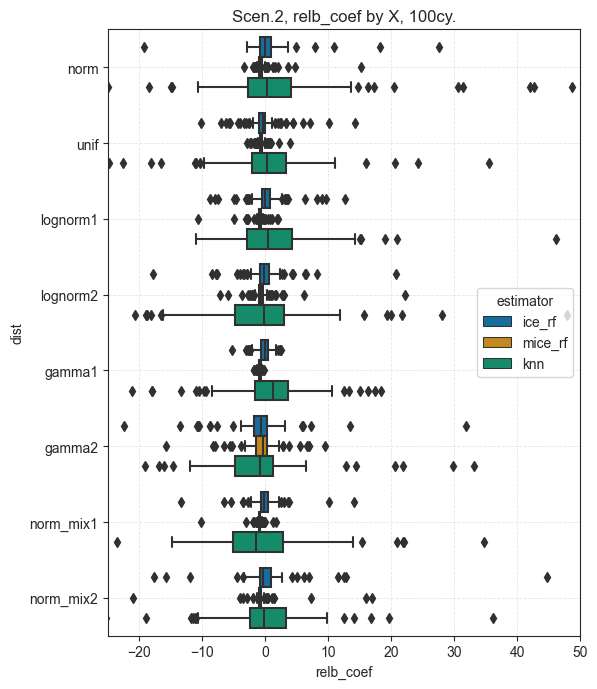

In [119]:
plott(relb_coef_scen2, 2, 'relb_coef', 'X', -25, 50)

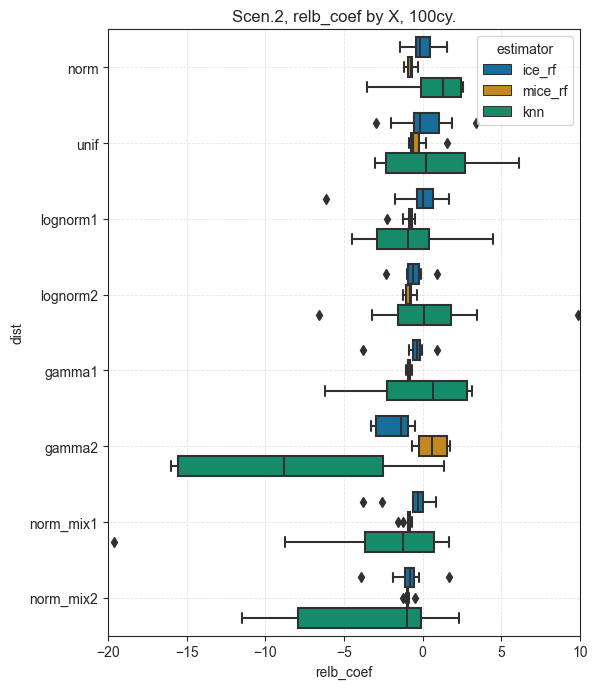

In [113]:
# plott(relb_coef_scen2, 2, 'relb_coef', 'X', -20, 10)

In [57]:
#'logr_quadr', 'logr_inter'

In [59]:
# %%time 

# i = 2
# for sc in tqdm(['logr_quadr', 'logr_inter']):
#     for metric in tqdm(['rel_bias', 'nrmse']):
#         print(sc)
#         globals()[f"{metric}_scen{i}"] = imp(n_cycle = 100, scenar = sc, metrica = metric)
#     i = 4

  0%|          | 0/2 [00:00<?, ?it/s]

logr_quadr




  0%|          | 0/8 [00:00<?, ?it/s]2023-03-10 17:03:08,292 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:03:08,299 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-03-10 17:03:10,768 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:03:10,771 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:03:13,228 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

unif


2023-03-10 17:07:18,078 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:07:18,081 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:07:20,503 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lognorm1


2023-03-10 17:11:21,759 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:11:21,762 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:11:24,339 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lognorm2


2023-03-10 17:15:32,366 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:15:32,369 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:15:34,904 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

gamma1


2023-03-10 17:19:44,447 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:19:44,450 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:19:46,898 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

gamma2


2023-03-10 17:23:55,842 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:23:55,845 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:23:58,256 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

norm_mix1


2023-03-10 17:27:59,550 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:27:59,553 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:28:02,020 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

norm_mix2


2023-03-10 17:32:05,567 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:32:05,571 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:32:08,011 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

logr_quadr




  0%|          | 0/8 [00:00<?, ?it/s]2023-03-10 17:36:12,458 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:36:12,461 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-03-10 17:36:14,850 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:36:14,853 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:36:17,348 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

unif


2023-03-10 17:40:22,811 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:40:22,814 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:40:25,197 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lognorm1


2023-03-10 17:44:23,951 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:44:23,955 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:44:26,415 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

lognorm2


2023-03-10 17:48:32,839 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:48:32,842 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:48:35,402 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

gamma1


2023-03-10 17:52:45,492 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:52:45,495 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:52:47,930 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

gamma2


2023-03-10 17:56:55,803 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 17:56:55,806 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 17:56:58,224 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

norm_mix1


2023-03-10 18:00:59,790 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:00:59,793 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 18:01:02,188 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

norm_mix2


2023-03-10 18:05:06,151 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:05:06,154 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 18:05:08,655 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score un

logr_inter




  0%|          | 0/8 [00:00<?, ?it/s]2023-03-10 18:09:14,727 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 18:09:14,729 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:09:14,732 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-03-10 18:09:19,051 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 18:09:19,052 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:09:19,055 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 18:09:23,311 [WARNING] Indicated weights for incomp

unif


2023-03-10 18:16:26,891 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 18:16:26,893 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:16:26,896 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 18:16:31,171 [WARNING] Indicated weights for incomp

lognorm1


2023-03-10 18:23:23,581 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 18:23:23,583 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:23:23,586 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 18:23:27,828 [WARNING] Indicated weights for incomp

lognorm2


2023-03-10 18:30:27,090 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 18:30:27,091 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:30:27,094 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 18:30:31,395 [WARNING] Indicated weights for incomp

gamma1


2023-03-10 18:37:35,096 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 18:37:35,098 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:37:35,101 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 18:37:39,313 [WARNING] Indicated weights for incomp

gamma2


2023-03-10 18:44:41,261 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 18:44:41,262 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:44:41,265 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 18:44:45,476 [WARNING] Indicated weights for incomp

norm_mix1


2023-03-10 18:51:42,312 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 18:51:42,313 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:51:42,317 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 18:51:46,384 [WARNING] Indicated weights for incomp

norm_mix2


2023-03-10 18:58:38,764 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 18:58:38,765 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 18:58:38,768 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 18:58:42,896 [WARNING] Indicated weights for incomp

logr_inter




  0%|          | 0/8 [00:00<?, ?it/s]2023-03-10 19:05:37,709 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 19:05:37,710 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 19:05:37,713 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.


norm


2023-03-10 19:05:41,997 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 19:05:41,998 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 19:05:42,001 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 19:05:46,178 [WARNING] Indicated weights for incomp

unif


2023-03-10 19:12:50,508 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 19:12:50,509 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 19:12:50,513 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 19:12:54,723 [WARNING] Indicated weights for incomp

lognorm1


2023-03-10 19:19:46,882 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 19:19:46,883 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 19:19:46,886 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 19:19:51,179 [WARNING] Indicated weights for incomp

lognorm2


2023-03-10 19:26:51,740 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 19:26:51,742 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 19:26:51,745 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 19:26:56,004 [WARNING] Indicated weights for incomp

gamma1


2023-03-10 19:33:59,104 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 19:33:59,105 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 19:33:59,108 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 19:34:03,328 [WARNING] Indicated weights for incomp

gamma2


2023-03-10 19:41:03,882 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 19:41:03,884 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 19:41:03,887 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 19:41:08,027 [WARNING] Indicated weights for incomp

norm_mix1


2023-03-10 19:48:05,102 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 19:48:05,103 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 19:48:05,106 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 19:48:09,204 [WARNING] Indicated weights for incomp

norm_mix2


2023-03-10 19:55:02,783 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?
2023-03-10 19:55:02,784 [WARNING] Binary variables (at indices [1]) are indicated to be used in amputation (they are weighted and will be used to calculate the weighted sum score under MAR, MNAR, or MAR+MNAR). This can result in a subset with candidates that all have the same (or almost the same) weighted sum scores. 
2023-03-10 19:55:02,787 [WARNING] Candidates for pattern 0 all have almost the same weighted sum scores. It is possible this is due to the use of binary variables in amputation. This creates problems when using the sigmoid function for the score_to_probability_func. Currently our solution is as follows: if there is just one candidate with a sum score 0, we will ampute it. If there is one candidate with a nonzero sum score, or multiple candidates with the same score, we evenly apply as if MCAR.
2023-03-10 19:55:07,011 [WARNING] Indicated weights for incomp

CPU times: user 3h 8min 15s, sys: 51min 26s, total: 3h 59min 42s
Wall time: 2h 58min 55s


In [67]:
# nrmse_scen4.to_csv('nrmse_scen4.csv', index=False) 

In [90]:
nrmse_scen2

,dist,estimator,col,nrmse
0,norm,ice_rf,X,0.508030
0,norm,ice_rf,X^2,0.533694
0,norm,mice_rf,X,0.508086
0,norm,mice_rf,X^2,0.533775
0,norm,knn,X,0.510842
...,...,...,...,...
0,norm_mix2,ice_rf,X^2,0.471106
0,norm_mix2,mice_rf,X,0.493602
0,norm_mix2,mice_rf,X^2,0.471095
0,norm_mix2,knn,X,0.495852


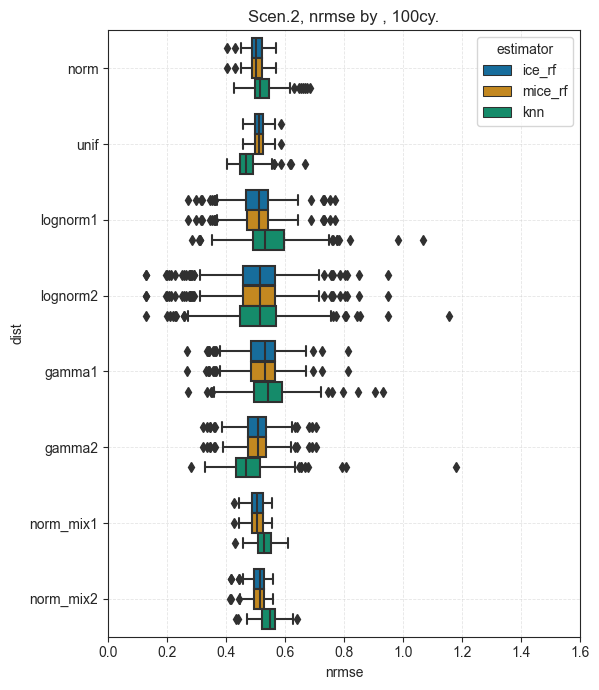

In [91]:
plott_nrmse(nrmse_scen2, 2, 'nrmse', 0, 1.6)

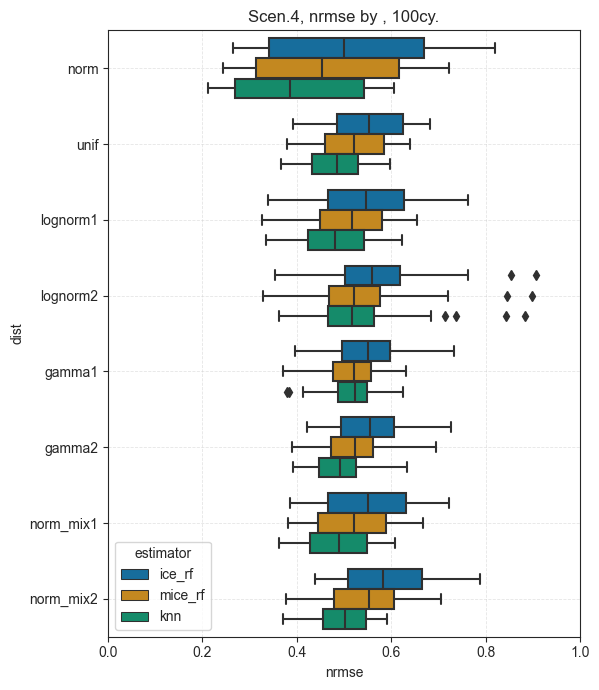

In [93]:
plott_nrmse(nrmse_scen4, 4, 'nrmse', 0, 1)

# Sc.1, sc.3: 'rel_bias'; 100 cy

In [48]:
# %%time 

# i = 1
# for sc in tqdm(['lr_quadr', 'lr_inter']):
#     print(sc)
#     globals()[f"rel_bias_scen{i}_100cy"] = imp(n_cycle = 100, scenar = sc, metrica = 'rel_bias')
#     i += 1

  0%|          | 0/2 [00:00<?, ?it/s]

lr_quadr



  0%|          | 0/8 [00:00<?, ?it/s]

norm




  0%|          | 0/100 [00:00<?, ?it/s]

  1%|          | 1/100 [00:02<03:19,  2.02s/it]

  2%|▏         | 2/100 [00:03<03:14,  1.98s/it]

  3%|▎         | 3/100 [00:05<03:09,  1.95s/it]

  4%|▍         | 4/100 [00:08<03:15,  2.04s/it]

  5%|▌         | 5/100 [00:09<03:10,  2.00s/it]

  6%|▌         | 6/100 [00:11<03:05,  1.97s/it]

  7%|▋         | 7/100 [00:13<03:02,  1.96s/it]

  8%|▊         | 8/100 [00:15<02:58,  1.94s/it]

  9%|▉         | 9/100 [00:17<02:57,  1.95s/it]

 10%|█         | 10/100 [00:19<02:54,  1.94s/it]

 11%|█         | 11/100 [00:21<02:52,  1.93s/it]

 12%|█▏        | 12/100 [00:23<02:50,  1.94s/it]

 13%|█▎        | 13/100 [00:25<02:49,  1.95s/it]

 14%|█▍        | 14/100 [00:27<02:46,  1.94s/it]

 15%|█▌        | 15/100 [00:29<02:43,  1.93s/it]

 16%|█▌        | 16/100 [00:31<02:41,  1.93s/it]

 17%|█▋        | 17/100 [00:33<02:40,  1.93s/it]

 18%|█▊        | 18/100 [00:35<02:38,  1.94s/it]

 19%|█▉        | 19/100 [00:37<02:37,  1.94s/it]

 20%|██        |

unif




  0%|          | 0/100 [00:00<?, ?it/s]

  1%|          | 1/100 [00:01<03:17,  1.99s/it]

  2%|▏         | 2/100 [00:03<03:13,  1.97s/it]

  3%|▎         | 3/100 [00:05<03:10,  1.97s/it]

  4%|▍         | 4/100 [00:07<03:08,  1.97s/it]

  5%|▌         | 5/100 [00:09<03:06,  1.96s/it]

  6%|▌         | 6/100 [00:11<03:04,  1.96s/it]

  7%|▋         | 7/100 [00:13<03:02,  1.97s/it]

  8%|▊         | 8/100 [00:15<03:00,  1.96s/it]

  9%|▉         | 9/100 [00:17<03:04,  2.03s/it]

 10%|█         | 10/100 [00:19<03:00,  2.00s/it]

 11%|█         | 11/100 [00:21<02:57,  1.99s/it]

 12%|█▏        | 12/100 [00:23<02:54,  1.98s/it]

 13%|█▎        | 13/100 [00:25<02:52,  1.98s/it]

 14%|█▍        | 14/100 [00:27<02:49,  1.98s/it]

 15%|█▌        | 15/100 [00:29<02:47,  1.97s/it]

 16%|█▌        | 16/100 [00:31<02:45,  1.96s/it]

 17%|█▋        | 17/100 [00:33<02:44,  1.98s/it]

 18%|█▊        | 18/100 [00:35<02:41,  1.97s/it]

 19%|█▉        | 19/100 [00:37<02:39,  1.97s/it]

 20%|██        |

lognorm1




  0%|          | 0/100 [00:00<?, ?it/s]

  1%|          | 1/100 [00:01<03:14,  1.97s/it]

  2%|▏         | 2/100 [00:03<03:13,  1.98s/it]

  3%|▎         | 3/100 [00:05<03:11,  1.98s/it]

  4%|▍         | 4/100 [00:07<03:09,  1.97s/it]

  5%|▌         | 5/100 [00:09<03:07,  1.97s/it]

  6%|▌         | 6/100 [00:11<03:05,  1.97s/it]

  7%|▋         | 7/100 [00:13<03:04,  1.98s/it]

  8%|▊         | 8/100 [00:15<03:02,  1.98s/it]

  9%|▉         | 9/100 [00:17<03:00,  1.98s/it]

 10%|█         | 10/100 [00:19<02:57,  1.97s/it]

 11%|█         | 11/100 [00:21<02:55,  1.97s/it]

 12%|█▏        | 12/100 [00:23<02:53,  1.97s/it]

 13%|█▎        | 13/100 [00:25<02:52,  1.98s/it]

 14%|█▍        | 14/100 [00:27<02:50,  1.98s/it]

 15%|█▌        | 15/100 [00:29<02:50,  2.01s/it]

 16%|█▌        | 16/100 [00:31<02:50,  2.02s/it]

 17%|█▋        | 17/100 [00:33<02:48,  2.03s/it]

 18%|█▊        | 18/100 [00:35<02:45,  2.01s/it]

 19%|█▉        | 19/100 [00:37<02:42,  2.00s/it]

 20%|██        |

lognorm2




  0%|          | 0/100 [00:00<?, ?it/s]

  1%|          | 1/100 [00:01<03:17,  1.99s/it]

  2%|▏         | 2/100 [00:03<03:14,  1.99s/it]

  3%|▎         | 3/100 [00:05<03:14,  2.00s/it]

  4%|▍         | 4/100 [00:08<03:12,  2.00s/it]

  5%|▌         | 5/100 [00:10<03:10,  2.00s/it]

  6%|▌         | 6/100 [00:11<03:08,  2.00s/it]

  7%|▋         | 7/100 [00:13<03:05,  2.00s/it]

  8%|▊         | 8/100 [00:15<03:03,  2.00s/it]

  9%|▉         | 9/100 [00:18<03:03,  2.01s/it]

 10%|█         | 10/100 [00:20<03:00,  2.01s/it]

 11%|█         | 11/100 [00:22<02:59,  2.01s/it]

 12%|█▏        | 12/100 [00:24<02:58,  2.02s/it]

 13%|█▎        | 13/100 [00:26<02:55,  2.01s/it]

 14%|█▍        | 14/100 [00:28<02:52,  2.01s/it]

 15%|█▌        | 15/100 [00:30<02:50,  2.01s/it]

 16%|█▌        | 16/100 [00:32<02:48,  2.01s/it]

 17%|█▋        | 17/100 [00:34<02:46,  2.00s/it]

 18%|█▊        | 18/100 [00:36<02:44,  2.01s/it]

 19%|█▉        | 19/100 [00:38<02:46,  2.05s/it]

 20%|██        |

gamma1




  0%|          | 0/100 [00:00<?, ?it/s]

  1%|          | 1/100 [00:01<03:15,  1.97s/it]

  2%|▏         | 2/100 [00:03<03:13,  1.97s/it]

  3%|▎         | 3/100 [00:05<03:13,  2.00s/it]

  4%|▍         | 4/100 [00:07<03:12,  2.00s/it]

  5%|▌         | 5/100 [00:09<03:09,  1.99s/it]

  6%|▌         | 6/100 [00:11<03:07,  1.99s/it]

  7%|▋         | 7/100 [00:13<03:05,  2.00s/it]

  8%|▊         | 8/100 [00:16<03:05,  2.02s/it]

  9%|▉         | 9/100 [00:18<03:04,  2.03s/it]

 10%|█         | 10/100 [00:20<03:01,  2.02s/it]

 11%|█         | 11/100 [00:22<02:58,  2.01s/it]

 12%|█▏        | 12/100 [00:24<02:55,  2.00s/it]

 13%|█▎        | 13/100 [00:26<02:53,  1.99s/it]

 14%|█▍        | 14/100 [00:28<02:51,  2.00s/it]

 15%|█▌        | 15/100 [00:30<02:50,  2.00s/it]

 16%|█▌        | 16/100 [00:32<02:47,  2.00s/it]

 17%|█▋        | 17/100 [00:33<02:45,  1.99s/it]

 18%|█▊        | 18/100 [00:35<02:43,  1.99s/it]

 19%|█▉        | 19/100 [00:37<02:40,  1.98s/it]

 20%|██        |

gamma2




  0%|          | 0/100 [00:00<?, ?it/s]

  1%|          | 1/100 [00:01<03:14,  1.97s/it]

  2%|▏         | 2/100 [00:03<03:12,  1.97s/it]

  3%|▎         | 3/100 [00:05<03:12,  1.98s/it]

  4%|▍         | 4/100 [00:07<03:11,  2.00s/it]

  5%|▌         | 5/100 [00:09<03:08,  1.98s/it]

  6%|▌         | 6/100 [00:11<03:05,  1.98s/it]

  7%|▋         | 7/100 [00:13<03:03,  1.97s/it]

  8%|▊         | 8/100 [00:15<03:00,  1.97s/it]

  9%|▉         | 9/100 [00:17<02:58,  1.96s/it]

 10%|█         | 10/100 [00:19<02:56,  1.96s/it]

 11%|█         | 11/100 [00:21<02:55,  1.98s/it]

 12%|█▏        | 12/100 [00:23<02:53,  1.97s/it]

 13%|█▎        | 13/100 [00:25<02:51,  1.97s/it]

 14%|█▍        | 14/100 [00:27<02:49,  1.97s/it]

 15%|█▌        | 15/100 [00:29<02:47,  1.97s/it]

 16%|█▌        | 16/100 [00:31<02:45,  1.97s/it]

 17%|█▋        | 17/100 [00:33<02:43,  1.97s/it]

 18%|█▊        | 18/100 [00:35<02:41,  1.97s/it]

 19%|█▉        | 19/100 [00:37<02:39,  1.97s/it]

 20%|██        |

norm_mix1




  0%|          | 0/100 [00:00<?, ?it/s]

  1%|          | 1/100 [00:01<03:12,  1.95s/it]

  2%|▏         | 2/100 [00:03<03:10,  1.94s/it]

  3%|▎         | 3/100 [00:05<03:08,  1.94s/it]

  4%|▍         | 4/100 [00:07<03:06,  1.94s/it]

  5%|▌         | 5/100 [00:09<03:04,  1.95s/it]

  6%|▌         | 6/100 [00:11<03:02,  1.95s/it]

  7%|▋         | 7/100 [00:13<03:01,  1.95s/it]

  8%|▊         | 8/100 [00:15<02:59,  1.95s/it]

  9%|▉         | 9/100 [00:17<02:57,  1.95s/it]

 10%|█         | 10/100 [00:19<02:55,  1.95s/it]

 11%|█         | 11/100 [00:21<02:53,  1.95s/it]

 12%|█▏        | 12/100 [00:23<02:50,  1.94s/it]

 13%|█▎        | 13/100 [00:25<02:49,  1.94s/it]

 14%|█▍        | 14/100 [00:27<02:46,  1.94s/it]

 15%|█▌        | 15/100 [00:29<02:45,  1.95s/it]

 16%|█▌        | 16/100 [00:31<02:44,  1.96s/it]

 17%|█▋        | 17/100 [00:33<02:43,  1.97s/it]

 18%|█▊        | 18/100 [00:35<02:40,  1.96s/it]

 19%|█▉        | 19/100 [00:37<02:38,  1.96s/it]

 20%|██        |

norm_mix2




  0%|          | 0/100 [00:00<?, ?it/s]

  1%|          | 1/100 [00:02<03:22,  2.04s/it]

  2%|▏         | 2/100 [00:04<03:16,  2.00s/it]

  3%|▎         | 3/100 [00:05<03:13,  1.99s/it]

  4%|▍         | 4/100 [00:07<03:10,  1.99s/it]

  5%|▌         | 5/100 [00:09<03:08,  1.99s/it]

  6%|▌         | 6/100 [00:11<03:07,  1.99s/it]

  7%|▋         | 7/100 [00:13<03:05,  1.99s/it]

  8%|▊         | 8/100 [00:15<03:02,  1.99s/it]

  9%|▉         | 9/100 [00:17<03:00,  1.99s/it]

 10%|█         | 10/100 [00:19<02:58,  1.99s/it]

 11%|█         | 11/100 [00:21<02:56,  1.99s/it]

 12%|█▏        | 12/100 [00:23<02:54,  1.98s/it]

 13%|█▎        | 13/100 [00:25<02:52,  1.99s/it]

 14%|█▍        | 14/100 [00:27<02:51,  1.99s/it]

 15%|█▌        | 15/100 [00:29<02:49,  1.99s/it]

 16%|█▌        | 16/100 [00:31<02:46,  1.99s/it]

 17%|█▋        | 17/100 [00:33<02:45,  1.99s/it]

 18%|█▊        | 18/100 [00:35<02:42,  1.98s/it]

 19%|█▉        | 19/100 [00:37<02:43,  2.02s/it]

 20%|██        |

lr_inter



  0%|          | 0/8 [00:00<?, ?it/s]

norm




  0%|          | 0/100 [00:00<?, ?it/s]2023-03-05 15:32:03,840 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  1%|          | 1/100 [00:03<05:16,  3.20s/it]2023-03-05 15:32:07,037 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  2%|▏         | 2/100 [00:06<05:10,  3.17s/it]2023-03-05 15:32:10,188 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  3%|▎         | 3/100 [00:09<05:02,  3.12s/it]2023-03-05 15:32:13,239 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  4%|▍         | 4/100 [00:12<04:54,  3.07s/it]2023-03-05 15:32:16,241 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  5%|▌         | 5/100 [00:15<04:48,  3.04s/it]2023-03-05 15:32:19,231 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


unif




  0%|          | 0/100 [00:00<?, ?it/s]2023-03-05 15:37:13,060 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  1%|          | 1/100 [00:03<05:31,  3.34s/it]2023-03-05 15:37:16,403 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  2%|▏         | 2/100 [00:06<05:21,  3.28s/it]2023-03-05 15:37:19,636 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  3%|▎         | 3/100 [00:09<05:06,  3.16s/it]2023-03-05 15:37:22,662 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  4%|▍         | 4/100 [00:12<05:03,  3.17s/it]2023-03-05 15:37:25,832 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  5%|▌         | 5/100 [00:15<04:55,  3.11s/it]2023-03-05 15:37:28,837 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


lognorm1




  0%|          | 0/100 [00:00<?, ?it/s]2023-03-05 15:42:26,265 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  1%|          | 1/100 [00:03<05:17,  3.21s/it]2023-03-05 15:42:29,441 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  2%|▏         | 2/100 [00:06<05:10,  3.17s/it]2023-03-05 15:42:32,577 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  3%|▎         | 3/100 [00:09<05:00,  3.10s/it]2023-03-05 15:42:35,591 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  4%|▍         | 4/100 [00:12<04:54,  3.07s/it]2023-03-05 15:42:38,620 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  5%|▌         | 5/100 [00:15<04:50,  3.06s/it]2023-03-05 15:42:41,651 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


lognorm2




  0%|          | 0/100 [00:00<?, ?it/s]2023-03-05 15:47:35,671 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  1%|          | 1/100 [00:03<05:02,  3.06s/it]2023-03-05 15:47:38,726 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  2%|▏         | 2/100 [00:06<05:02,  3.09s/it]2023-03-05 15:47:41,833 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  3%|▎         | 3/100 [00:09<04:57,  3.07s/it]2023-03-05 15:47:44,885 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  4%|▍         | 4/100 [00:12<04:53,  3.06s/it]2023-03-05 15:47:47,936 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  5%|▌         | 5/100 [00:15<04:52,  3.08s/it]2023-03-05 15:47:51,054 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


gamma1




  0%|          | 0/100 [00:00<?, ?it/s]2023-03-05 15:52:48,555 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  1%|          | 1/100 [00:03<05:02,  3.05s/it]2023-03-05 15:52:51,608 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  2%|▏         | 2/100 [00:06<05:01,  3.07s/it]2023-03-05 15:52:54,697 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  3%|▎         | 3/100 [00:09<04:56,  3.06s/it]2023-03-05 15:52:57,737 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  4%|▍         | 4/100 [00:12<04:53,  3.06s/it]2023-03-05 15:53:00,803 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  5%|▌         | 5/100 [00:15<04:50,  3.06s/it]2023-03-05 15:53:03,860 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


gamma2




  0%|          | 0/100 [00:00<?, ?it/s]2023-03-05 15:57:58,392 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  1%|          | 1/100 [00:03<05:09,  3.13s/it]2023-03-05 15:58:01,518 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  2%|▏         | 2/100 [00:06<05:05,  3.12s/it]2023-03-05 15:58:04,637 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  3%|▎         | 3/100 [00:09<05:03,  3.13s/it]2023-03-05 15:58:07,777 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  4%|▍         | 4/100 [00:12<04:58,  3.11s/it]2023-03-05 15:58:10,853 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  5%|▌         | 5/100 [00:15<04:54,  3.10s/it]2023-03-05 15:58:13,940 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


norm_mix1




  0%|          | 0/100 [00:00<?, ?it/s]2023-03-05 16:03:08,186 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  1%|          | 1/100 [00:03<04:59,  3.02s/it]2023-03-05 16:03:11,208 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  2%|▏         | 2/100 [00:06<04:55,  3.02s/it]2023-03-05 16:03:14,220 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  3%|▎         | 3/100 [00:09<04:53,  3.02s/it]2023-03-05 16:03:17,253 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  4%|▍         | 4/100 [00:12<04:51,  3.04s/it]2023-03-05 16:03:20,317 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  5%|▌         | 5/100 [00:15<04:49,  3.04s/it]2023-03-05 16:03:23,364 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


norm_mix2




  0%|          | 0/100 [00:00<?, ?it/s]2023-03-05 16:08:14,367 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  1%|          | 1/100 [00:03<05:03,  3.07s/it]2023-03-05 16:08:17,434 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  2%|▏         | 2/100 [00:06<05:01,  3.07s/it]2023-03-05 16:08:20,513 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  3%|▎         | 3/100 [00:09<05:02,  3.12s/it]2023-03-05 16:08:23,680 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  4%|▍         | 4/100 [00:12<05:01,  3.14s/it]2023-03-05 16:08:26,861 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


  5%|▌         | 5/100 [00:15<04:55,  3.11s/it]2023-03-05 16:08:29,912 [WARNING] Indicated weights for incomplete vars for a pattern with MAR. Did you mean MAR+MNAR?


CPU times: user 1h 7min 36s, sys: 2min 10s, total: 1h 9min 46s
Wall time: 1h 7min 53s


In [51]:
#rel_bias_scen1_100cy.to_csv('rel_bias_scen1_100cy.csv', index=False) 

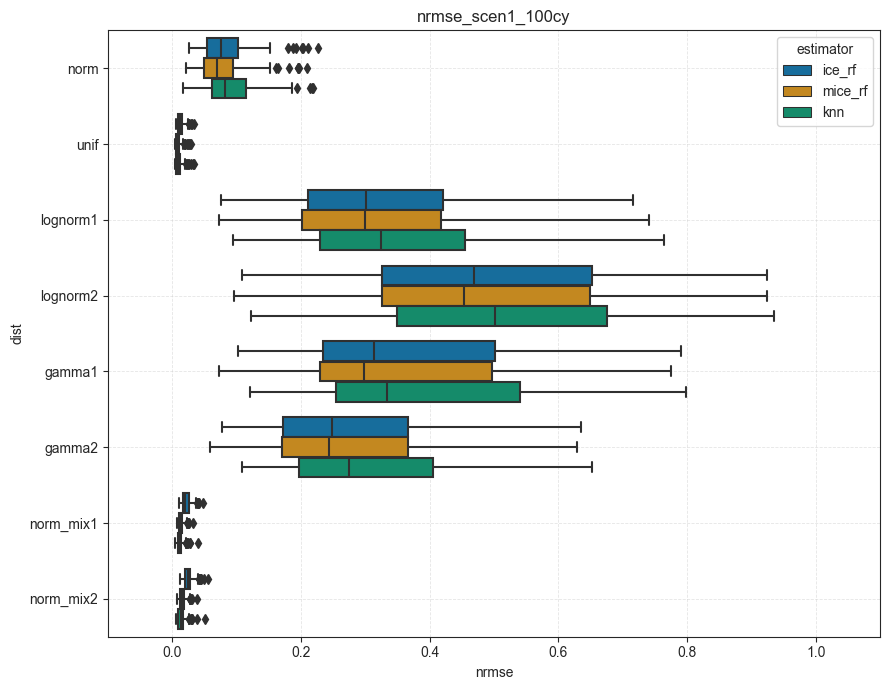

In [18]:
# plt.figure(figsize =  (9, 7))

# sns.boxplot(x = 'nrmse', y = 'dist', 
#                  data = nrmse_scen1_100cy, 
#                  palette="colorblind",
#                  hue='estimator')

# plt.grid(alpha = 0.5, linestyle = '--', linewidth = 0.6)
# plt.title("nrmse_scen1_100cy")
# plt.tight_layout()
# plt.xlim(-0.1, 1.1)
# plt.show()

In [ ]:
# nrmse_scen2_100cy